In [5]:
import numpy as np
import glob
import struct
import time
from net import nn2L
from net import nn1L
from tools import normalization
import matplotlib.pyplot as plt
import cv2
import os
import random

In [2]:
val_df=list()
f = open('../val.txt')
for line in f.readlines():
    #print(line)
    x = line.split()
    val_df.append(x)
f.close

valdata = np.zeros(shape=(1,3,32,32),dtype=int)
valdata_y = []
for i in range(len(val_df)):
    p1_1 = cv2.imread("../"+val_df[i][0])
    p1_2 = cv2.resize(p1_1, (32, 32))
    p1_2 = np.swapaxes(p1_2,0,2)
    p1_2 = np.swapaxes(p1_2,1,2)
    valdata = np.append(valdata,[p1_2], axis=0)
    valdata_y.append(int(val_df[i][1]))
valdata = valdata[1:]

print(valdata.shape)

valdata_y = np.array(valdata_y)
print(len(valdata_y))

(450, 3, 32, 32)
450


In [3]:
test_df=list()
f = open('../test.txt')
for line in f.readlines():
    #print(line)
    x = line.split()
    test_df.append(x)
f.close

testdata = np.zeros(shape=(1,3,32,32),dtype=int)
testdata_y = []
for i in range(len(test_df)):
    p1_1 = cv2.imread("../"+test_df[i][0])
    p1_2 = cv2.resize(p1_1, (32, 32))
    p1_2 = np.swapaxes(p1_2,0,2)
    p1_2 = np.swapaxes(p1_2,1,2)
    testdata = np.append(testdata,[p1_2], axis=0)
    testdata_y.append(int(test_df[i][1]))
testdata = testdata[1:]

print(testdata.shape)

testdata_y = np.array(testdata_y)
print(len(testdata_y))

(450, 3, 32, 32)
450


In [ ]:
train_df=list()
f = open('../train.txt')
for line in f.readlines():
    #print(line)
    x = line.split()
    train_df.append(x)
f.close

traindata = np.zeros(shape=(1,3,32,32),dtype=int)
traindata_y = []
for i in range(lan(train_df)):
    p1_1 = cv2.imread("../"+train_df[i][0])
    p1_2 = cv2.resize(p1_1, (32, 32))
    p1_2 = np.swapaxes(p1_2,0,2)
    p1_2 = np.swapaxes(p1_2,1,2)
    p1_2 = p1_2.reshape(1, 3, 32, 32)
    traindata = np.concatenate((traindata, p1_2), axis=0)
    traindata_y.append(int(train_df[i][1]))
    if i %1000 ==0:
        print(time.strftime("%Y-%m-%d %H:%M:%S"),"finish:",i)
traindata = traindata[1:]

print(traindata.shape)

traindata_y = np.array(traindata_y)
print(len(traindata_y))

np.save("traindata32.npy",traindata)
np.save("traindata_y.npy",traindata_y)

In [4]:
traindata = np.load("traindata32.npy")
traindata_y = np.load("traindata_y.npy")

rl = list(range(len(traindata)))
random.shuffle(rl)

traindata = traindata[rl]
traindata_y = traindata_y[rl]

In [8]:
batch_size = 100  # 训练时的batch size
test_batch = 45  # 测试时的batch size
epoch = 10
learning_rate = 1e-3

ax = []  # 保存训练过程中x轴的数据（训练次数）用于画图
ay_loss = []  # 保存训练过程中y轴的数据（loss）用于画图
ay_acc = []
testx = [] # 保存测试过程中x轴的数据（训练次数）用于画图
testy_acc = []  # 保存测试过程中y轴的数据（loss）用于画图
plt.ion()   # 打开交互模式
iterations_num = 0 # 记录训练的迭代次数

net = nn2L.nn2L()

2023-04-18 21:17:13   epoch:    1 , batch:   50 , avg_batch_acc:0.0244 , avg_batch_loss:0.0708 , lr:0.001000 


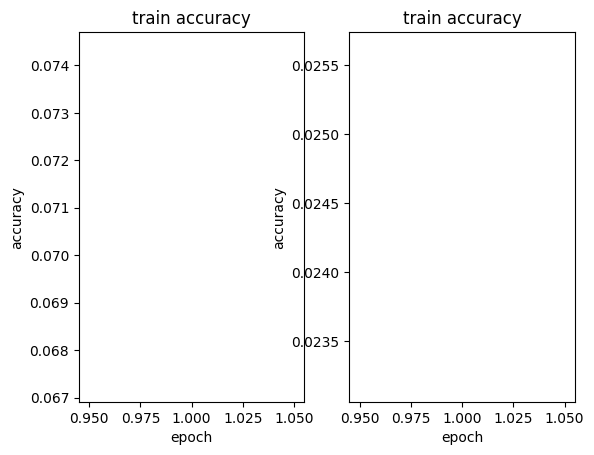

2023-04-18 21:17:23   epoch:    1 , batch:  100 , avg_batch_acc:0.0216 , avg_batch_loss:0.0631 , lr:0.001000 


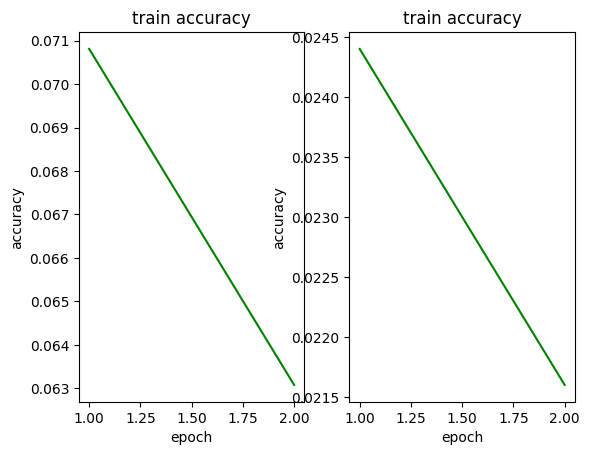

2023-04-18 21:17:34   epoch:    1 , batch:  150 , avg_batch_acc:0.0310 , avg_batch_loss:0.0595 , lr:0.001000 


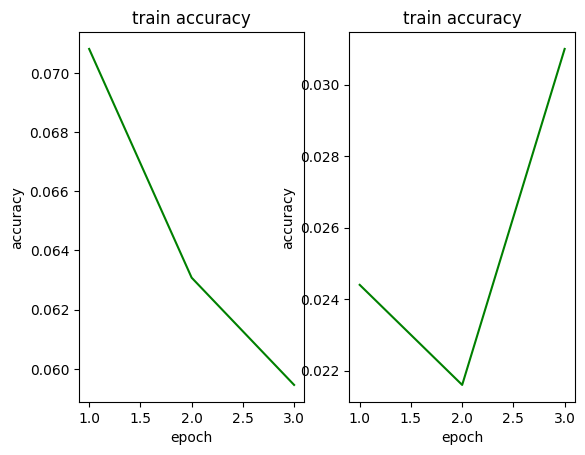

2023-04-18 21:17:45   epoch:    1 , batch:  200 , avg_batch_acc:0.0254 , avg_batch_loss:0.0573 , lr:0.001000 


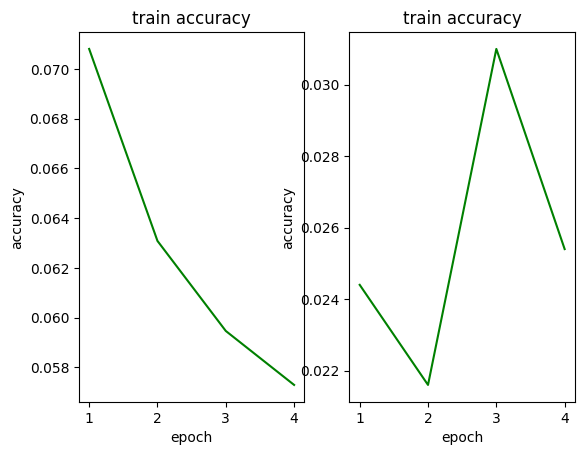

2023-04-18 21:17:56   epoch:    1 , batch:  250 , avg_batch_acc:0.0312 , avg_batch_loss:0.0549 , lr:0.001000 


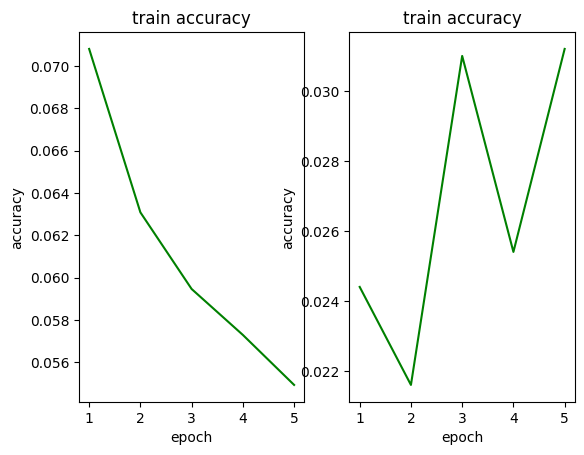

2023-04-18 21:18:06   epoch:    1 , batch:  300 , avg_batch_acc:0.0374 , avg_batch_loss:0.0534 , lr:0.001000 


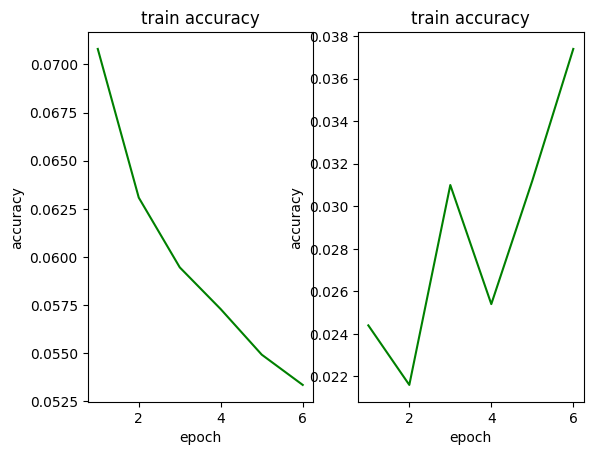

2023-04-18 21:18:17   epoch:    1 , batch:  350 , avg_batch_acc:0.0334 , avg_batch_loss:0.0520 , lr:0.001000 


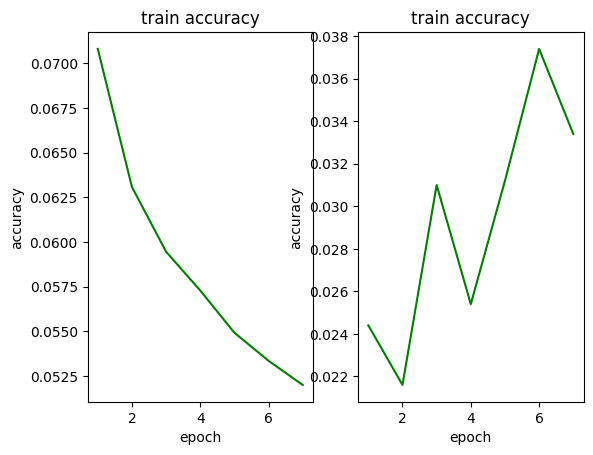

2023-04-18 21:18:28   epoch:    1 , batch:  400 , avg_batch_acc:0.0402 , avg_batch_loss:0.0504 , lr:0.001000 


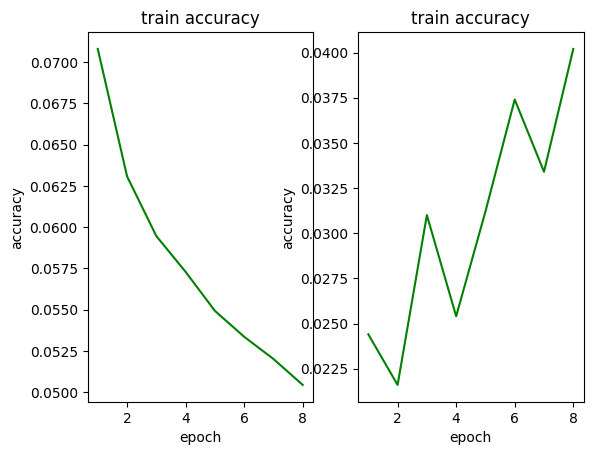

2023-04-18 21:18:39   epoch:    1 , batch:  450 , avg_batch_acc:0.0388 , avg_batch_loss:0.0499 , lr:0.001000 


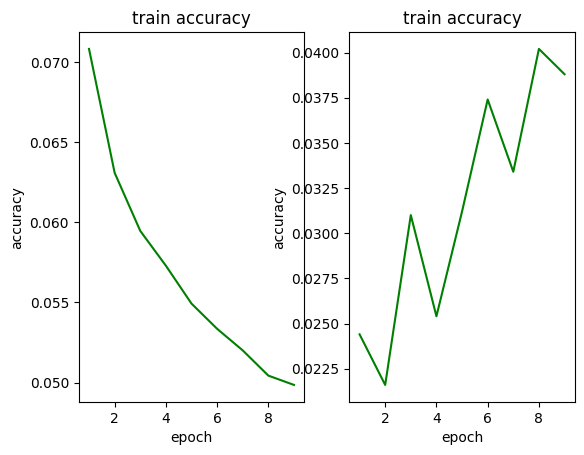

2023-04-18 21:18:50   epoch:    1 , batch:  500 , avg_batch_acc:0.0452 , avg_batch_loss:0.0493 , lr:0.001000 


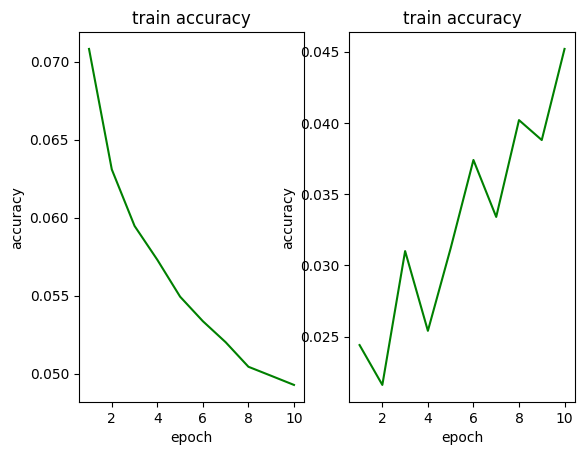

2023-04-18 21:19:01   epoch:    1 , batch:  550 , avg_batch_acc:0.0374 , avg_batch_loss:0.0486 , lr:0.001000 


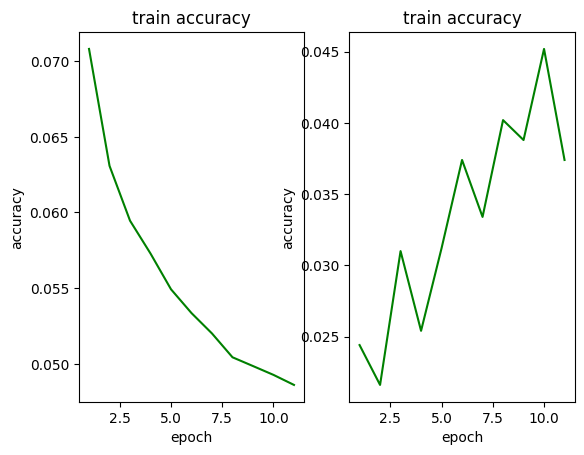

2023-04-18 21:19:12   epoch:    1 , batch:  600 , avg_batch_acc:0.0416 , avg_batch_loss:0.0484 , lr:0.001000 


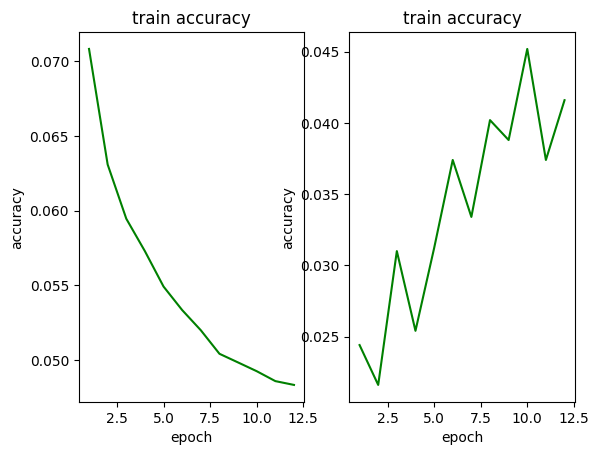

2023-04-18 21:19:19    **********epoch:    1 , avg_epoch_acc:0.0346 , avg_epoch_loss:0.0544 *************
------------test_set_acc:0.0400---------------


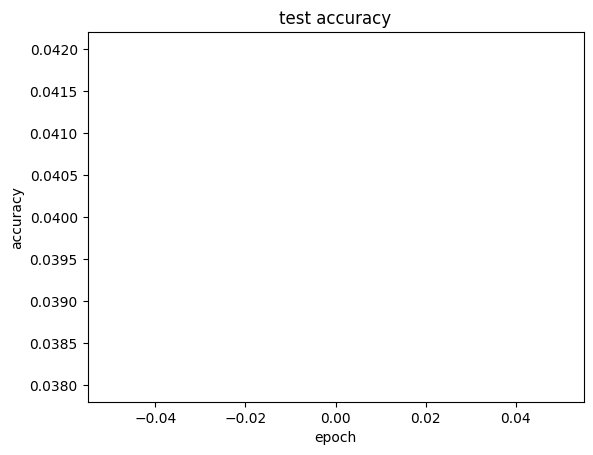

2023-04-18 21:19:29   epoch:    2 , batch:   50 , avg_batch_acc:0.0468 , avg_batch_loss:0.0467 , lr:0.001000 


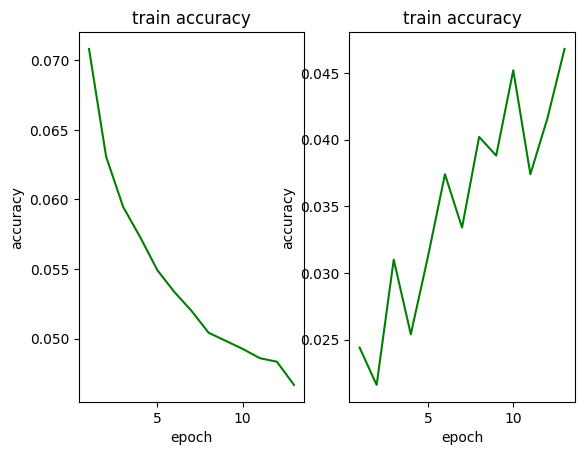

2023-04-18 21:19:40   epoch:    2 , batch:  100 , avg_batch_acc:0.0468 , avg_batch_loss:0.0461 , lr:0.001000 


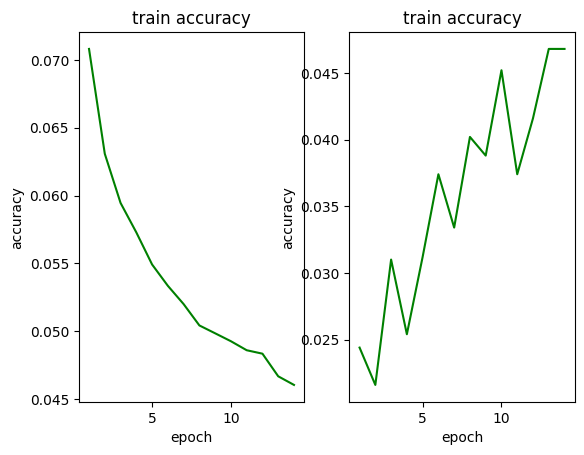

2023-04-18 21:19:51   epoch:    2 , batch:  150 , avg_batch_acc:0.0530 , avg_batch_loss:0.0462 , lr:0.001000 


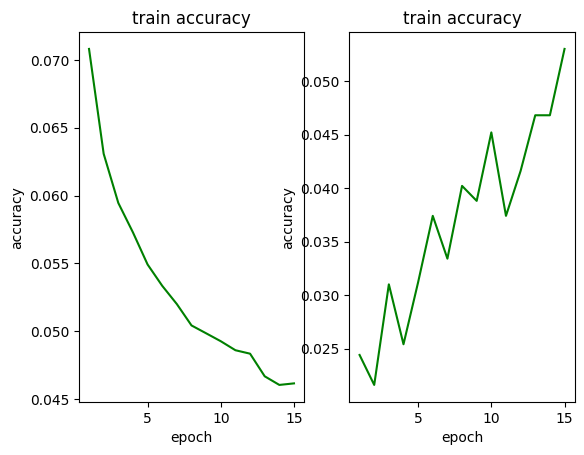

2023-04-18 21:20:01   epoch:    2 , batch:  200 , avg_batch_acc:0.0452 , avg_batch_loss:0.0463 , lr:0.001000 


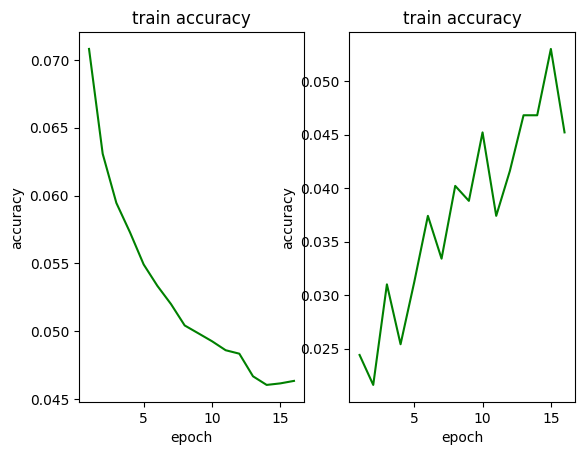

2023-04-18 21:20:12   epoch:    2 , batch:  250 , avg_batch_acc:0.0500 , avg_batch_loss:0.0460 , lr:0.001000 


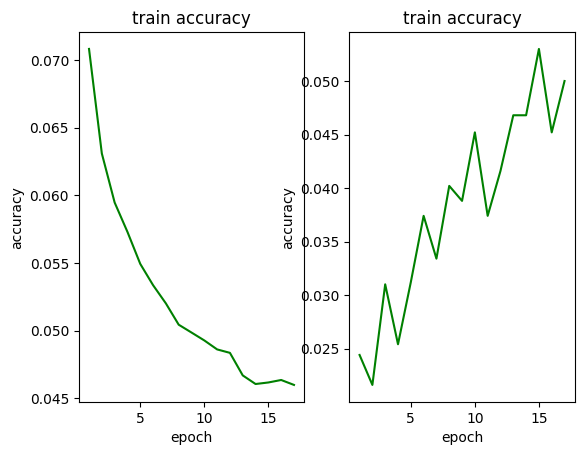

2023-04-18 21:20:23   epoch:    2 , batch:  300 , avg_batch_acc:0.0576 , avg_batch_loss:0.0454 , lr:0.001000 


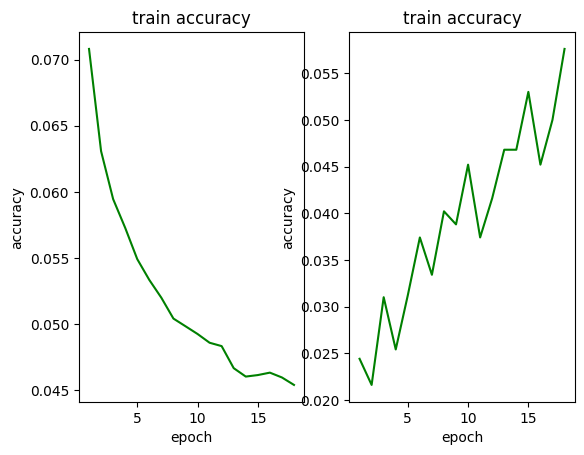

2023-04-18 21:20:33   epoch:    2 , batch:  350 , avg_batch_acc:0.0514 , avg_batch_loss:0.0452 , lr:0.001000 


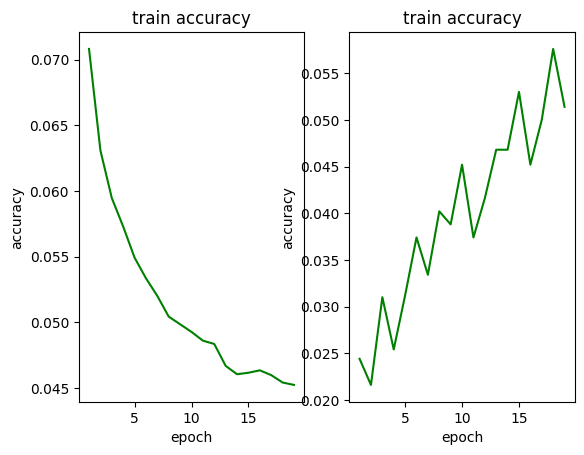

2023-04-18 21:20:44   epoch:    2 , batch:  400 , avg_batch_acc:0.0508 , avg_batch_loss:0.0449 , lr:0.001000 


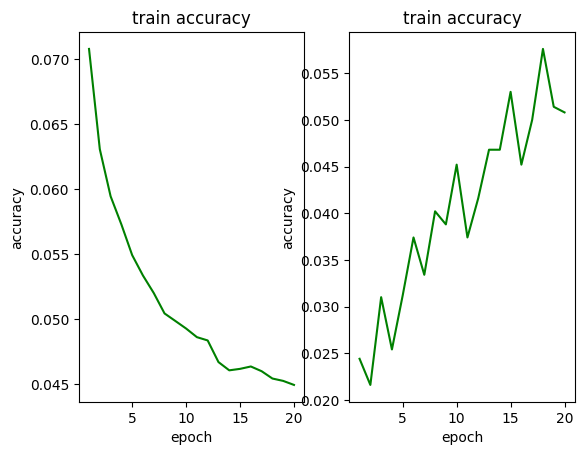

2023-04-18 21:20:55   epoch:    2 , batch:  450 , avg_batch_acc:0.0520 , avg_batch_loss:0.0448 , lr:0.001000 


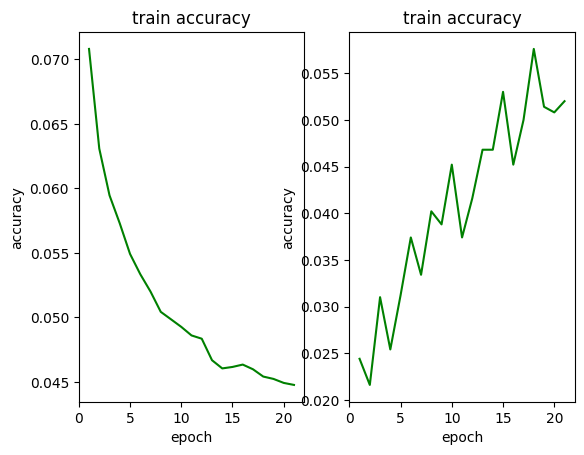

2023-04-18 21:21:05   epoch:    2 , batch:  500 , avg_batch_acc:0.0562 , avg_batch_loss:0.0448 , lr:0.001000 


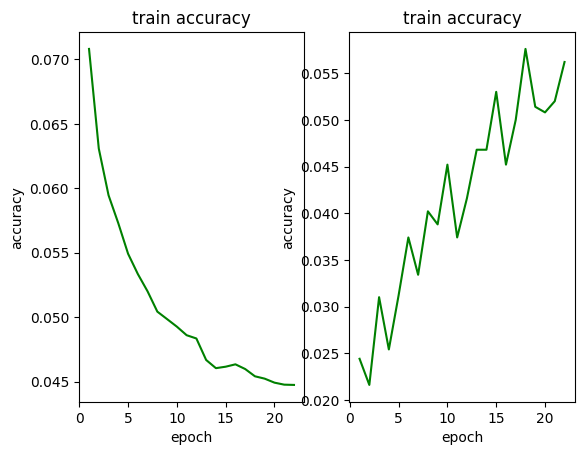

2023-04-18 21:21:16   epoch:    2 , batch:  550 , avg_batch_acc:0.0536 , avg_batch_loss:0.0443 , lr:0.001000 


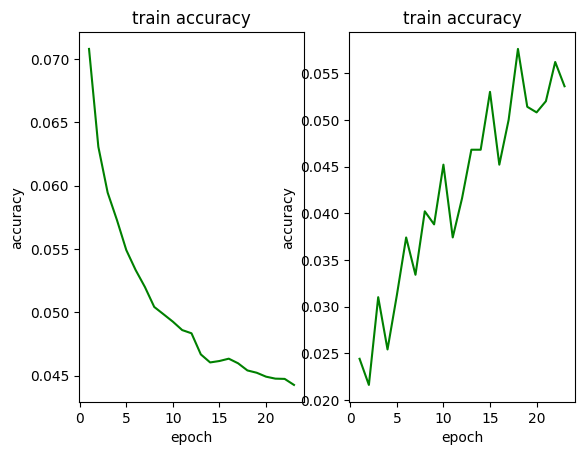

2023-04-18 21:21:26   epoch:    2 , batch:  600 , avg_batch_acc:0.0544 , avg_batch_loss:0.0446 , lr:0.001000 


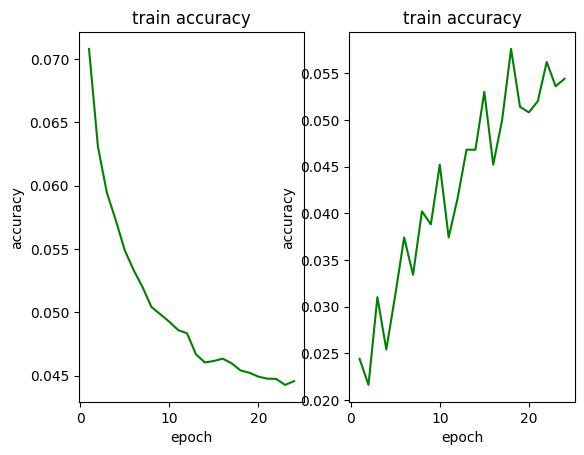

2023-04-18 21:21:33    **********epoch:    2 , avg_epoch_acc:0.0518 , avg_epoch_loss:0.0454 *************
------------test_set_acc:0.0467---------------


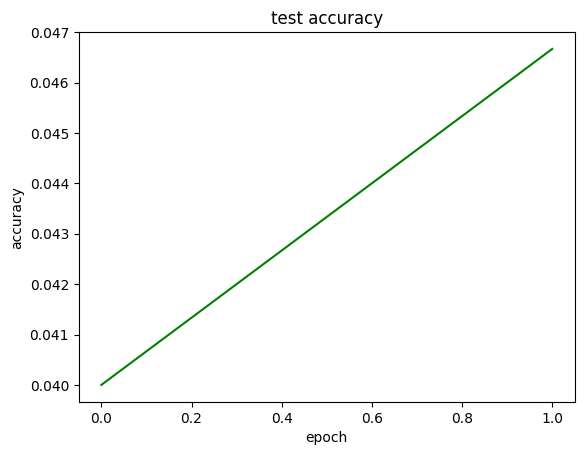

2023-04-18 21:21:44   epoch:    3 , batch:   50 , avg_batch_acc:0.0578 , avg_batch_loss:0.0435 , lr:0.001000 


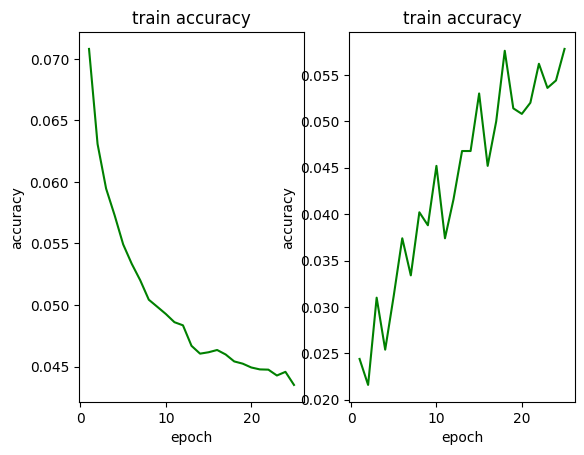

2023-04-18 21:21:55   epoch:    3 , batch:  100 , avg_batch_acc:0.0584 , avg_batch_loss:0.0431 , lr:0.001000 


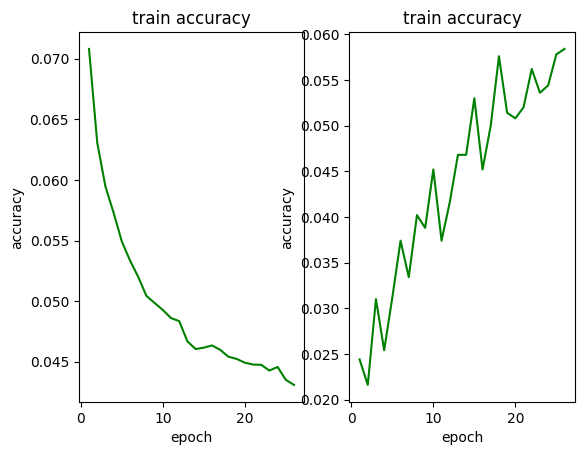

2023-04-18 21:22:06   epoch:    3 , batch:  150 , avg_batch_acc:0.0602 , avg_batch_loss:0.0434 , lr:0.001000 


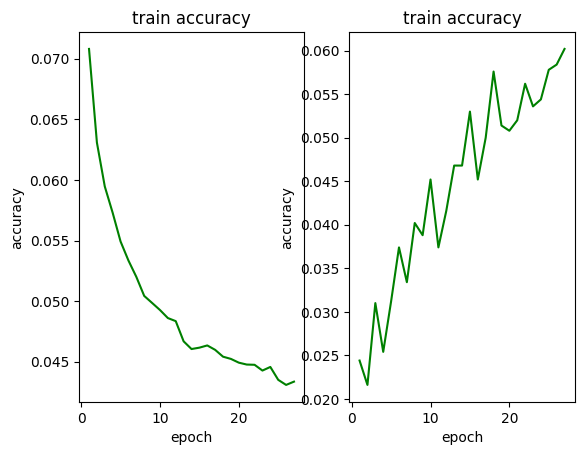

2023-04-18 21:22:16   epoch:    3 , batch:  200 , avg_batch_acc:0.0538 , avg_batch_loss:0.0436 , lr:0.001000 


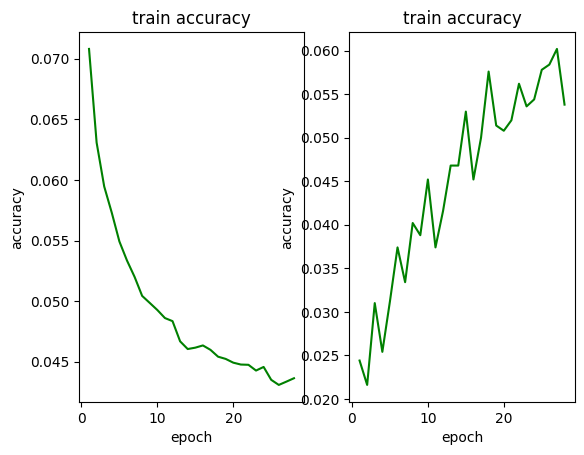

2023-04-18 21:22:27   epoch:    3 , batch:  250 , avg_batch_acc:0.0606 , avg_batch_loss:0.0435 , lr:0.001000 


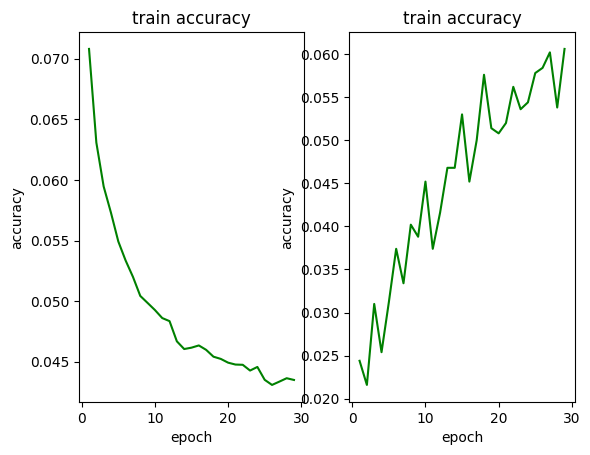

2023-04-18 21:22:36   epoch:    3 , batch:  300 , avg_batch_acc:0.0692 , avg_batch_loss:0.0430 , lr:0.001000 


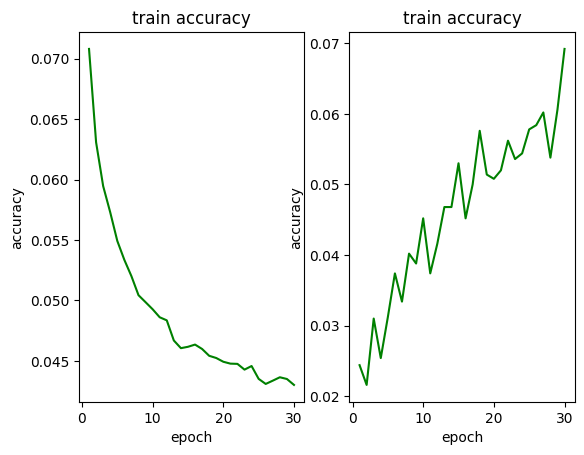

2023-04-18 21:22:45   epoch:    3 , batch:  350 , avg_batch_acc:0.0602 , avg_batch_loss:0.0430 , lr:0.001000 


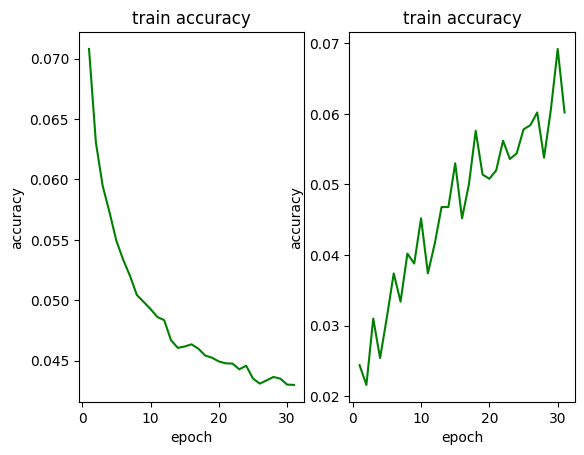

2023-04-18 21:22:54   epoch:    3 , batch:  400 , avg_batch_acc:0.0592 , avg_batch_loss:0.0429 , lr:0.001000 


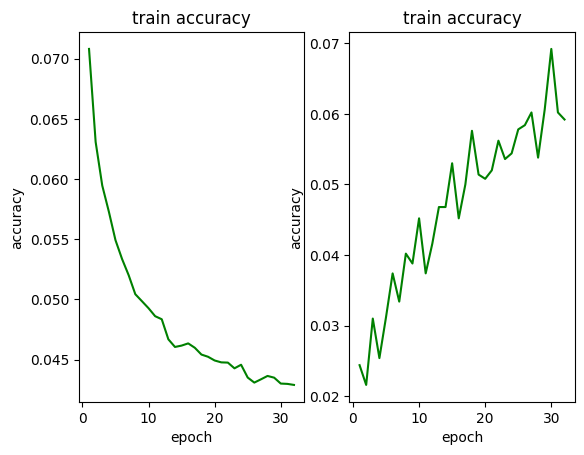

2023-04-18 21:23:02   epoch:    3 , batch:  450 , avg_batch_acc:0.0614 , avg_batch_loss:0.0427 , lr:0.001000 


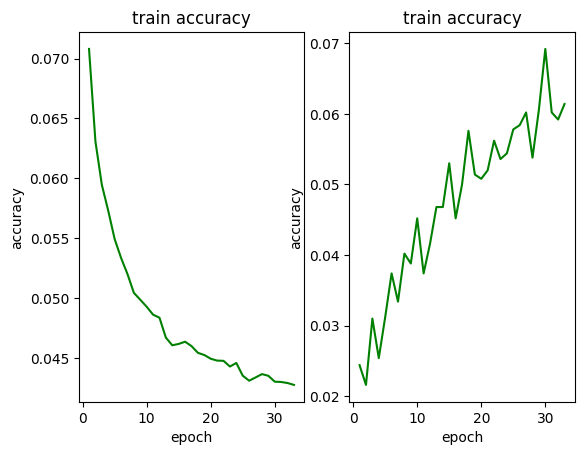

2023-04-18 21:23:11   epoch:    3 , batch:  500 , avg_batch_acc:0.0628 , avg_batch_loss:0.0429 , lr:0.001000 


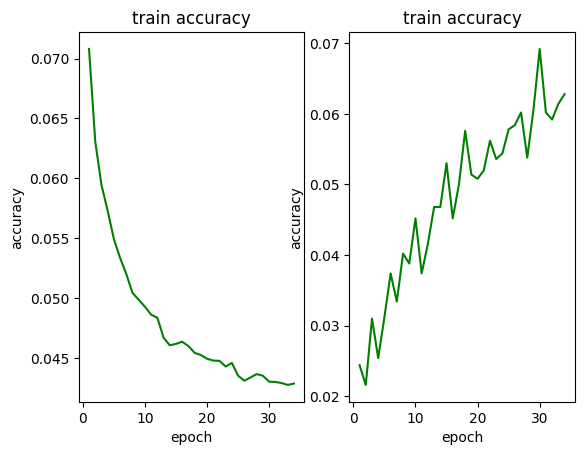

2023-04-18 21:23:19   epoch:    3 , batch:  550 , avg_batch_acc:0.0632 , avg_batch_loss:0.0423 , lr:0.001000 


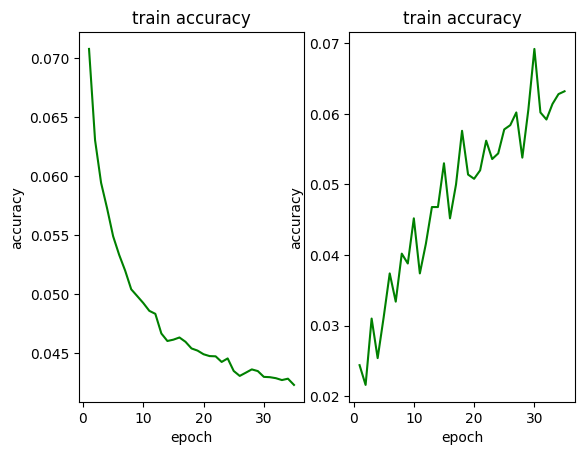

2023-04-18 21:23:28   epoch:    3 , batch:  600 , avg_batch_acc:0.0608 , avg_batch_loss:0.0428 , lr:0.001000 


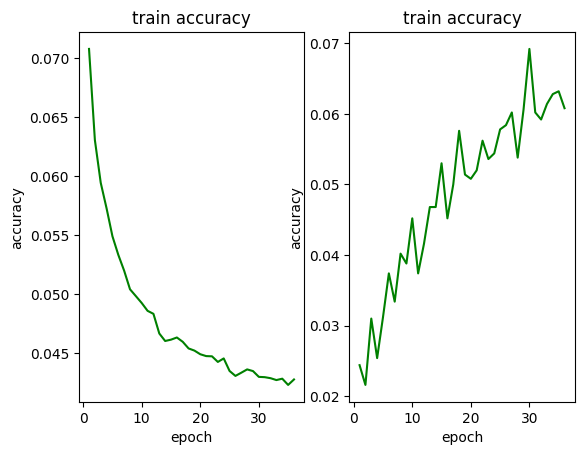

2023-04-18 21:23:33    **********epoch:    3 , avg_epoch_acc:0.0609 , avg_epoch_loss:0.0430 *************
------------test_set_acc:0.0444---------------


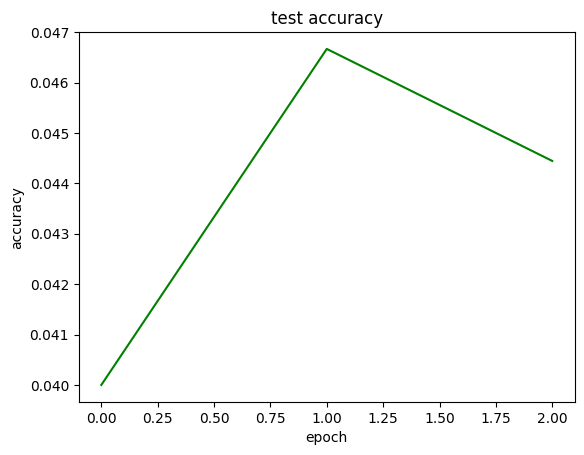

2023-04-18 21:23:42   epoch:    4 , batch:   50 , avg_batch_acc:0.0664 , avg_batch_loss:0.0419 , lr:0.001000 


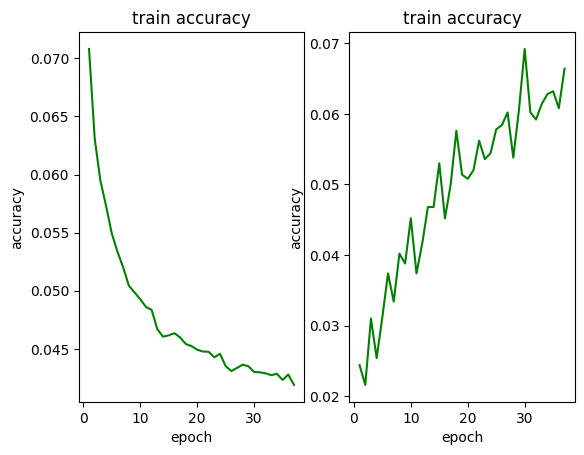

2023-04-18 21:23:50   epoch:    4 , batch:  100 , avg_batch_acc:0.0660 , avg_batch_loss:0.0415 , lr:0.001000 


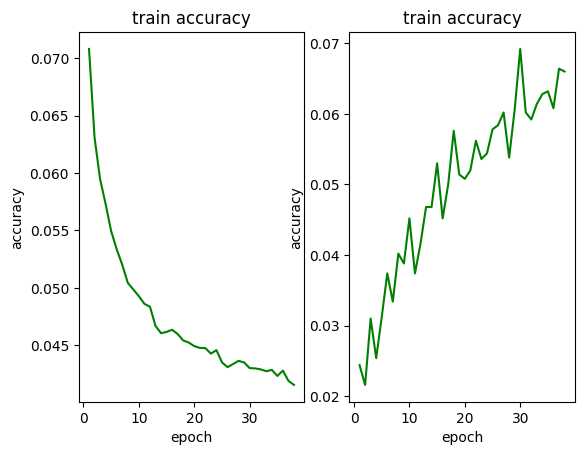

2023-04-18 21:23:59   epoch:    4 , batch:  150 , avg_batch_acc:0.0674 , avg_batch_loss:0.0418 , lr:0.001000 


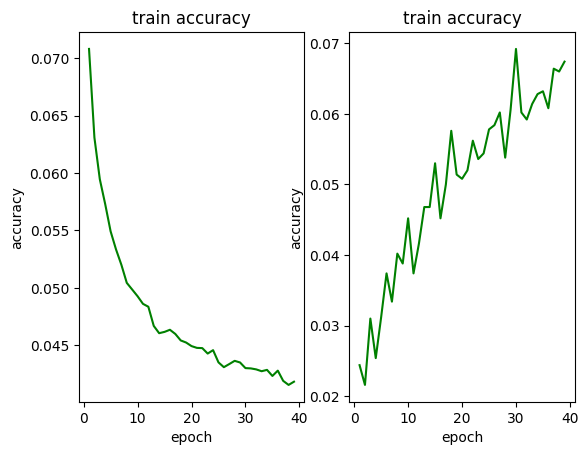

2023-04-18 21:24:07   epoch:    4 , batch:  200 , avg_batch_acc:0.0618 , avg_batch_loss:0.0421 , lr:0.001000 


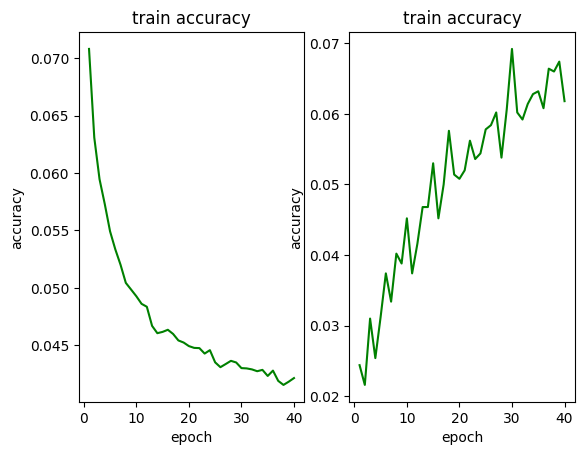

2023-04-18 21:24:16   epoch:    4 , batch:  250 , avg_batch_acc:0.0680 , avg_batch_loss:0.0421 , lr:0.001000 


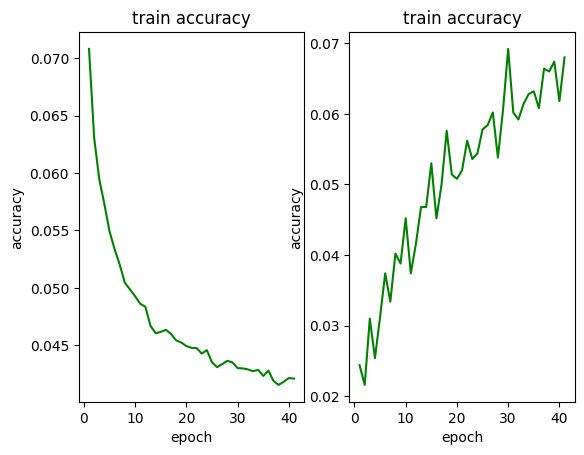

2023-04-18 21:24:25   epoch:    4 , batch:  300 , avg_batch_acc:0.0780 , avg_batch_loss:0.0416 , lr:0.001000 


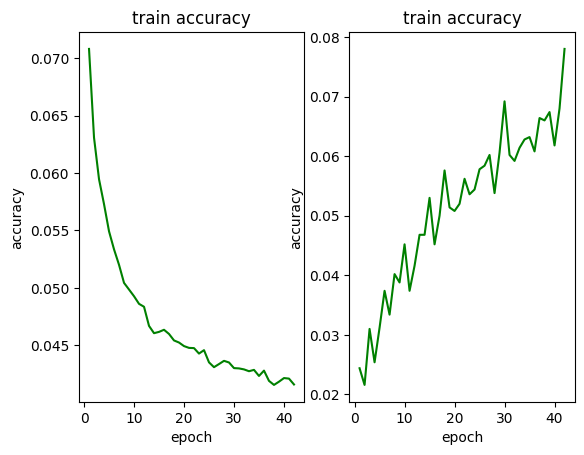

2023-04-18 21:24:33   epoch:    4 , batch:  350 , avg_batch_acc:0.0700 , avg_batch_loss:0.0416 , lr:0.001000 


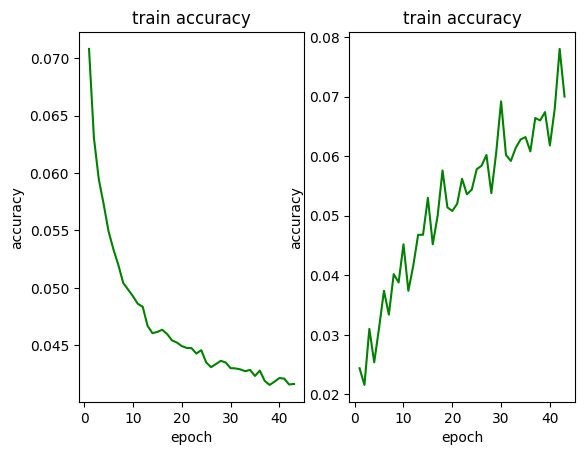

2023-04-18 21:24:42   epoch:    4 , batch:  400 , avg_batch_acc:0.0640 , avg_batch_loss:0.0416 , lr:0.001000 


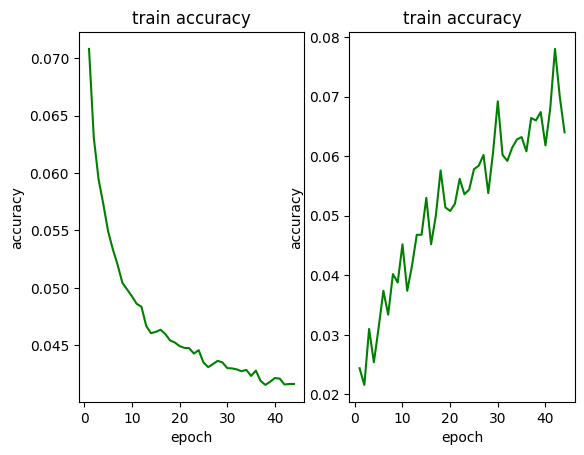

2023-04-18 21:24:50   epoch:    4 , batch:  450 , avg_batch_acc:0.0690 , avg_batch_loss:0.0415 , lr:0.001000 


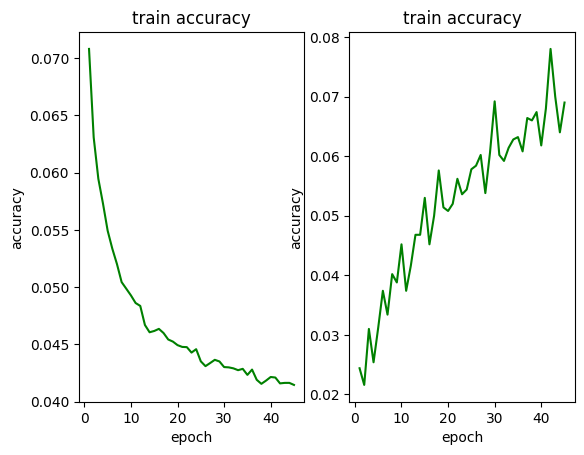

2023-04-18 21:24:59   epoch:    4 , batch:  500 , avg_batch_acc:0.0704 , avg_batch_loss:0.0416 , lr:0.001000 


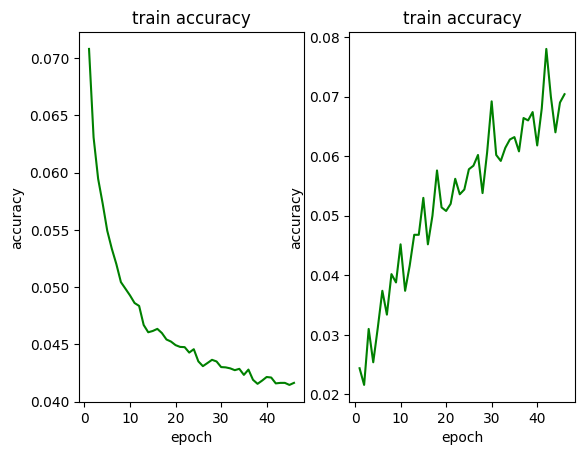

2023-04-18 21:25:07   epoch:    4 , batch:  550 , avg_batch_acc:0.0696 , avg_batch_loss:0.0411 , lr:0.001000 


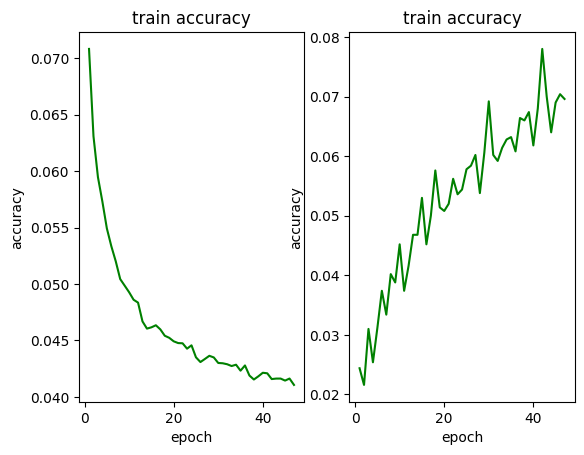

2023-04-18 21:25:16   epoch:    4 , batch:  600 , avg_batch_acc:0.0668 , avg_batch_loss:0.0416 , lr:0.001000 


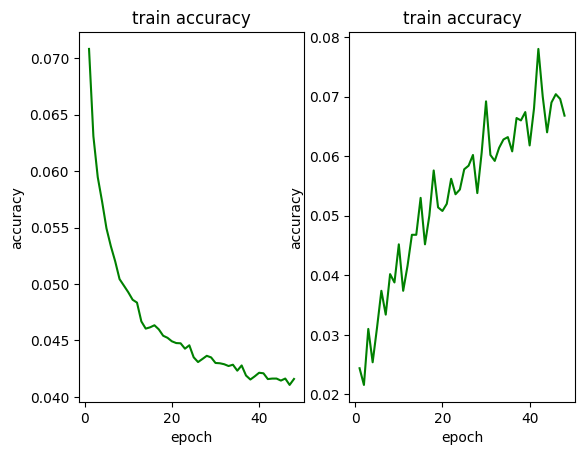

2023-04-18 21:25:22    **********epoch:    4 , avg_epoch_acc:0.0682 , avg_epoch_loss:0.0416 *************
------------test_set_acc:0.0422---------------


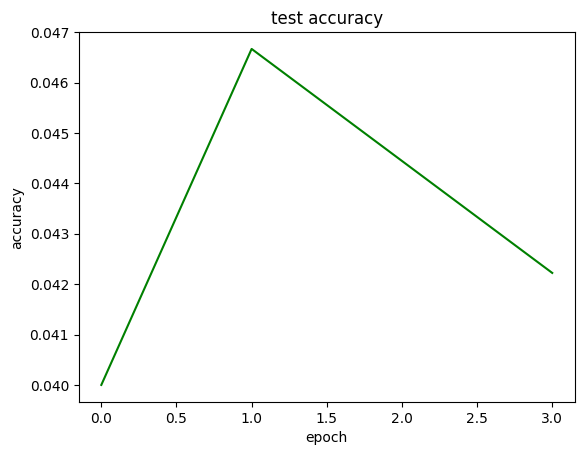

2023-04-18 21:25:30   epoch:    5 , batch:   50 , avg_batch_acc:0.0742 , avg_batch_loss:0.0408 , lr:0.001000 


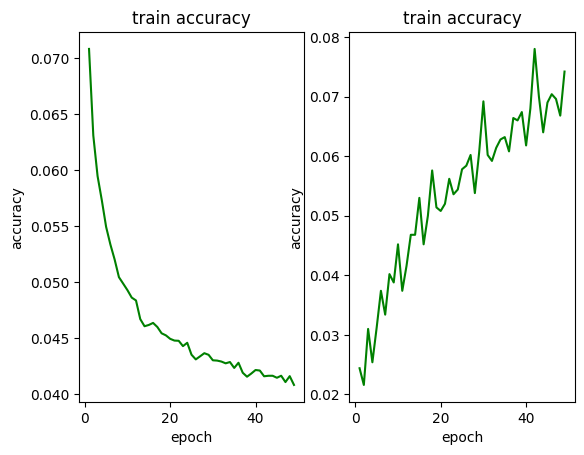

2023-04-18 21:25:39   epoch:    5 , batch:  100 , avg_batch_acc:0.0720 , avg_batch_loss:0.0405 , lr:0.001000 


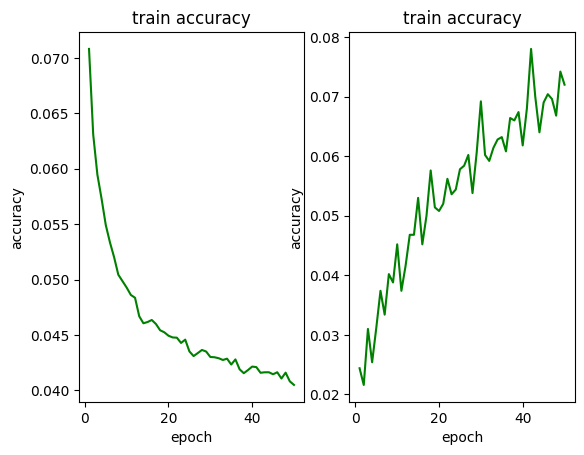

2023-04-18 21:25:47   epoch:    5 , batch:  150 , avg_batch_acc:0.0706 , avg_batch_loss:0.0408 , lr:0.001000 


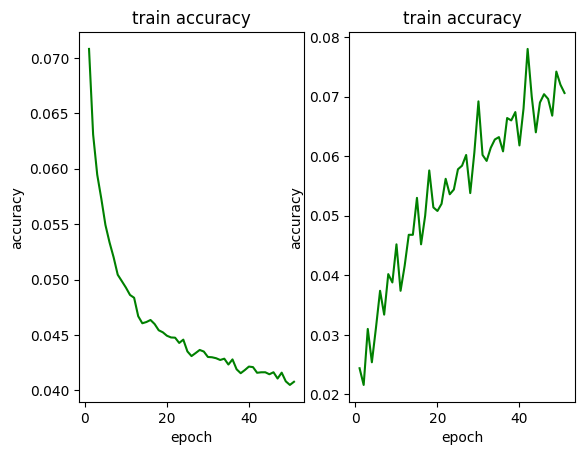

2023-04-18 21:25:56   epoch:    5 , batch:  200 , avg_batch_acc:0.0656 , avg_batch_loss:0.0411 , lr:0.001000 


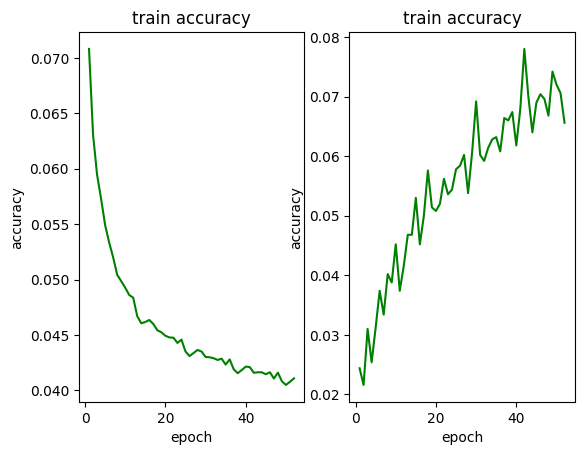

2023-04-18 21:26:05   epoch:    5 , batch:  250 , avg_batch_acc:0.0746 , avg_batch_loss:0.0411 , lr:0.001000 


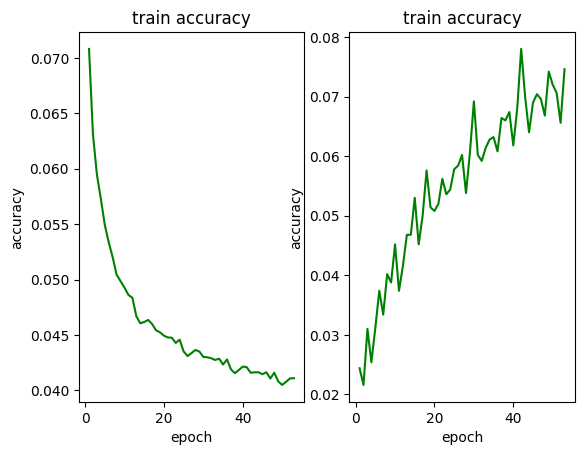

2023-04-18 21:26:13   epoch:    5 , batch:  300 , avg_batch_acc:0.0818 , avg_batch_loss:0.0406 , lr:0.001000 


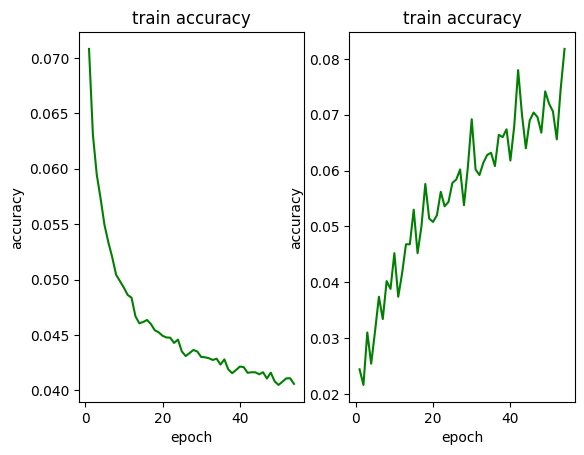

2023-04-18 21:26:22   epoch:    5 , batch:  350 , avg_batch_acc:0.0736 , avg_batch_loss:0.0406 , lr:0.001000 


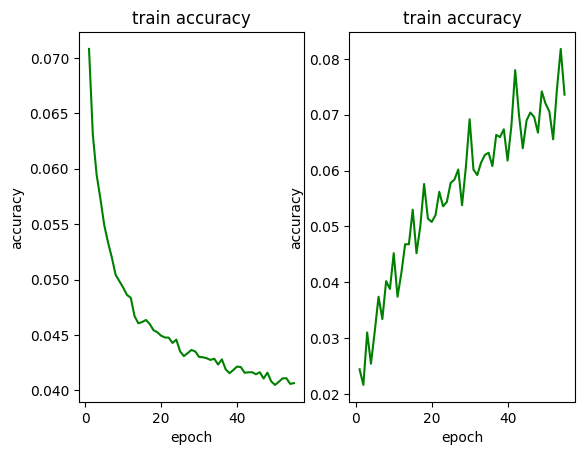

2023-04-18 21:26:30   epoch:    5 , batch:  400 , avg_batch_acc:0.0684 , avg_batch_loss:0.0407 , lr:0.001000 


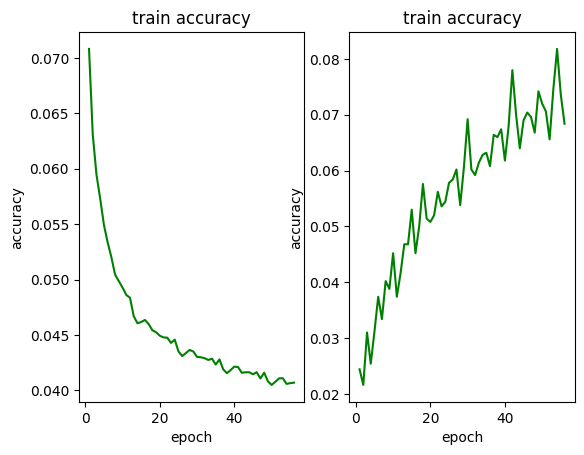

2023-04-18 21:26:39   epoch:    5 , batch:  450 , avg_batch_acc:0.0746 , avg_batch_loss:0.0405 , lr:0.001000 


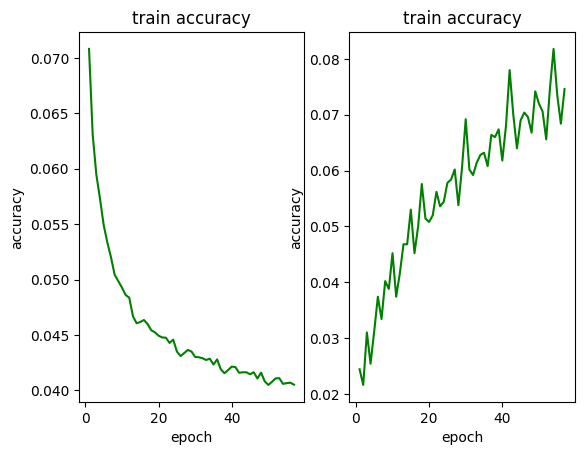

2023-04-18 21:26:47   epoch:    5 , batch:  500 , avg_batch_acc:0.0748 , avg_batch_loss:0.0407 , lr:0.001000 


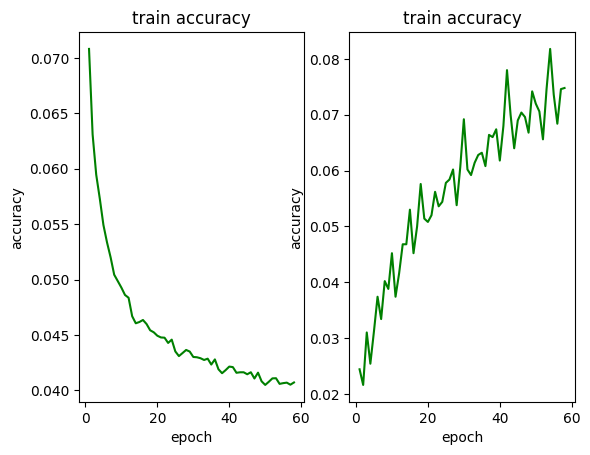

2023-04-18 21:26:56   epoch:    5 , batch:  550 , avg_batch_acc:0.0778 , avg_batch_loss:0.0401 , lr:0.001000 


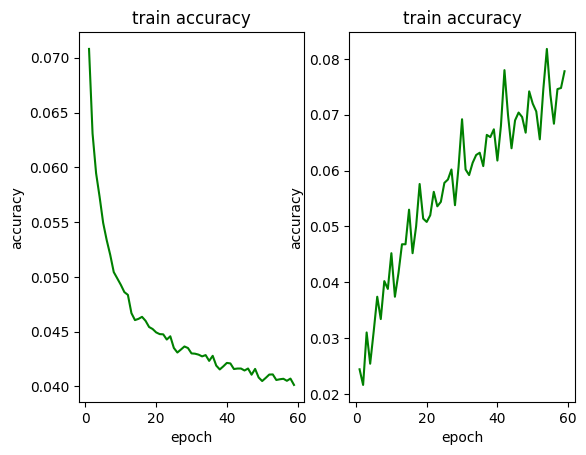

2023-04-18 21:27:04   epoch:    5 , batch:  600 , avg_batch_acc:0.0702 , avg_batch_loss:0.0407 , lr:0.001000 


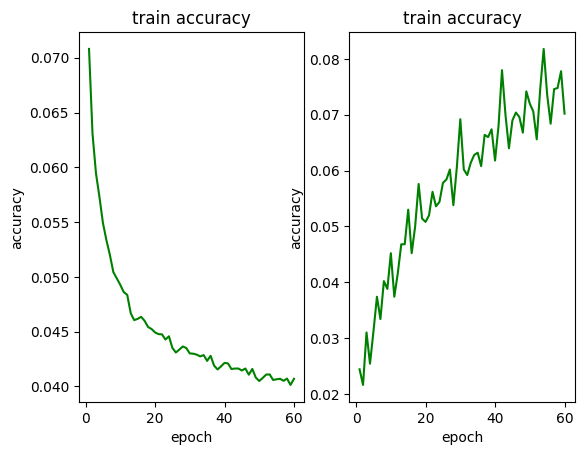

2023-04-18 21:27:10    **********epoch:    5 , avg_epoch_acc:0.0733 , avg_epoch_loss:0.0407 *************
------------test_set_acc:0.0422---------------


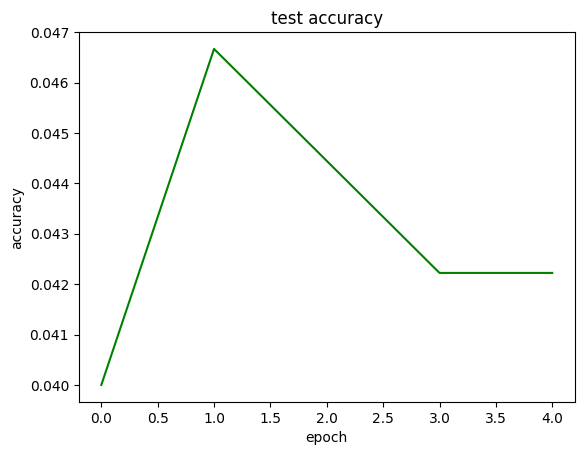

2023-04-18 21:27:19   epoch:    6 , batch:   50 , avg_batch_acc:0.0772 , avg_batch_loss:0.0400 , lr:0.001000 


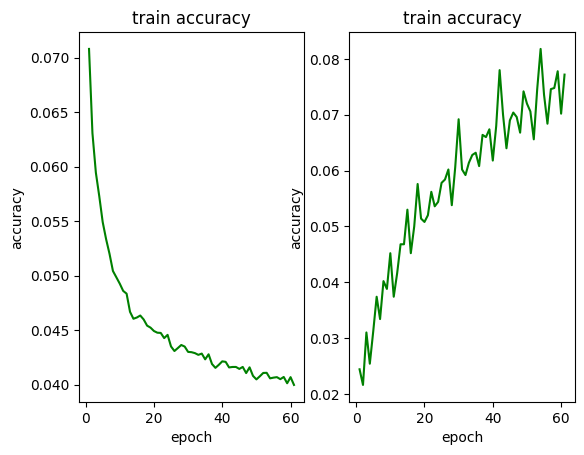

2023-04-18 21:27:27   epoch:    6 , batch:  100 , avg_batch_acc:0.0764 , avg_batch_loss:0.0397 , lr:0.001000 


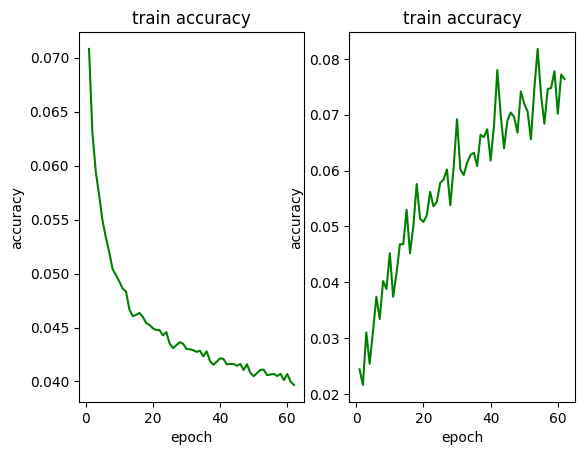

2023-04-18 21:27:36   epoch:    6 , batch:  150 , avg_batch_acc:0.0744 , avg_batch_loss:0.0400 , lr:0.001000 


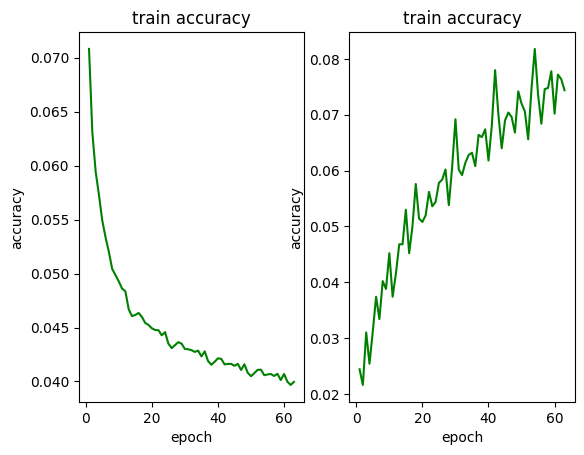

2023-04-18 21:27:44   epoch:    6 , batch:  200 , avg_batch_acc:0.0712 , avg_batch_loss:0.0402 , lr:0.001000 


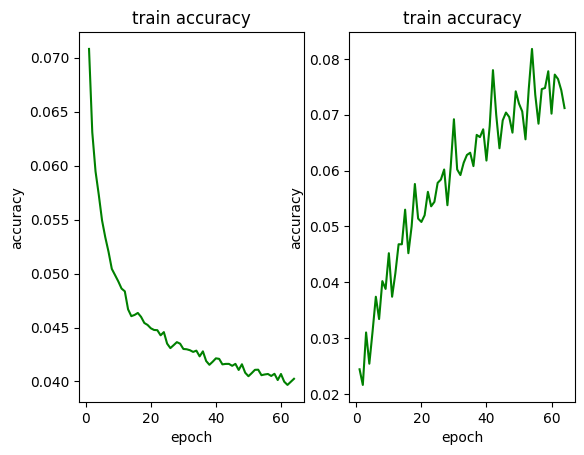

2023-04-18 21:27:53   epoch:    6 , batch:  250 , avg_batch_acc:0.0782 , avg_batch_loss:0.0403 , lr:0.001000 


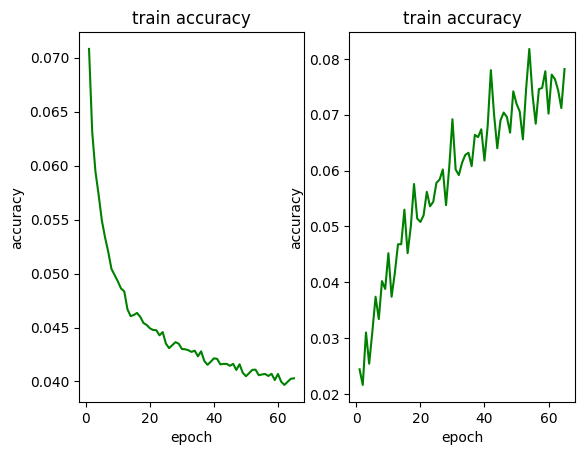

2023-04-18 21:28:02   epoch:    6 , batch:  300 , avg_batch_acc:0.0856 , avg_batch_loss:0.0398 , lr:0.001000 


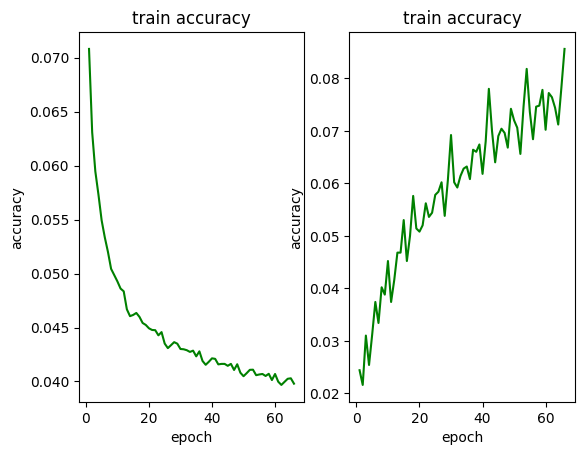

2023-04-18 21:28:10   epoch:    6 , batch:  350 , avg_batch_acc:0.0788 , avg_batch_loss:0.0399 , lr:0.001000 


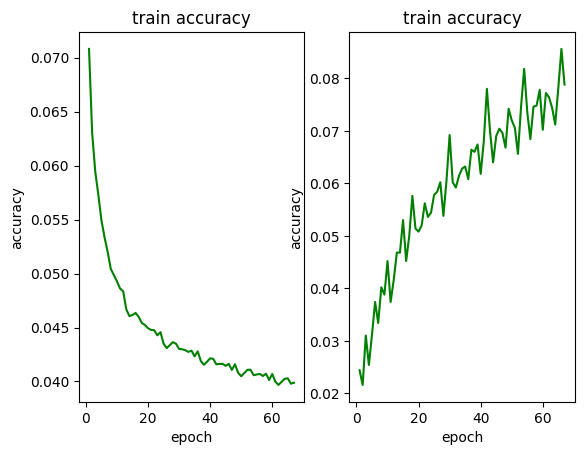

2023-04-18 21:28:19   epoch:    6 , batch:  400 , avg_batch_acc:0.0754 , avg_batch_loss:0.0400 , lr:0.001000 


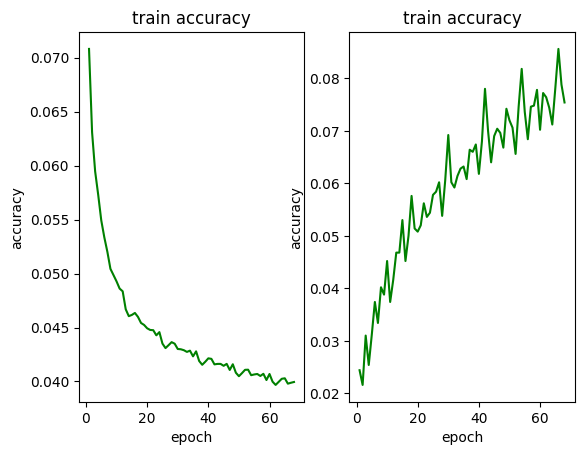

2023-04-18 21:28:28   epoch:    6 , batch:  450 , avg_batch_acc:0.0800 , avg_batch_loss:0.0398 , lr:0.001000 


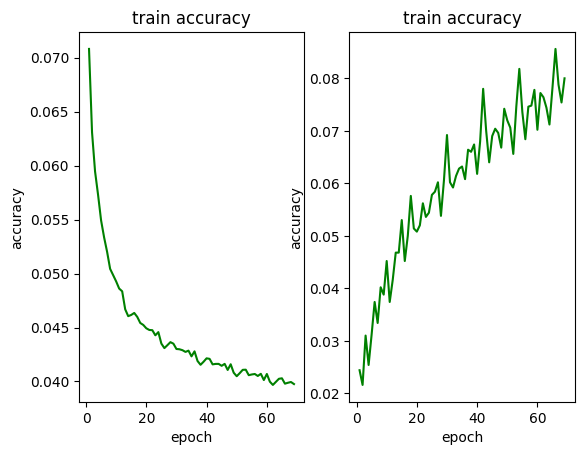

2023-04-18 21:28:37   epoch:    6 , batch:  500 , avg_batch_acc:0.0804 , avg_batch_loss:0.0400 , lr:0.001000 


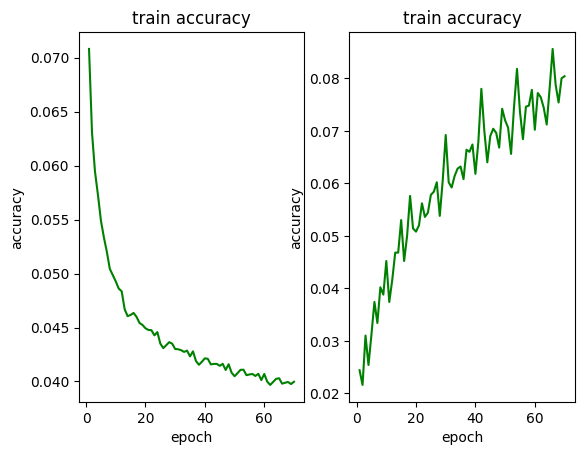

2023-04-18 21:28:45   epoch:    6 , batch:  550 , avg_batch_acc:0.0840 , avg_batch_loss:0.0394 , lr:0.001000 


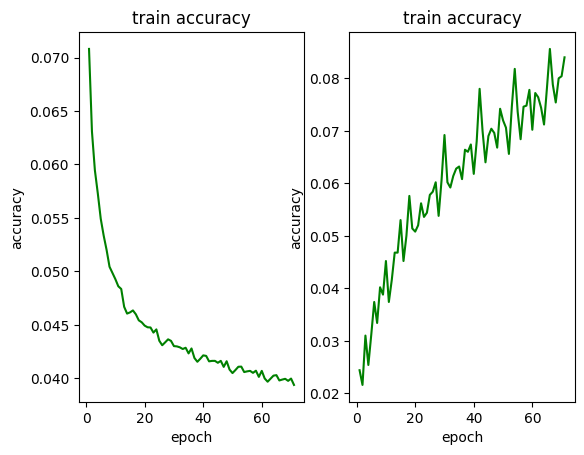

2023-04-18 21:28:54   epoch:    6 , batch:  600 , avg_batch_acc:0.0742 , avg_batch_loss:0.0400 , lr:0.001000 


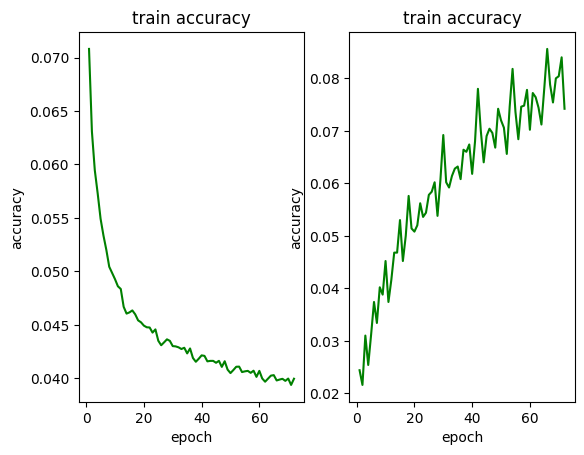

2023-04-18 21:29:01    **********epoch:    6 , avg_epoch_acc:0.0780 , avg_epoch_loss:0.0399 *************
------------test_set_acc:0.0511---------------


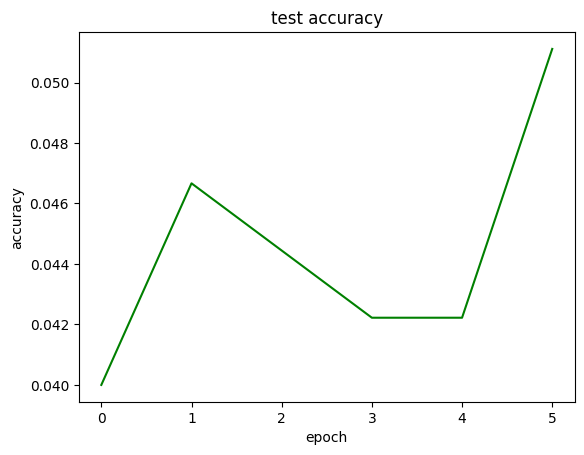

2023-04-18 21:29:09   epoch:    7 , batch:   50 , avg_batch_acc:0.0832 , avg_batch_loss:0.0393 , lr:0.001000 


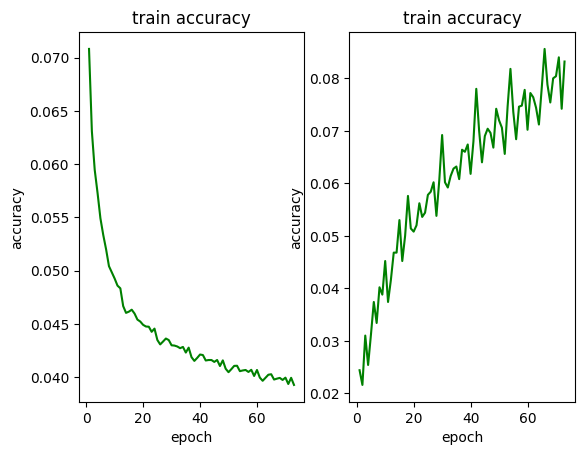

2023-04-18 21:29:18   epoch:    7 , batch:  100 , avg_batch_acc:0.0822 , avg_batch_loss:0.0390 , lr:0.001000 


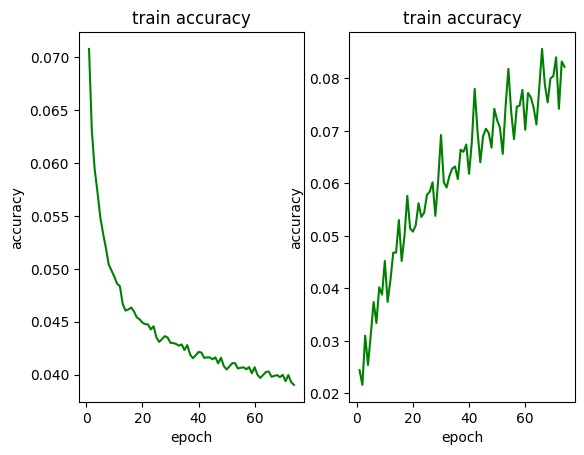

2023-04-18 21:29:27   epoch:    7 , batch:  150 , avg_batch_acc:0.0820 , avg_batch_loss:0.0393 , lr:0.001000 


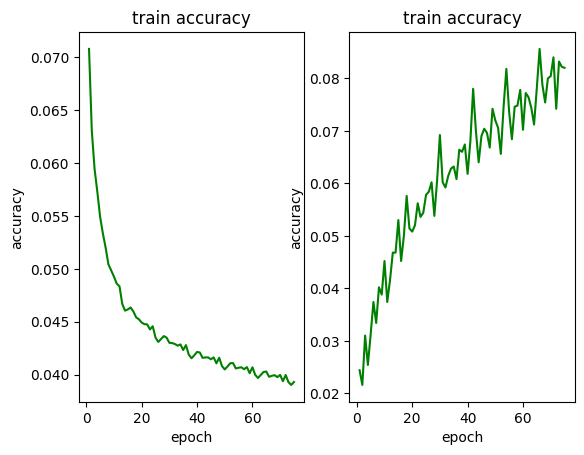

2023-04-18 21:29:36   epoch:    7 , batch:  200 , avg_batch_acc:0.0778 , avg_batch_loss:0.0396 , lr:0.001000 


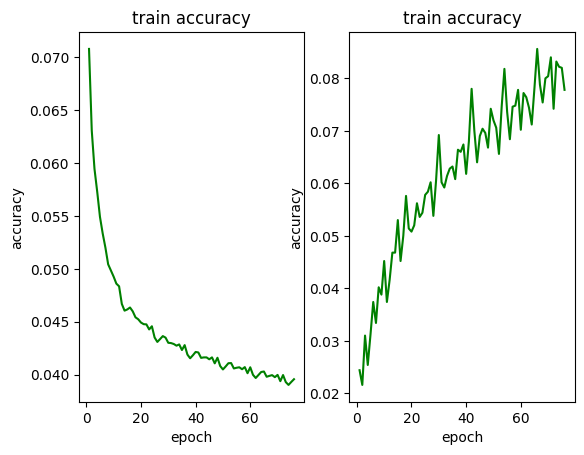

2023-04-18 21:29:45   epoch:    7 , batch:  250 , avg_batch_acc:0.0816 , avg_batch_loss:0.0396 , lr:0.001000 


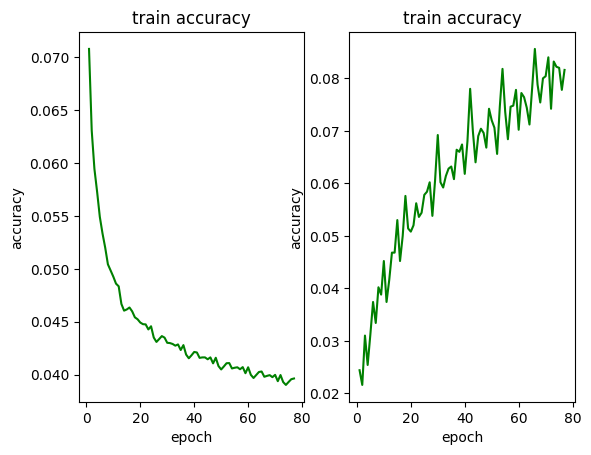

2023-04-18 21:29:54   epoch:    7 , batch:  300 , avg_batch_acc:0.0898 , avg_batch_loss:0.0392 , lr:0.001000 


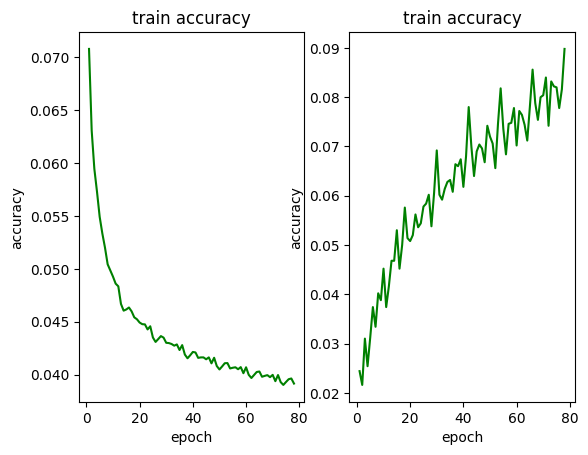

2023-04-18 21:30:02   epoch:    7 , batch:  350 , avg_batch_acc:0.0850 , avg_batch_loss:0.0392 , lr:0.001000 


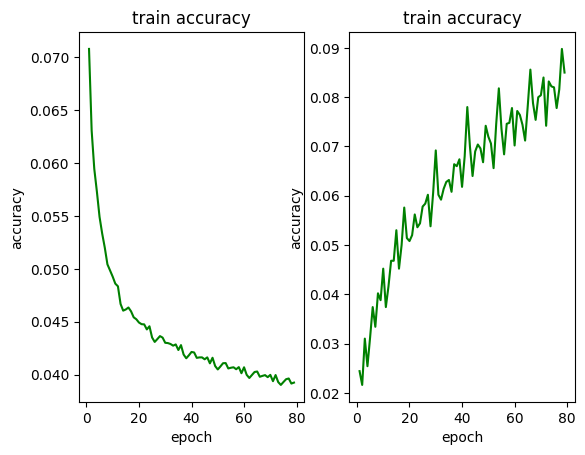

2023-04-18 21:30:11   epoch:    7 , batch:  400 , avg_batch_acc:0.0788 , avg_batch_loss:0.0393 , lr:0.001000 


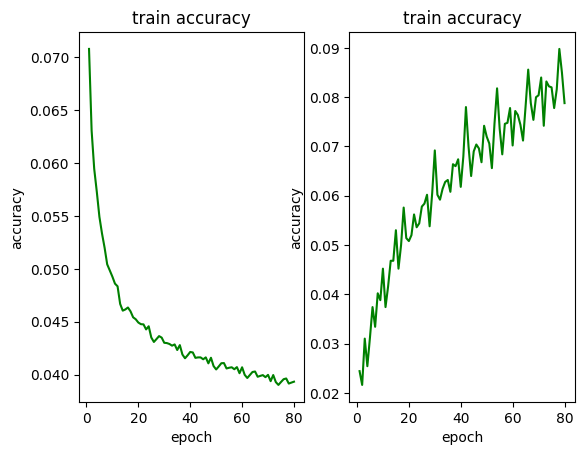

2023-04-18 21:30:19   epoch:    7 , batch:  450 , avg_batch_acc:0.0840 , avg_batch_loss:0.0391 , lr:0.001000 


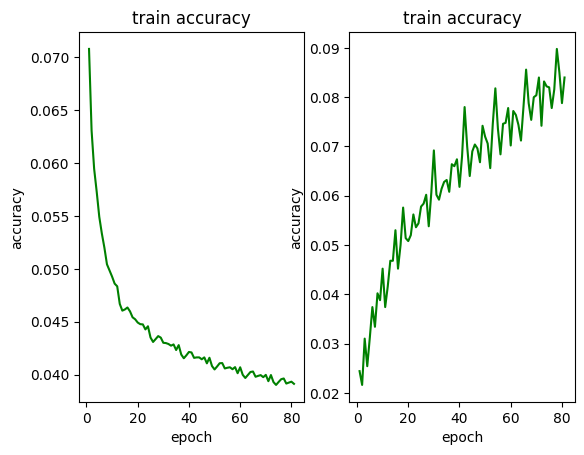

2023-04-18 21:30:28   epoch:    7 , batch:  500 , avg_batch_acc:0.0852 , avg_batch_loss:0.0393 , lr:0.001000 


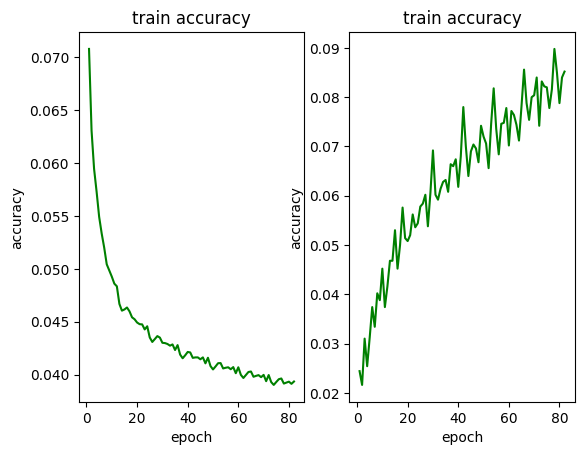

2023-04-18 21:30:37   epoch:    7 , batch:  550 , avg_batch_acc:0.0886 , avg_batch_loss:0.0387 , lr:0.001000 


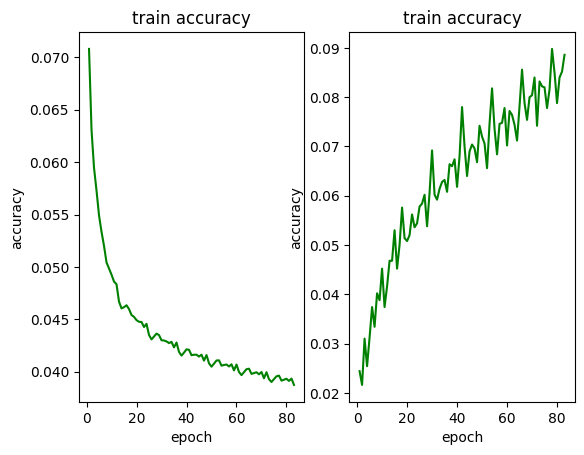

2023-04-18 21:30:45   epoch:    7 , batch:  600 , avg_batch_acc:0.0780 , avg_batch_loss:0.0393 , lr:0.001000 


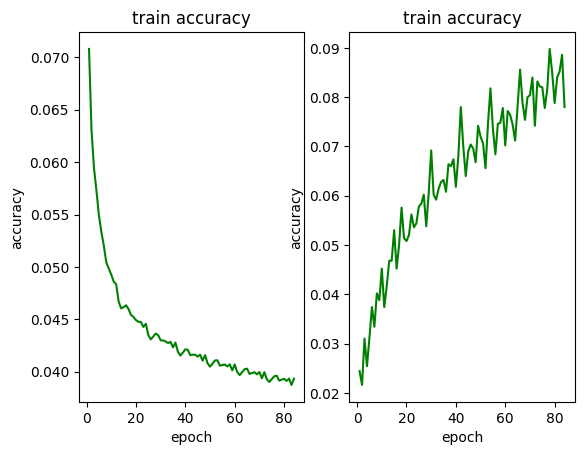

2023-04-18 21:30:51    **********epoch:    7 , avg_epoch_acc:0.0830 , avg_epoch_loss:0.0392 *************
------------test_set_acc:0.0533---------------


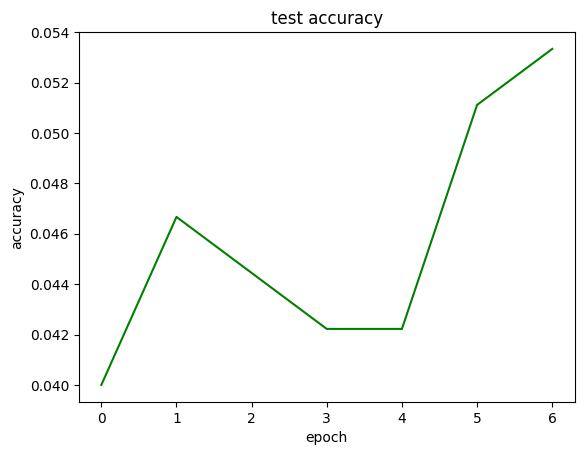

2023-04-18 21:31:00   epoch:    8 , batch:   50 , avg_batch_acc:0.0860 , avg_batch_loss:0.0387 , lr:0.001000 


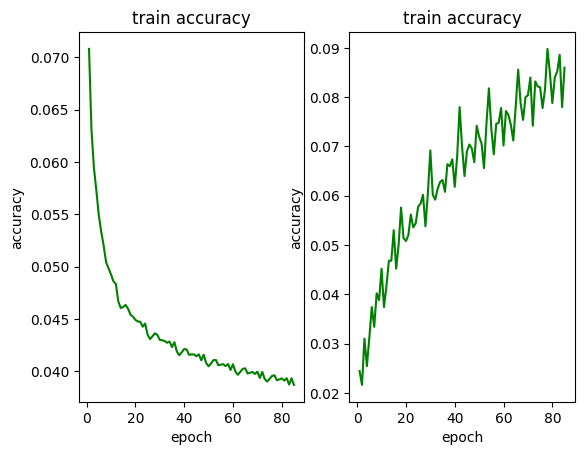

2023-04-18 21:31:08   epoch:    8 , batch:  100 , avg_batch_acc:0.0892 , avg_batch_loss:0.0385 , lr:0.001000 


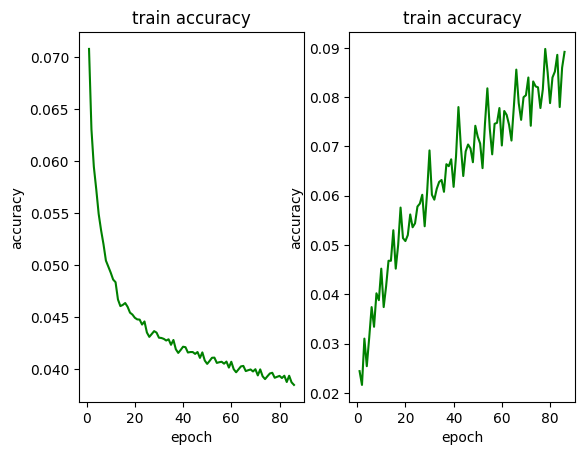

2023-04-18 21:31:17   epoch:    8 , batch:  150 , avg_batch_acc:0.0866 , avg_batch_loss:0.0387 , lr:0.001000 


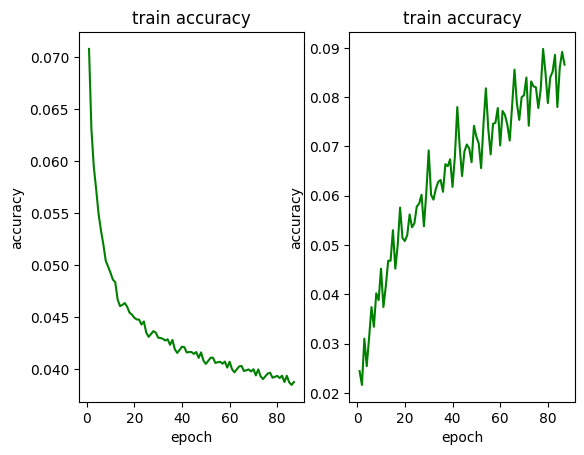

2023-04-18 21:31:25   epoch:    8 , batch:  200 , avg_batch_acc:0.0800 , avg_batch_loss:0.0390 , lr:0.001000 


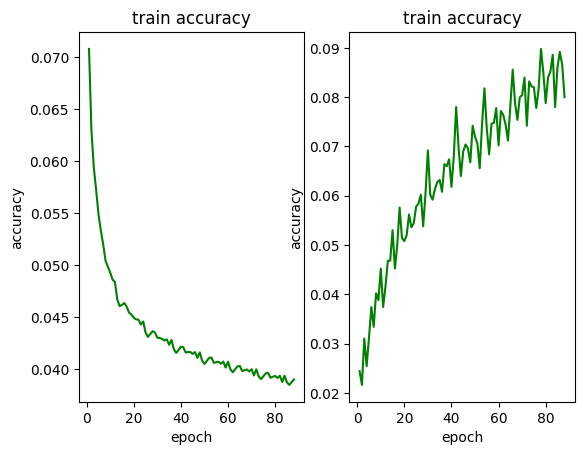

2023-04-18 21:31:34   epoch:    8 , batch:  250 , avg_batch_acc:0.0868 , avg_batch_loss:0.0391 , lr:0.001000 


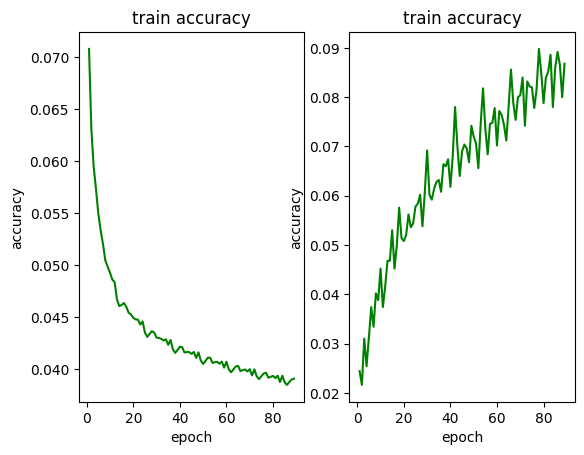

2023-04-18 21:31:42   epoch:    8 , batch:  300 , avg_batch_acc:0.0936 , avg_batch_loss:0.0386 , lr:0.001000 


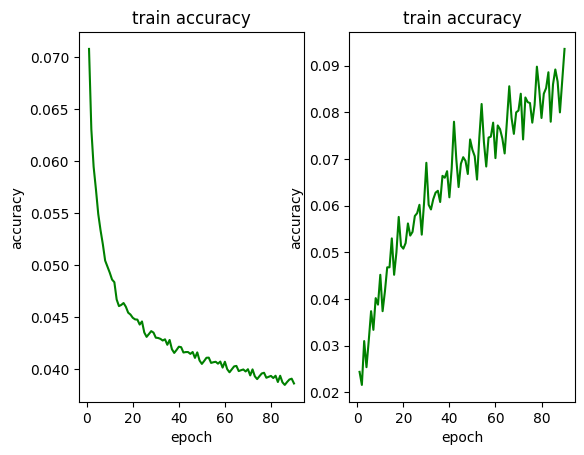

2023-04-18 21:31:51   epoch:    8 , batch:  350 , avg_batch_acc:0.0886 , avg_batch_loss:0.0387 , lr:0.001000 


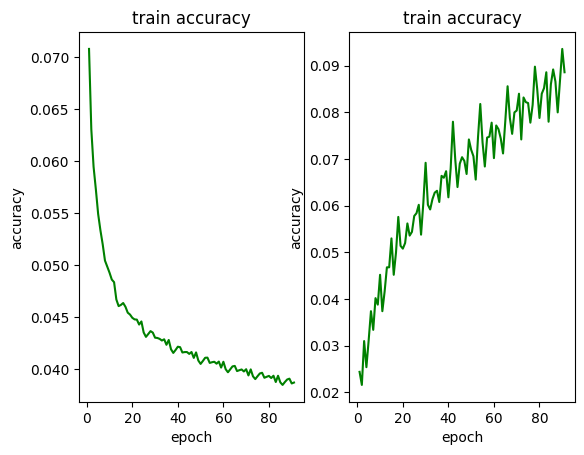

2023-04-18 21:32:00   epoch:    8 , batch:  400 , avg_batch_acc:0.0820 , avg_batch_loss:0.0388 , lr:0.001000 


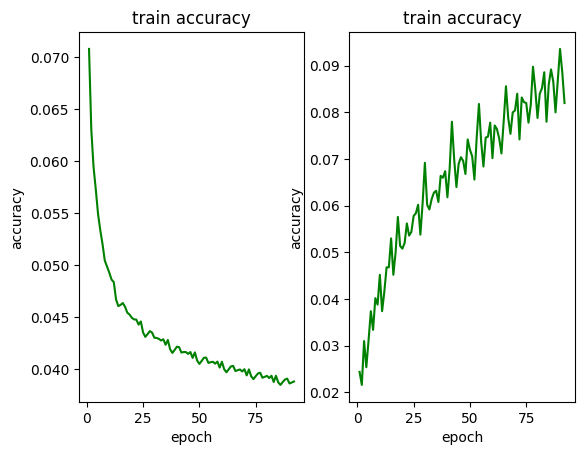

2023-04-18 21:32:08   epoch:    8 , batch:  450 , avg_batch_acc:0.0904 , avg_batch_loss:0.0386 , lr:0.001000 


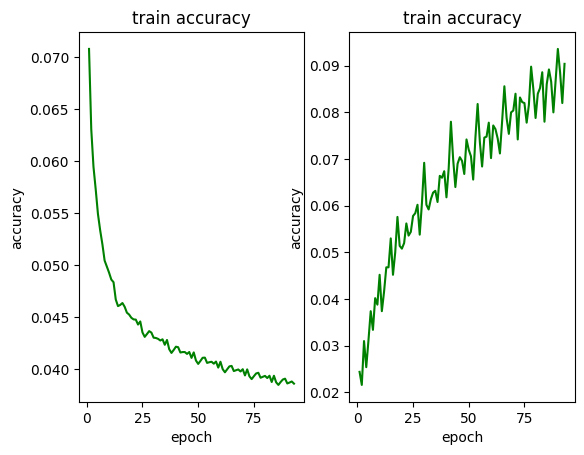

2023-04-18 21:32:17   epoch:    8 , batch:  500 , avg_batch_acc:0.0872 , avg_batch_loss:0.0388 , lr:0.001000 


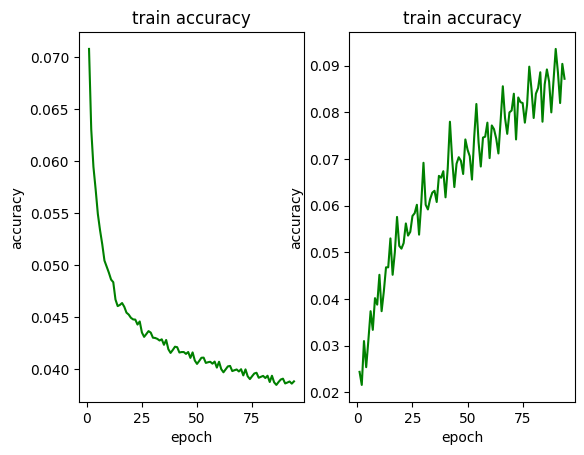

2023-04-18 21:32:25   epoch:    8 , batch:  550 , avg_batch_acc:0.0946 , avg_batch_loss:0.0382 , lr:0.001000 


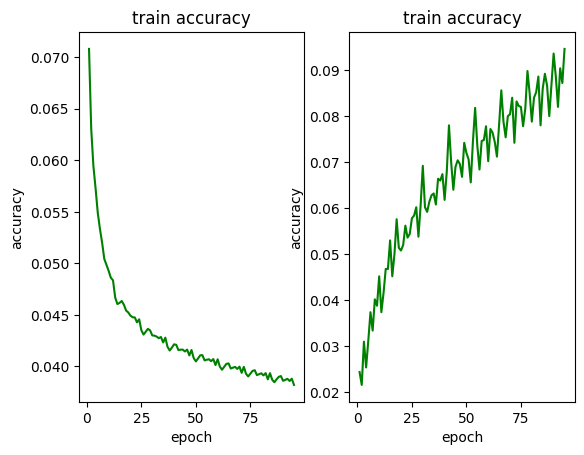

2023-04-18 21:32:34   epoch:    8 , batch:  600 , avg_batch_acc:0.0816 , avg_batch_loss:0.0388 , lr:0.001000 


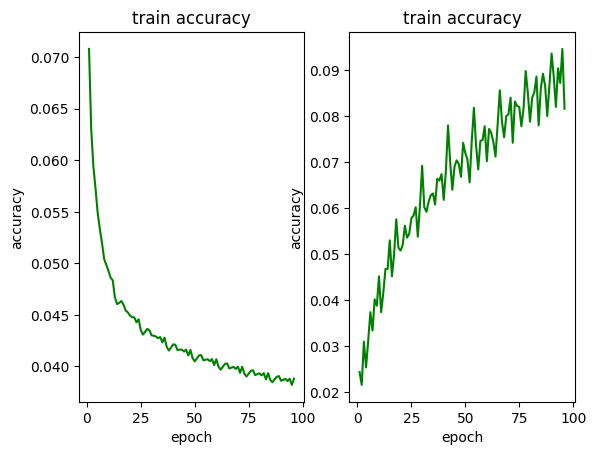

2023-04-18 21:32:40    **********epoch:    8 , avg_epoch_acc:0.0872 , avg_epoch_loss:0.0387 *************
------------test_set_acc:0.0578---------------


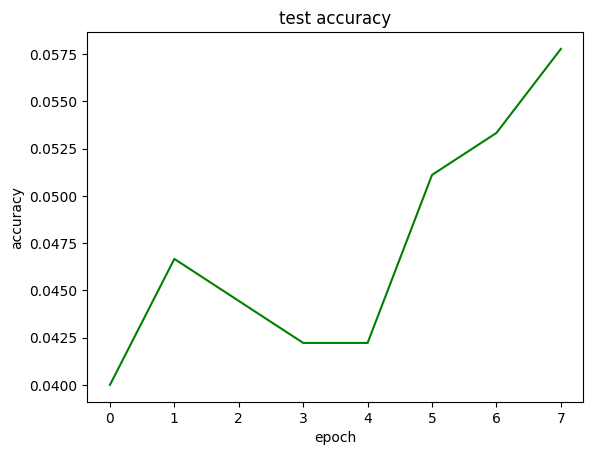

2023-04-18 21:32:48   epoch:    9 , batch:   50 , avg_batch_acc:0.0880 , avg_batch_loss:0.0382 , lr:0.001000 


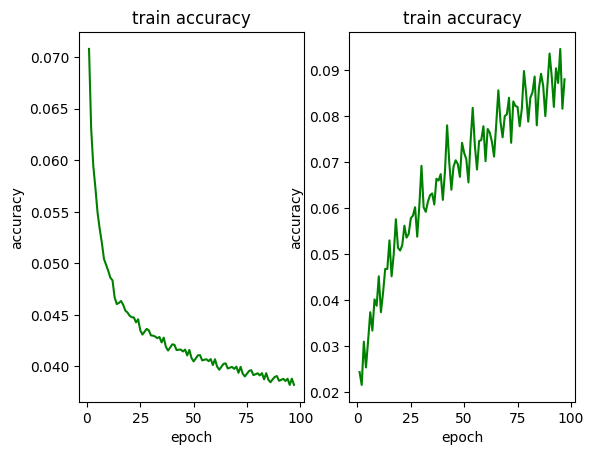

2023-04-18 21:32:57   epoch:    9 , batch:  100 , avg_batch_acc:0.0926 , avg_batch_loss:0.0380 , lr:0.001000 


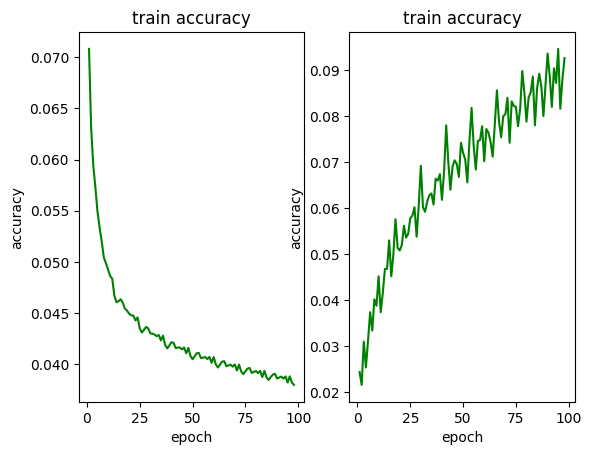

2023-04-18 21:33:05   epoch:    9 , batch:  150 , avg_batch_acc:0.0898 , avg_batch_loss:0.0383 , lr:0.001000 


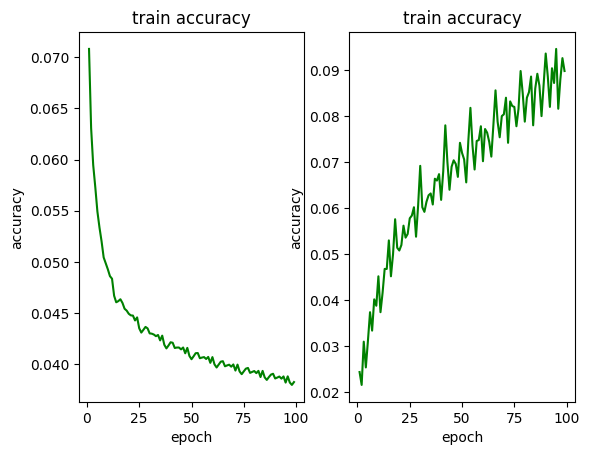

2023-04-18 21:33:14   epoch:    9 , batch:  200 , avg_batch_acc:0.0842 , avg_batch_loss:0.0385 , lr:0.001000 


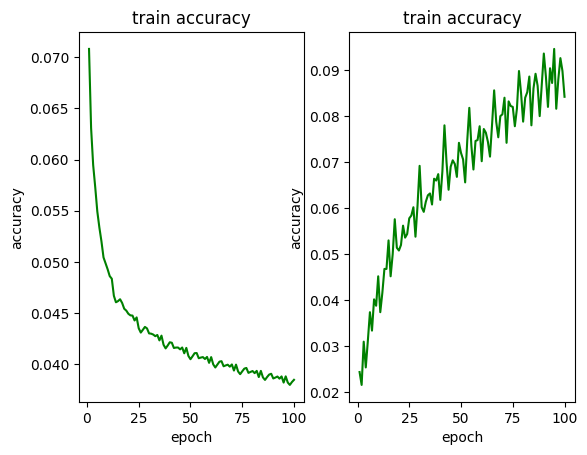

2023-04-18 21:33:22   epoch:    9 , batch:  250 , avg_batch_acc:0.0908 , avg_batch_loss:0.0386 , lr:0.001000 


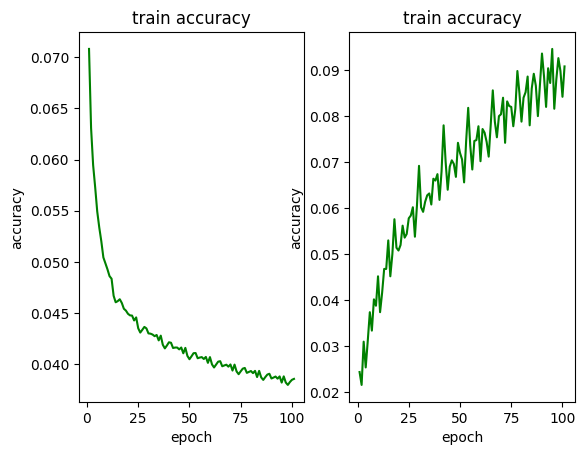

2023-04-18 21:33:31   epoch:    9 , batch:  300 , avg_batch_acc:0.0994 , avg_batch_loss:0.0381 , lr:0.001000 


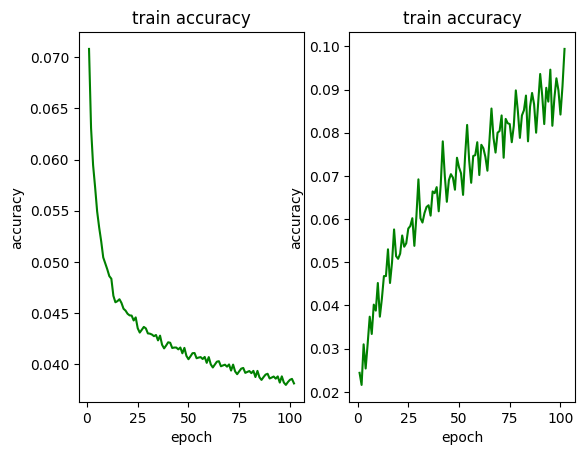

2023-04-18 21:33:40   epoch:    9 , batch:  350 , avg_batch_acc:0.0906 , avg_batch_loss:0.0382 , lr:0.001000 


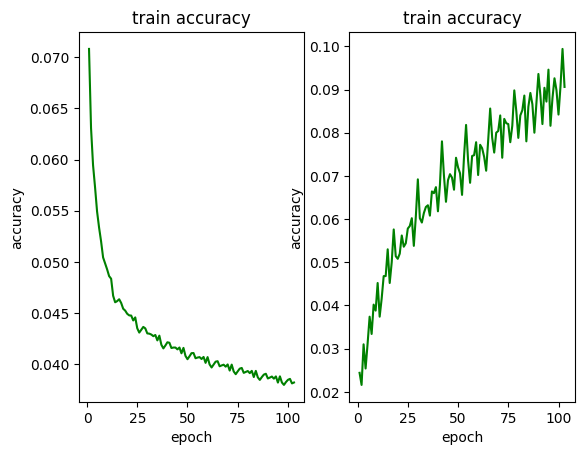

2023-04-18 21:33:48   epoch:    9 , batch:  400 , avg_batch_acc:0.0858 , avg_batch_loss:0.0383 , lr:0.001000 


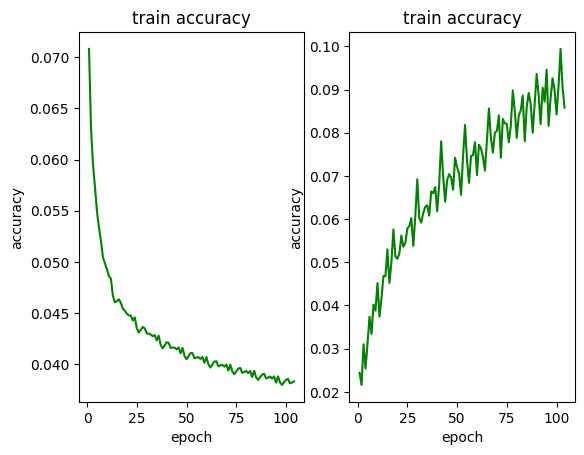

2023-04-18 21:33:57   epoch:    9 , batch:  450 , avg_batch_acc:0.0956 , avg_batch_loss:0.0381 , lr:0.001000 


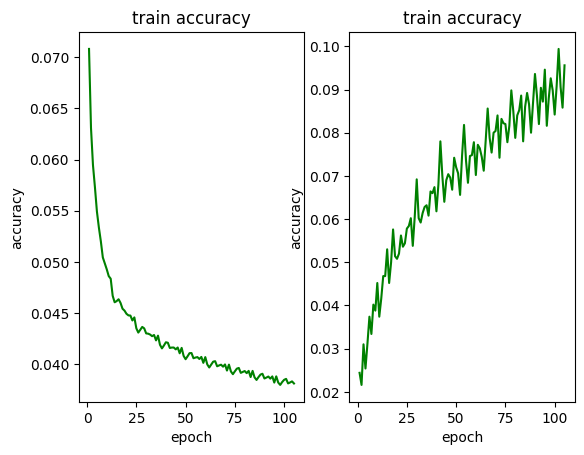

2023-04-18 21:34:05   epoch:    9 , batch:  500 , avg_batch_acc:0.0920 , avg_batch_loss:0.0383 , lr:0.001000 


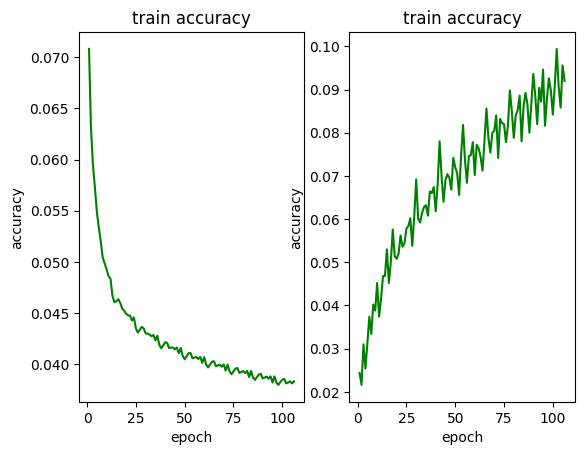

2023-04-18 21:34:14   epoch:    9 , batch:  550 , avg_batch_acc:0.0974 , avg_batch_loss:0.0377 , lr:0.001000 


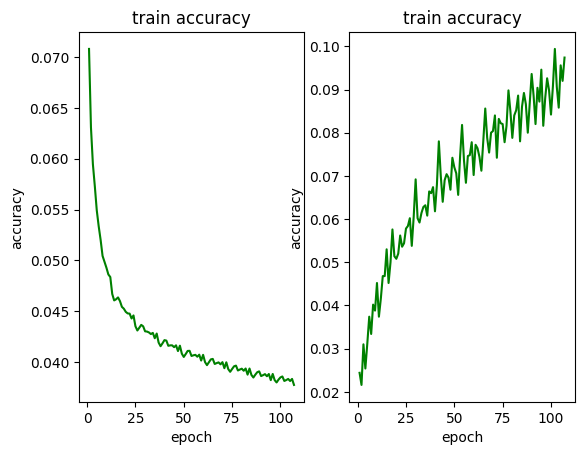

2023-04-18 21:34:23   epoch:    9 , batch:  600 , avg_batch_acc:0.0840 , avg_batch_loss:0.0383 , lr:0.001000 


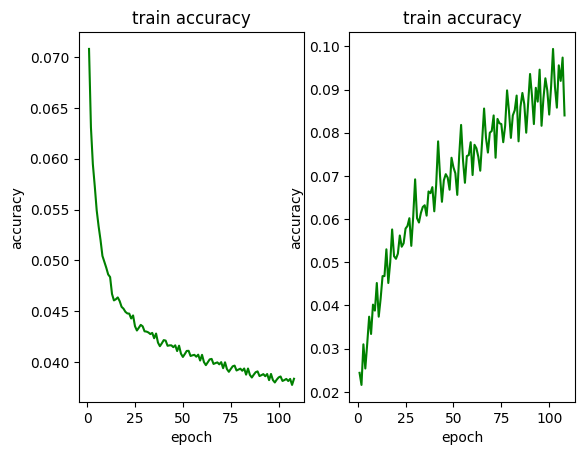

2023-04-18 21:34:28    **********epoch:    9 , avg_epoch_acc:0.0907 , avg_epoch_loss:0.0382 *************
------------test_set_acc:0.0556---------------


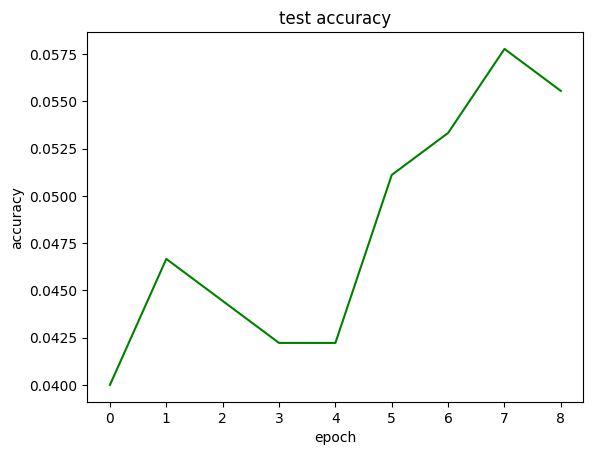

2023-04-18 21:34:37   epoch:   10 , batch:   50 , avg_batch_acc:0.0902 , avg_batch_loss:0.0378 , lr:0.001000 


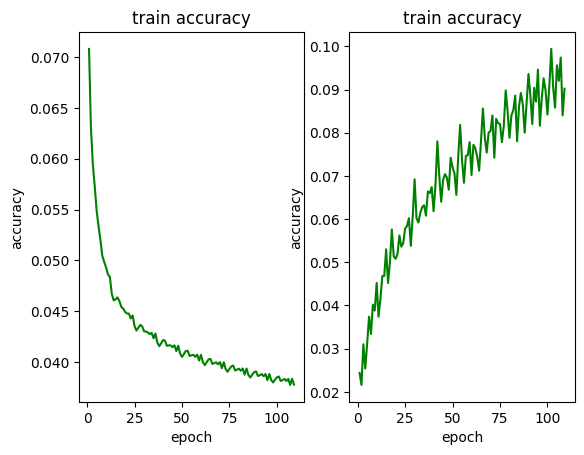

2023-04-18 21:34:46   epoch:   10 , batch:  100 , avg_batch_acc:0.0970 , avg_batch_loss:0.0375 , lr:0.001000 


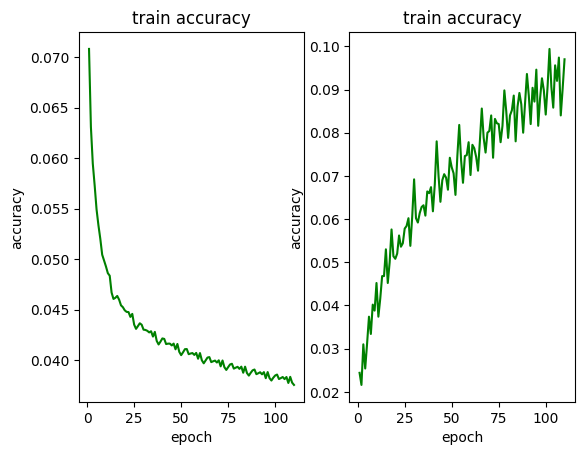

2023-04-18 21:34:54   epoch:   10 , batch:  150 , avg_batch_acc:0.0912 , avg_batch_loss:0.0378 , lr:0.001000 


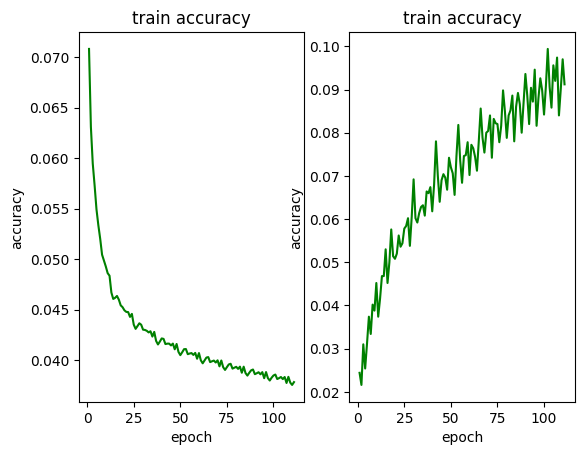

2023-04-18 21:35:03   epoch:   10 , batch:  200 , avg_batch_acc:0.0872 , avg_batch_loss:0.0380 , lr:0.001000 


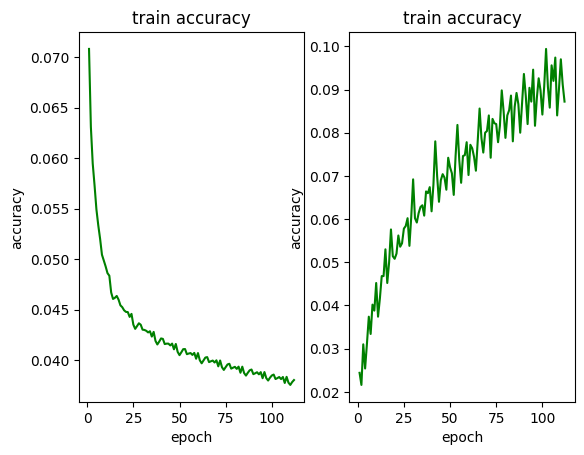

2023-04-18 21:35:11   epoch:   10 , batch:  250 , avg_batch_acc:0.0936 , avg_batch_loss:0.0381 , lr:0.001000 


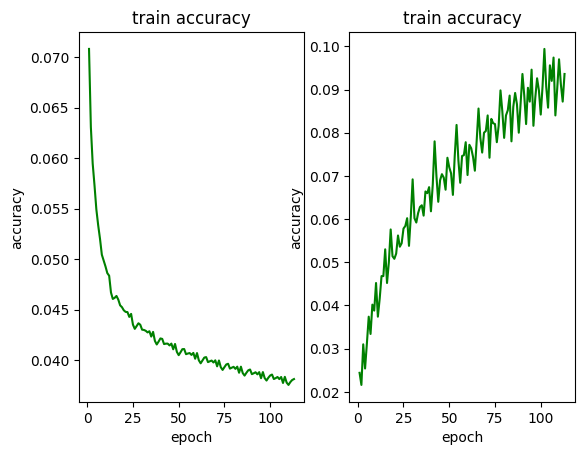

2023-04-18 21:35:20   epoch:   10 , batch:  300 , avg_batch_acc:0.1016 , avg_batch_loss:0.0377 , lr:0.001000 


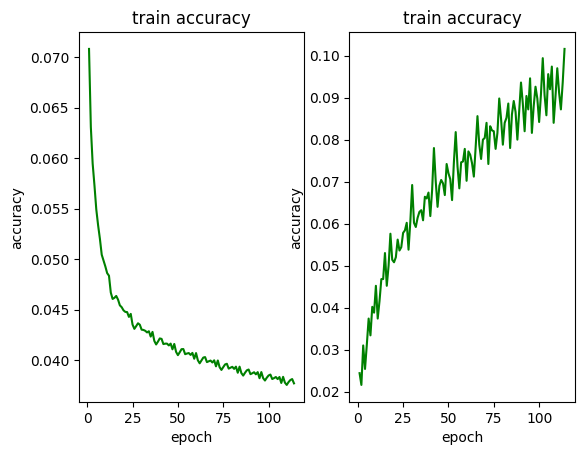

2023-04-18 21:35:28   epoch:   10 , batch:  350 , avg_batch_acc:0.0950 , avg_batch_loss:0.0378 , lr:0.001000 


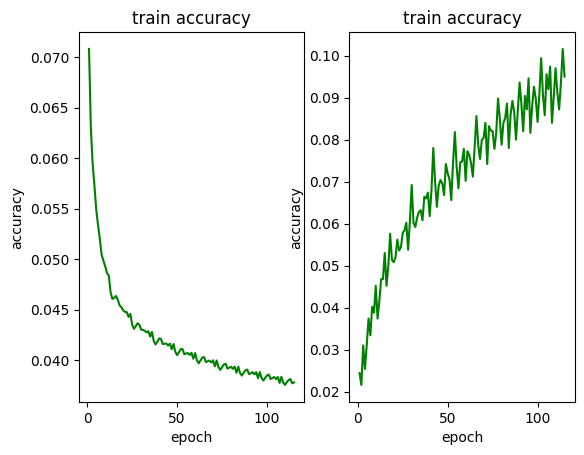

2023-04-18 21:35:37   epoch:   10 , batch:  400 , avg_batch_acc:0.0878 , avg_batch_loss:0.0379 , lr:0.001000 


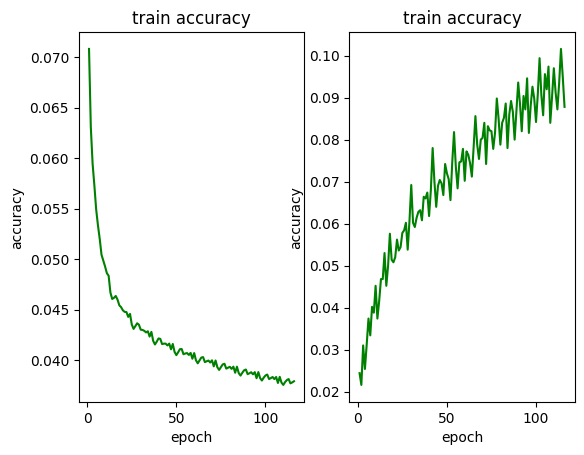

2023-04-18 21:35:46   epoch:   10 , batch:  450 , avg_batch_acc:0.0988 , avg_batch_loss:0.0377 , lr:0.001000 


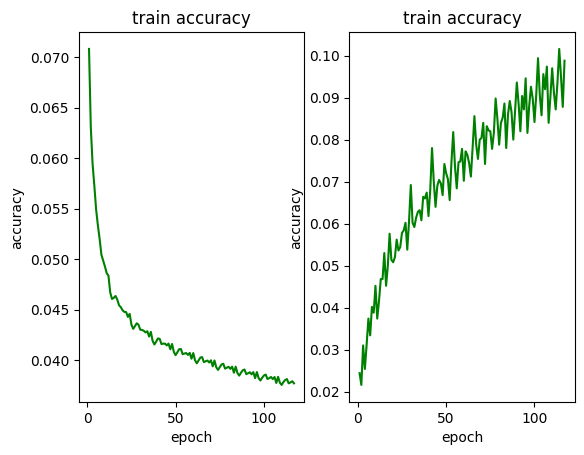

2023-04-18 21:35:54   epoch:   10 , batch:  500 , avg_batch_acc:0.0956 , avg_batch_loss:0.0379 , lr:0.001000 


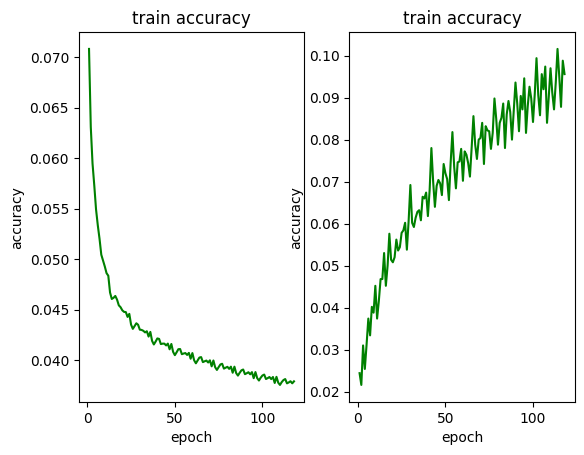

2023-04-18 21:36:03   epoch:   10 , batch:  550 , avg_batch_acc:0.1036 , avg_batch_loss:0.0373 , lr:0.001000 


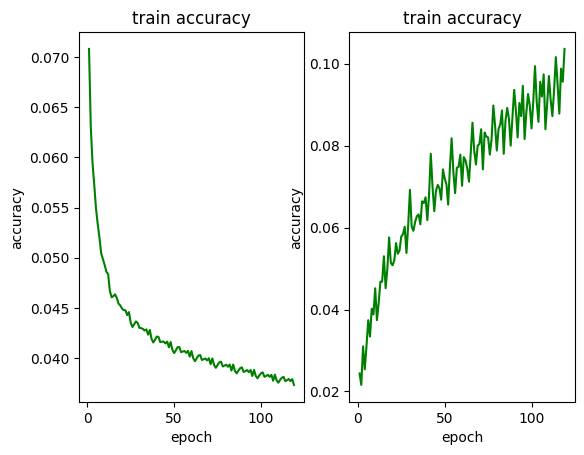

2023-04-18 21:36:11   epoch:   10 , batch:  600 , avg_batch_acc:0.0878 , avg_batch_loss:0.0379 , lr:0.001000 


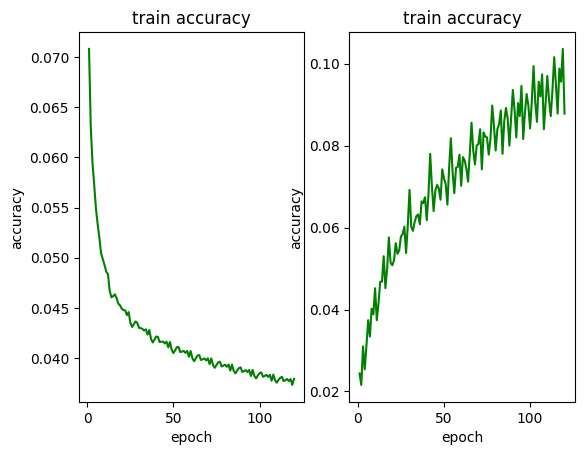

2023-04-18 21:36:17    **********epoch:   10 , avg_epoch_acc:0.0940 , avg_epoch_loss:0.0378 *************
------------test_set_acc:0.0556---------------


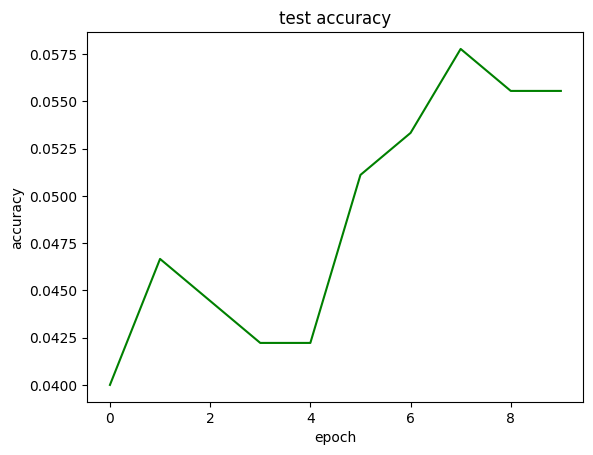

In [9]:
for E in range(epoch):
    batch_loss = 0
    batch_acc = 0

    epoch_loss = 0
    epoch_acc = 0
    #for i in range(10):
    for i in range(traindata.shape[0] // batch_size):
    
        #img = train_images[i*batch_size:(i+1)*batch_size].reshape(batch_size, 3, 28, 28)
        img = traindata[i*batch_size:(i+1)*batch_size]
        img = normalization.normalization(img)
        #label = train_labels[i*batch_size:(i+1)*batch_size]
        label = traindata_y[i*batch_size:(i+1)*batch_size]
        loss, prediction = net.forward(img, label, is_train=True)   # 训练阶段

        epoch_loss += loss
        batch_loss += loss
        for j in range(prediction.shape[0]):
            if np.argmax(prediction[j]) == label[j]:
                epoch_acc += 1
                batch_acc += 1

        net.backward(learning_rate)

        if (i+1)%50 == 0:
            print(time.strftime("%Y-%m-%d %H:%M:%S") +
                  "   epoch:%5d , batch:%5d , avg_batch_acc:%.4f , avg_batch_loss:%.4f , lr:%f "
                  % (E+1, i+1, batch_acc/(batch_size*50), batch_loss/(batch_size*50), learning_rate))
            # 绘制loss和acc变化曲线
            plt.figure(1)
            iterations_num += 1
            plt.clf()
            ax.append(iterations_num)
            ay_loss.append(batch_loss/(batch_size*50))
            ay_acc.append(batch_acc/(batch_size*50))
            plt.subplot(1, 2, 1)
            plt.title('train accuracy')  # 添加子标题
            plt.xlabel('epoch', fontsize=10)  # 添加轴标签
            plt.ylabel('accuracy', fontsize=10)
            plt.plot(ax, ay_loss, 'g-')

            plt.subplot(1, 2, 2)
            plt.title('train accuracy')  # 添加子标题
            plt.xlabel('epoch', fontsize=10)  # 添加轴标签
            plt.ylabel('accuracy', fontsize=10)
            plt.plot(ax, ay_acc, 'g-')
            plt.pause(0.4)  # 设置暂停时间，太快图表无法正常显示

            batch_loss = 0
            batch_acc = 0



    print(time.strftime("%Y-%m-%d %H:%M:%S") +
          "    **********epoch:%5d , avg_epoch_acc:%.4f , avg_epoch_loss:%.4f *************"
          % (E+1, epoch_acc/traindata.shape[0], epoch_loss/traindata.shape[0]))
    # 在test set上进行测试
    test_acc = 0
    for k in range(testdata.shape[0] // test_batch):
        img = testdata[k*test_batch:(k+1)*test_batch]
        img = normalization.normalization(img)
        label = testdata_y[k*test_batch:(k+1)*test_batch]
        _, prediction = net.forward(img, label, is_train=False)   # 测试阶段

        for j in range(prediction.shape[0]):
            if np.argmax(prediction[j]) == label[j]:
                test_acc += 1

    print("------------test_set_acc:%.4f---------------" % (test_acc / testdata.shape[0]))
    plt.figure(2)
    plt.clf()
    testx.append(E)
    testy_acc.append(test_acc / testdata.shape[0])
    plt.subplot()
    plt.title('test accuracy')  # 添加子标题
    plt.xlabel('epoch', fontsize=10)  # 添加轴标签
    plt.ylabel('accuracy', fontsize=10)
    plt.plot(testx, testy_acc, 'g-')
    plt.pause(0.4)  # 设置暂停时间，太快图表无法正常显示


plt.ioff()       # 关闭画图的窗口，即关闭交互模式
plt.show()       # 显示图片，防止闪退


In [10]:
img = testdata
img = normalization.normalization(img)
label = testdata_y
_, test_prediction = net.forward(img, label, is_train=False)   # 测试阶段


img = valdata
img = normalization.normalization(img)
label = valdata_y
_, val_prediction = net.forward(img, label, is_train=False)   # 测试阶段


np.save("model_2L_testout.npy",test_prediction)
np.save("model_2L_valout.npy",val_prediction)

In [11]:
test_acc = 0
for j in range(test_prediction.shape[0]):
    if np.argmax(test_prediction[j]) == testdata_y[j]:
        test_acc += 1
print("test_acc:",test_acc/450)

val_acc = 0
for j in range(val_prediction.shape[0]):
    if np.argmax(val_prediction[j]) == valdata_y[j]:
        val_acc += 1
print("val_acc",val_acc/450)

test_acc: 0.06
val_acc 0.07777777777777778


In [6]:
batch_size = 100  # 训练时的batch size
test_batch = 45  # 测试时的batch size
epoch = 10
learning_rate = 1e-3

ax = []  # 保存训练过程中x轴的数据（训练次数）用于画图
ay_loss = []  # 保存训练过程中y轴的数据（loss）用于画图
ay_acc = []
testx = [] # 保存测试过程中x轴的数据（训练次数）用于画图
testy_acc = []  # 保存测试过程中y轴的数据（loss）用于画图
plt.ion()   # 打开交互模式
iterations_num = 0 # 记录训练的迭代次数

net = nn1L.nn1L()

2023-04-19 19:11:05   epoch:    1 , batch:   50 , avg_batch_acc:0.0180 , avg_batch_loss:0.0524 , lr:0.001000 


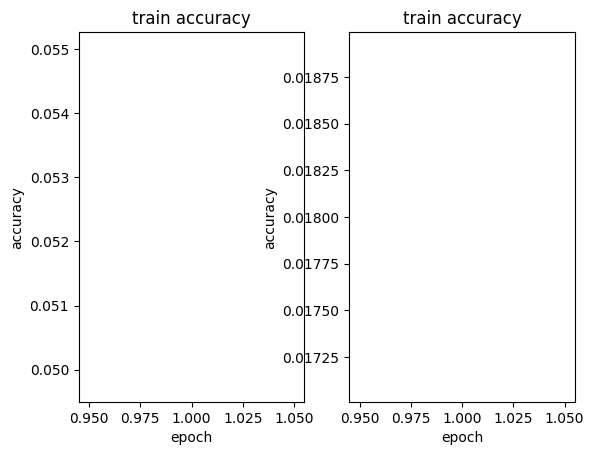

2023-04-19 19:11:08   epoch:    1 , batch:  100 , avg_batch_acc:0.0222 , avg_batch_loss:0.0496 , lr:0.001000 


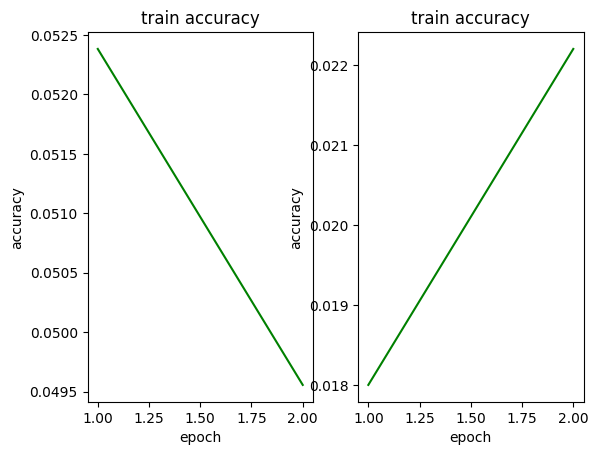

2023-04-19 19:11:11   epoch:    1 , batch:  150 , avg_batch_acc:0.0224 , avg_batch_loss:0.0482 , lr:0.001000 


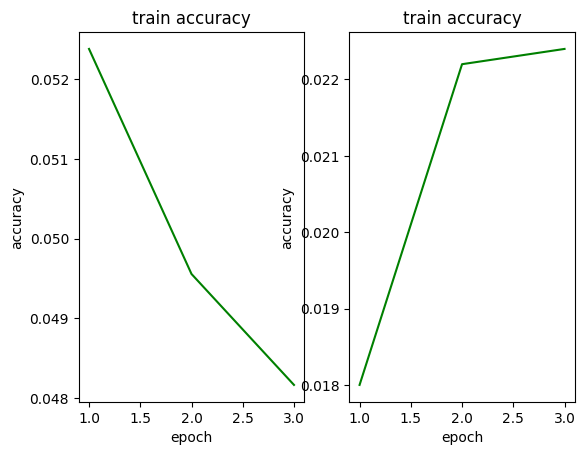

2023-04-19 19:11:14   epoch:    1 , batch:  200 , avg_batch_acc:0.0218 , avg_batch_loss:0.0475 , lr:0.001000 


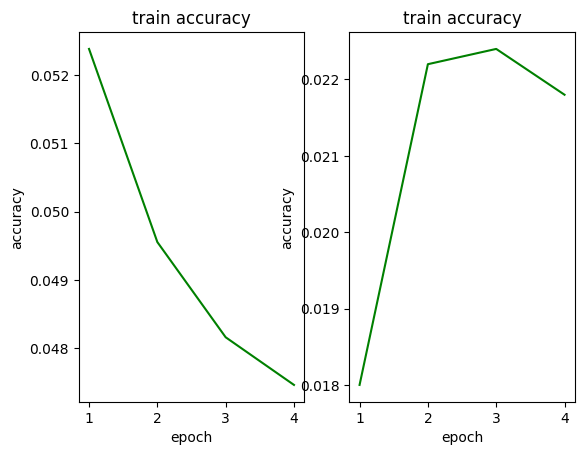

2023-04-19 19:11:17   epoch:    1 , batch:  250 , avg_batch_acc:0.0278 , avg_batch_loss:0.0469 , lr:0.001000 


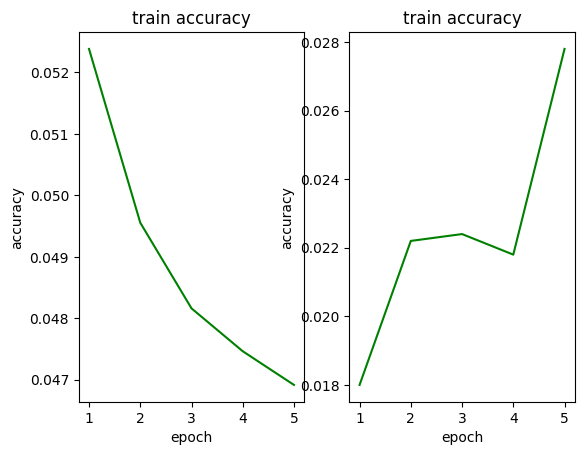

2023-04-19 19:11:20   epoch:    1 , batch:  300 , avg_batch_acc:0.0268 , avg_batch_loss:0.0465 , lr:0.001000 


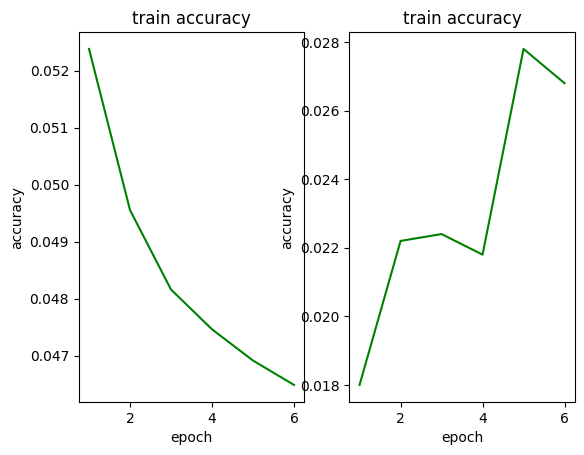

2023-04-19 19:11:23   epoch:    1 , batch:  350 , avg_batch_acc:0.0260 , avg_batch_loss:0.0461 , lr:0.001000 


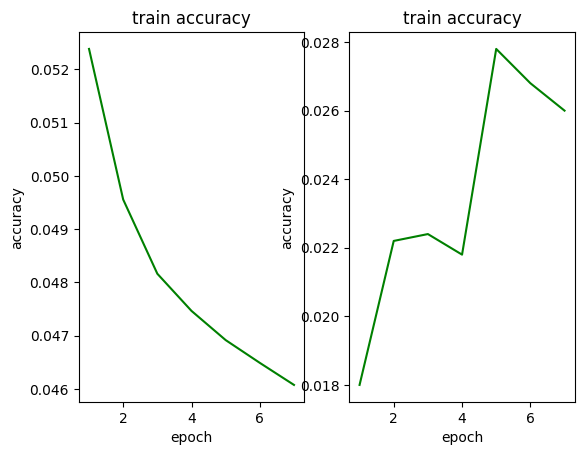

2023-04-19 19:11:27   epoch:    1 , batch:  400 , avg_batch_acc:0.0280 , avg_batch_loss:0.0457 , lr:0.001000 


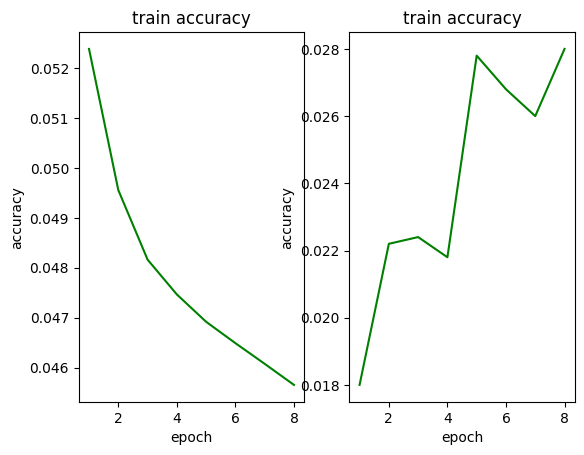

2023-04-19 19:11:30   epoch:    1 , batch:  450 , avg_batch_acc:0.0366 , avg_batch_loss:0.0456 , lr:0.001000 


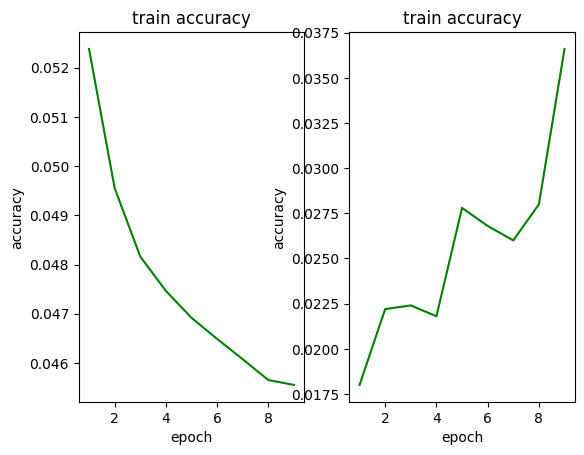

2023-04-19 19:11:33   epoch:    1 , batch:  500 , avg_batch_acc:0.0306 , avg_batch_loss:0.0450 , lr:0.001000 


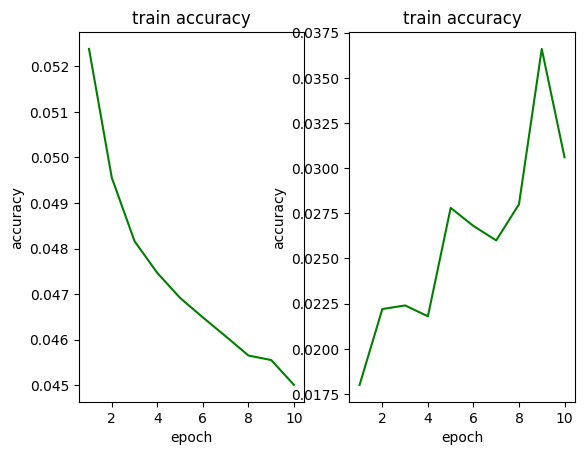

2023-04-19 19:11:36   epoch:    1 , batch:  550 , avg_batch_acc:0.0360 , avg_batch_loss:0.0447 , lr:0.001000 


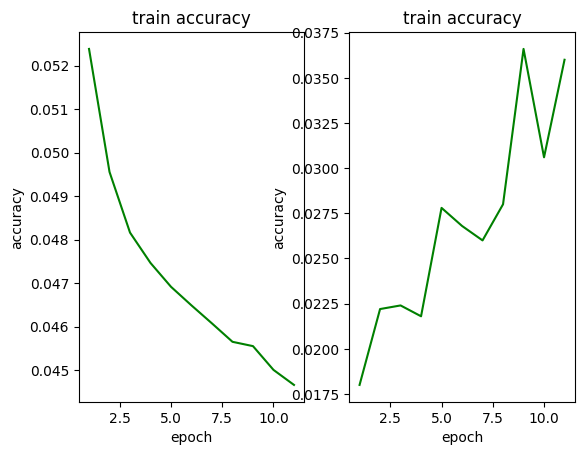

2023-04-19 19:11:39   epoch:    1 , batch:  600 , avg_batch_acc:0.0366 , avg_batch_loss:0.0447 , lr:0.001000 


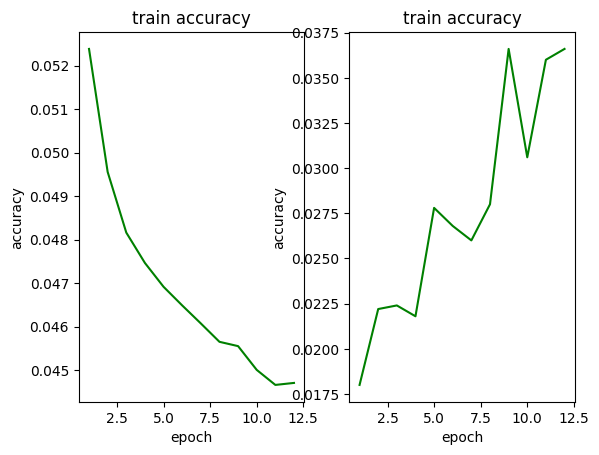

2023-04-19 19:11:42    **********epoch:    1 , avg_epoch_acc:0.0285 , avg_epoch_loss:0.0467 *************
------------test_set_acc:0.0222---------------


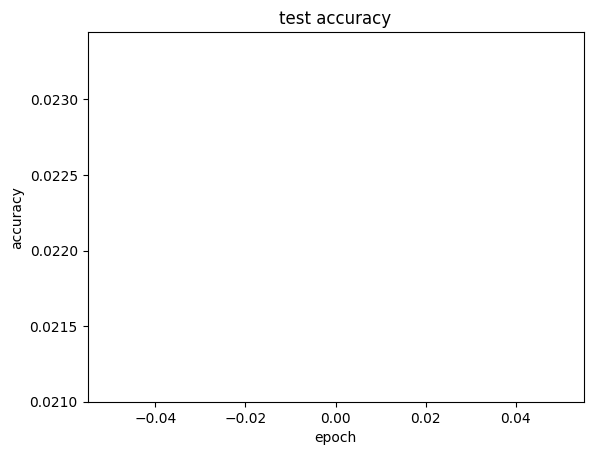

2023-04-19 19:11:45   epoch:    2 , batch:   50 , avg_batch_acc:0.0370 , avg_batch_loss:0.0446 , lr:0.001000 


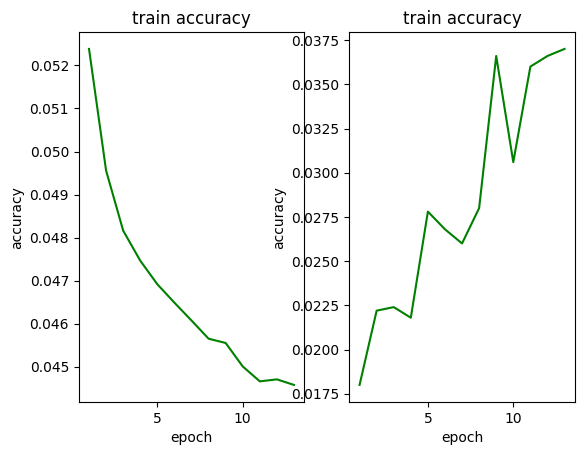

2023-04-19 19:11:48   epoch:    2 , batch:  100 , avg_batch_acc:0.0374 , avg_batch_loss:0.0444 , lr:0.001000 


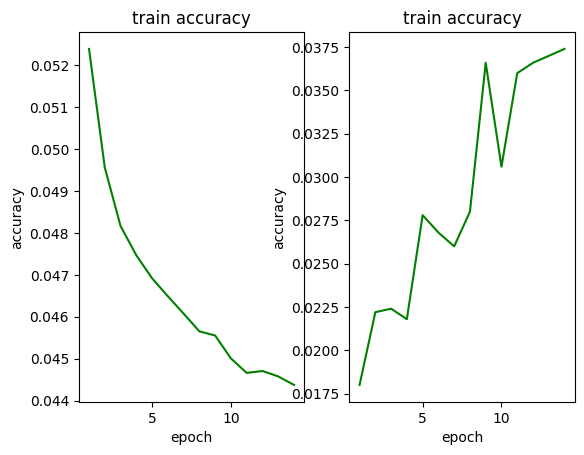

2023-04-19 19:11:51   epoch:    2 , batch:  150 , avg_batch_acc:0.0462 , avg_batch_loss:0.0437 , lr:0.001000 


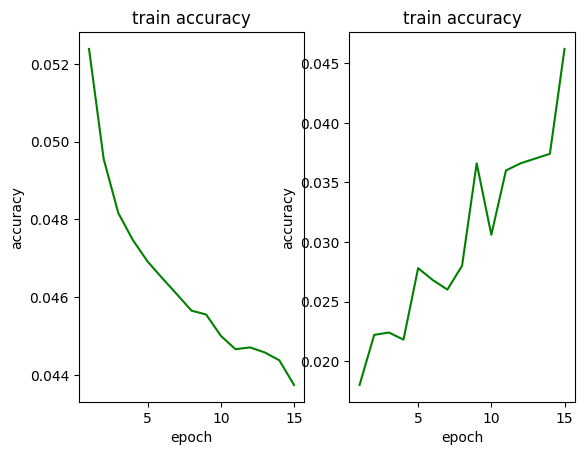

2023-04-19 19:11:54   epoch:    2 , batch:  200 , avg_batch_acc:0.0376 , avg_batch_loss:0.0436 , lr:0.001000 


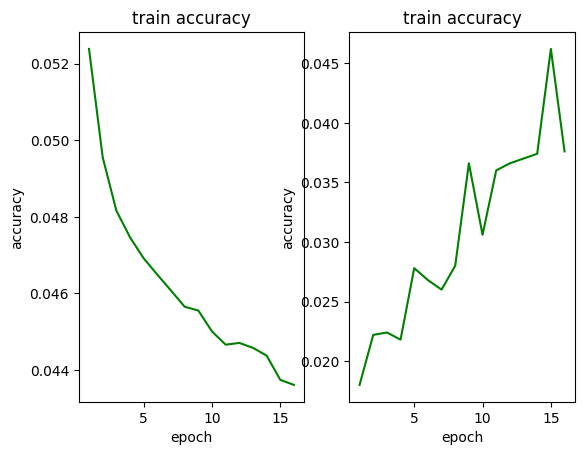

2023-04-19 19:11:57   epoch:    2 , batch:  250 , avg_batch_acc:0.0368 , avg_batch_loss:0.0437 , lr:0.001000 


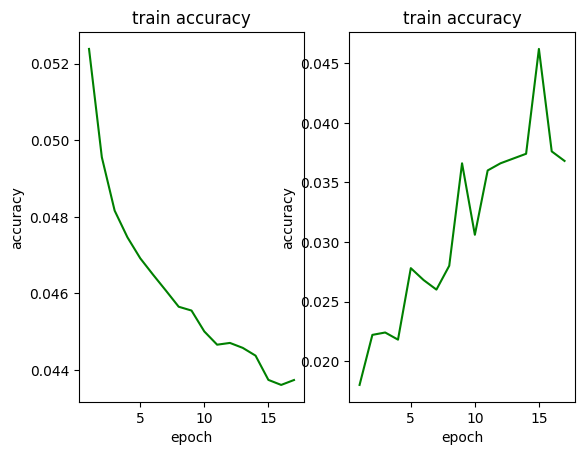

2023-04-19 19:12:01   epoch:    2 , batch:  300 , avg_batch_acc:0.0428 , avg_batch_loss:0.0435 , lr:0.001000 


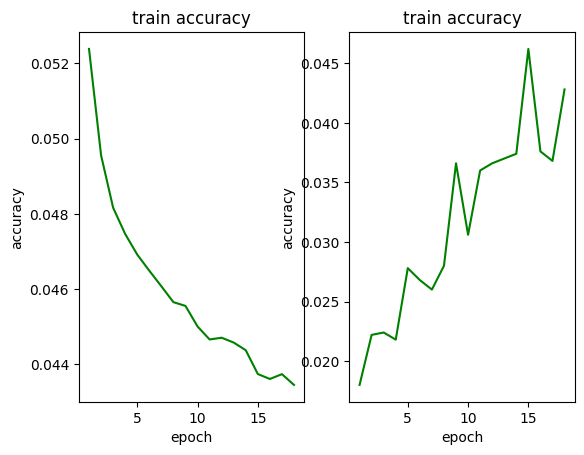

2023-04-19 19:12:04   epoch:    2 , batch:  350 , avg_batch_acc:0.0412 , avg_batch_loss:0.0434 , lr:0.001000 


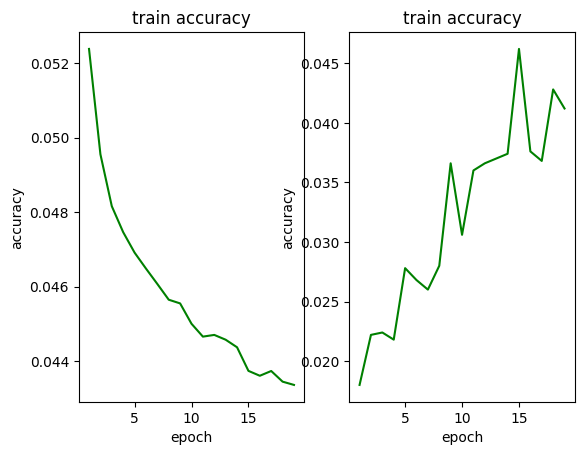

2023-04-19 19:12:07   epoch:    2 , batch:  400 , avg_batch_acc:0.0456 , avg_batch_loss:0.0431 , lr:0.001000 


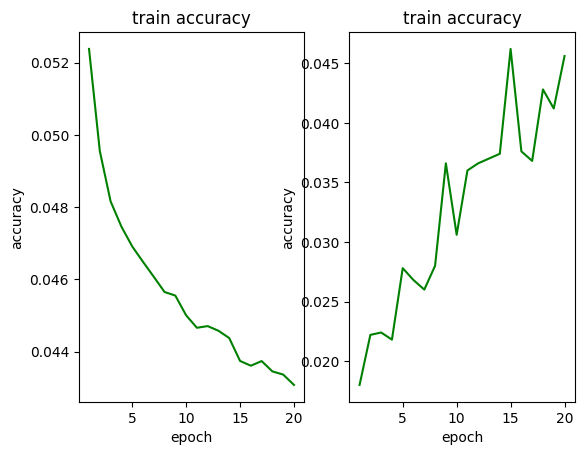

2023-04-19 19:12:10   epoch:    2 , batch:  450 , avg_batch_acc:0.0530 , avg_batch_loss:0.0432 , lr:0.001000 


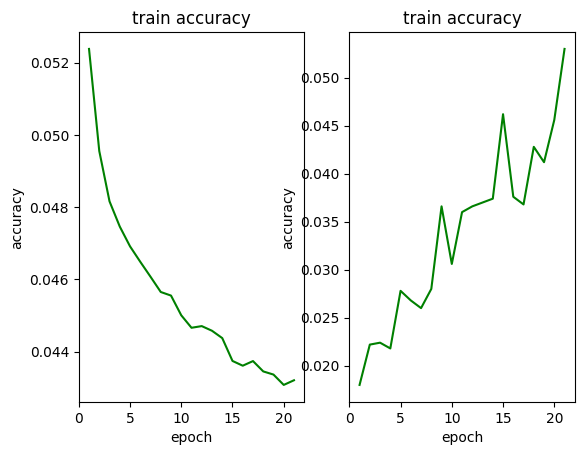

2023-04-19 19:12:13   epoch:    2 , batch:  500 , avg_batch_acc:0.0450 , avg_batch_loss:0.0428 , lr:0.001000 


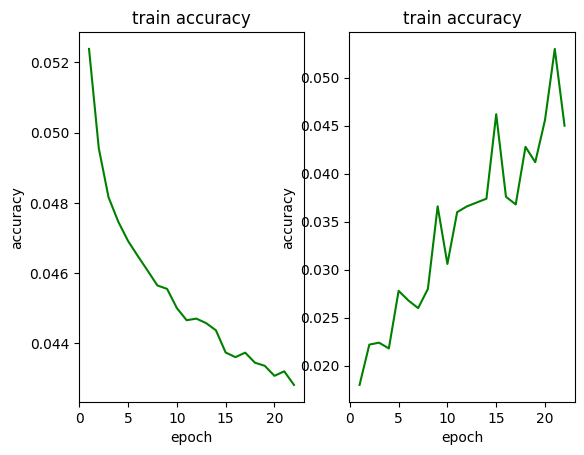

2023-04-19 19:12:16   epoch:    2 , batch:  550 , avg_batch_acc:0.0468 , avg_batch_loss:0.0426 , lr:0.001000 


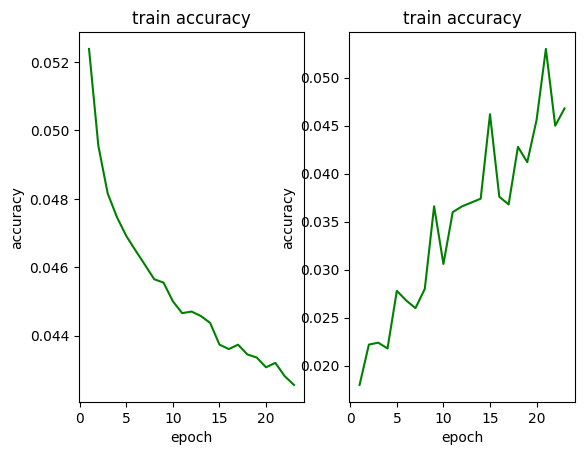

2023-04-19 19:12:19   epoch:    2 , batch:  600 , avg_batch_acc:0.0498 , avg_batch_loss:0.0428 , lr:0.001000 


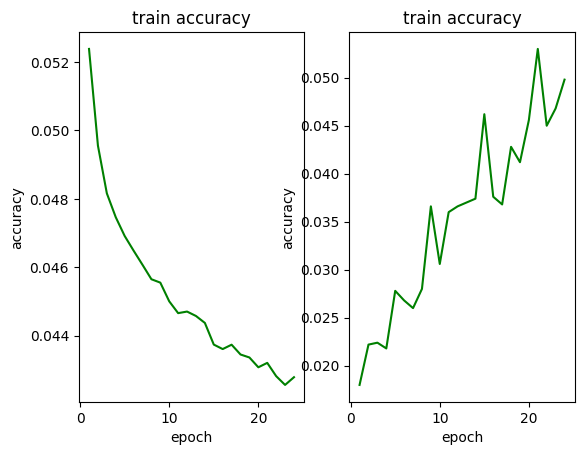

2023-04-19 19:12:22    **********epoch:    2 , avg_epoch_acc:0.0437 , avg_epoch_loss:0.0434 *************
------------test_set_acc:0.0333---------------


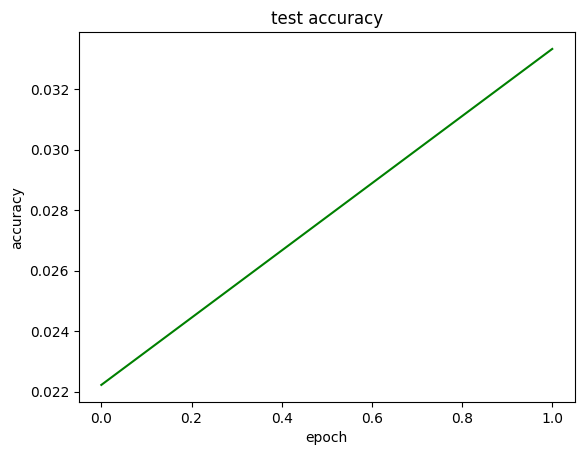

2023-04-19 19:12:25   epoch:    3 , batch:   50 , avg_batch_acc:0.0488 , avg_batch_loss:0.0428 , lr:0.001000 


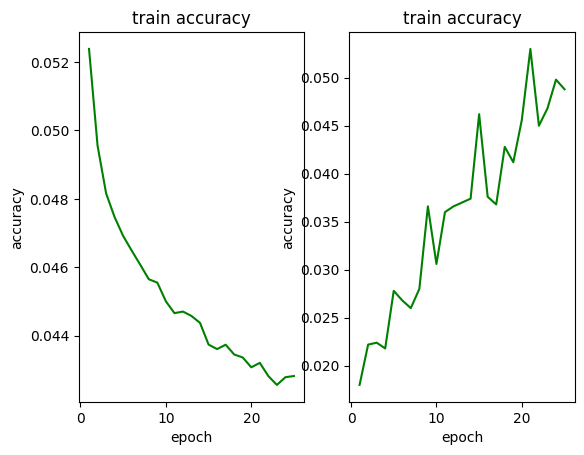

2023-04-19 19:12:28   epoch:    3 , batch:  100 , avg_batch_acc:0.0490 , avg_batch_loss:0.0427 , lr:0.001000 


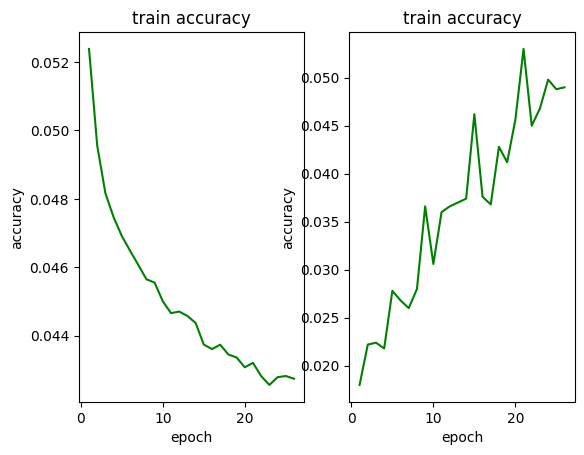

2023-04-19 19:12:31   epoch:    3 , batch:  150 , avg_batch_acc:0.0580 , avg_batch_loss:0.0422 , lr:0.001000 


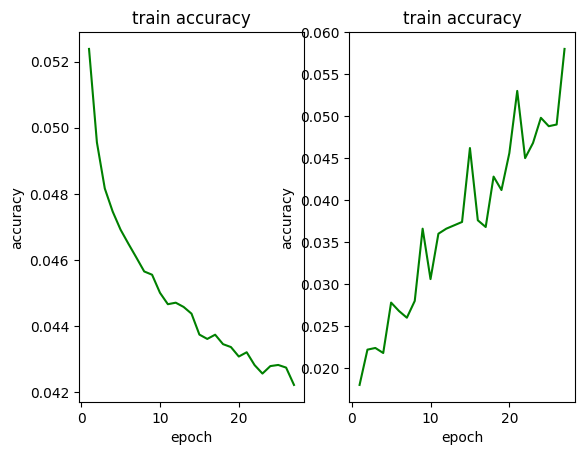

2023-04-19 19:12:34   epoch:    3 , batch:  200 , avg_batch_acc:0.0496 , avg_batch_loss:0.0421 , lr:0.001000 


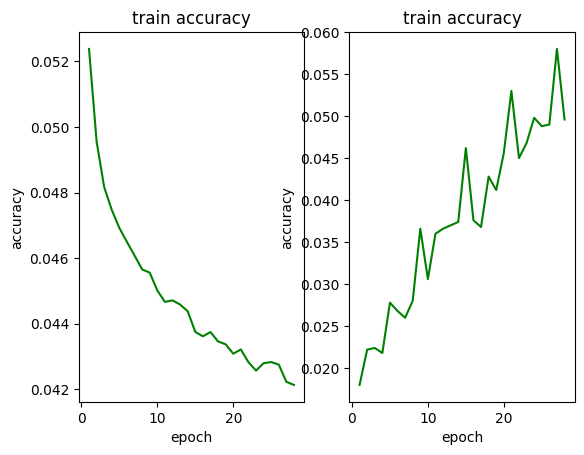

2023-04-19 19:12:37   epoch:    3 , batch:  250 , avg_batch_acc:0.0484 , avg_batch_loss:0.0422 , lr:0.001000 


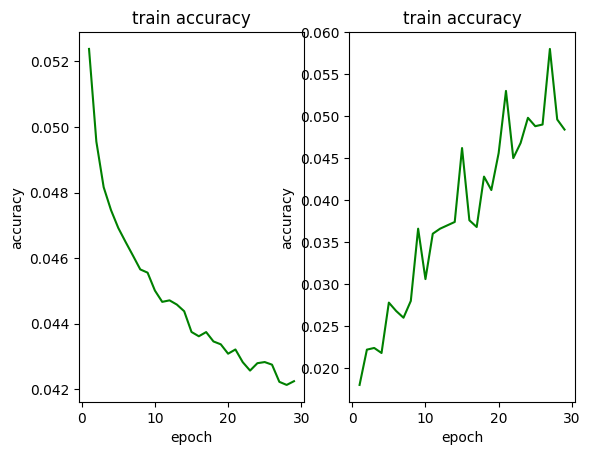

2023-04-19 19:12:41   epoch:    3 , batch:  300 , avg_batch_acc:0.0496 , avg_batch_loss:0.0421 , lr:0.001000 


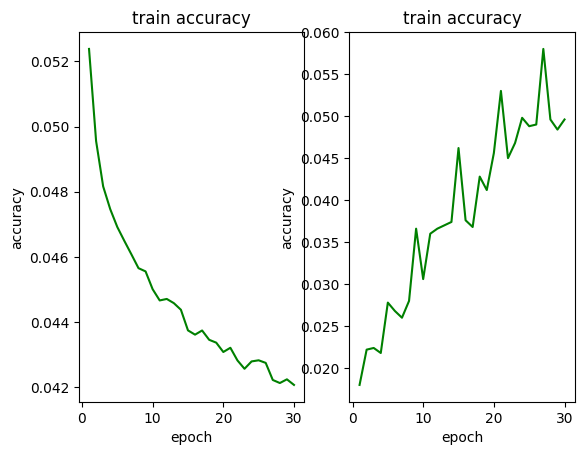

2023-04-19 19:12:44   epoch:    3 , batch:  350 , avg_batch_acc:0.0534 , avg_batch_loss:0.0420 , lr:0.001000 


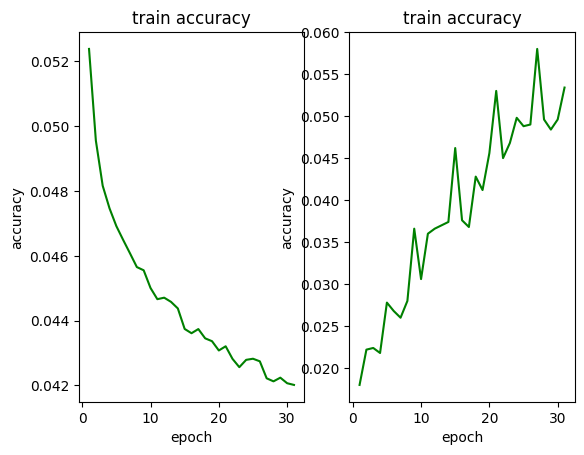

2023-04-19 19:12:47   epoch:    3 , batch:  400 , avg_batch_acc:0.0536 , avg_batch_loss:0.0418 , lr:0.001000 


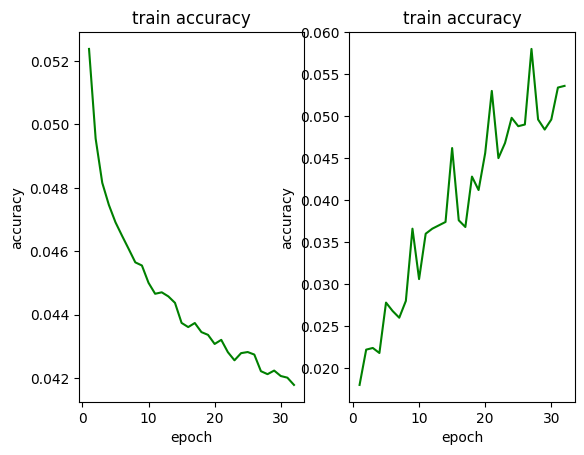

2023-04-19 19:12:50   epoch:    3 , batch:  450 , avg_batch_acc:0.0576 , avg_batch_loss:0.0421 , lr:0.001000 


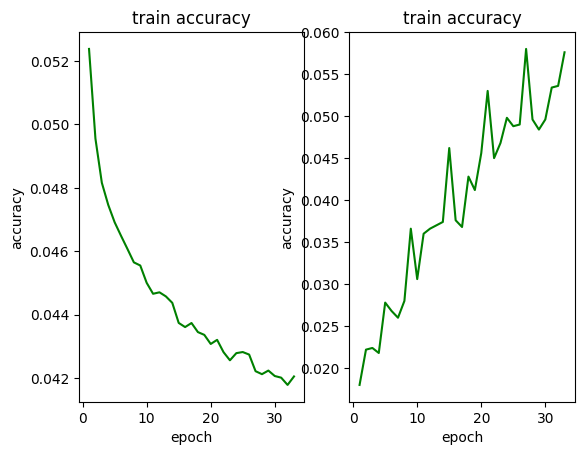

2023-04-19 19:12:53   epoch:    3 , batch:  500 , avg_batch_acc:0.0530 , avg_batch_loss:0.0417 , lr:0.001000 


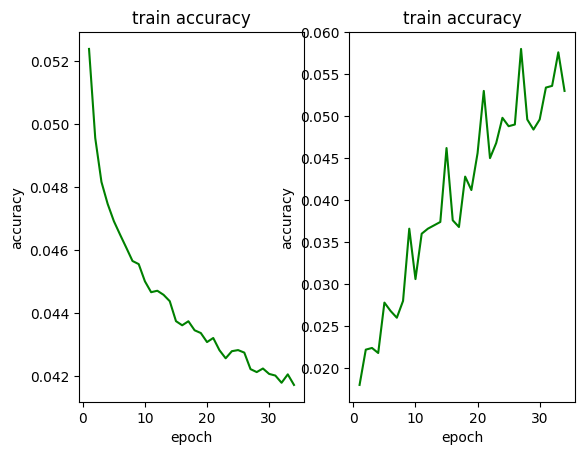

2023-04-19 19:12:56   epoch:    3 , batch:  550 , avg_batch_acc:0.0558 , avg_batch_loss:0.0415 , lr:0.001000 


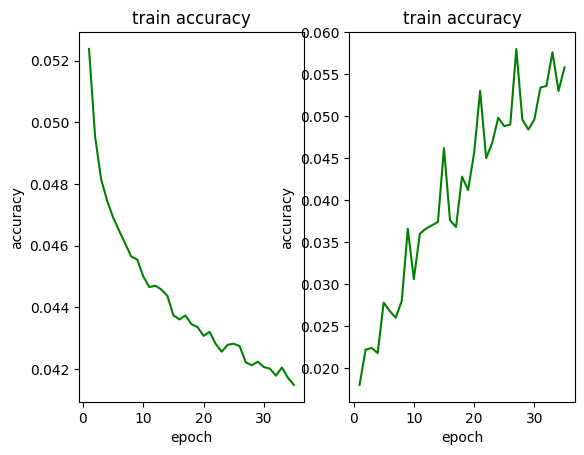

2023-04-19 19:12:59   epoch:    3 , batch:  600 , avg_batch_acc:0.0576 , avg_batch_loss:0.0418 , lr:0.001000 


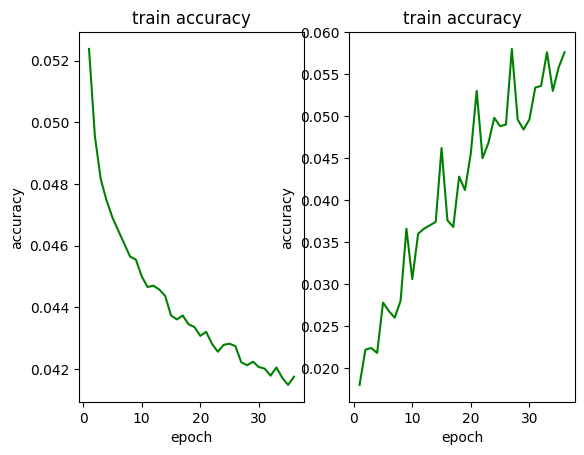

2023-04-19 19:13:02    **********epoch:    3 , avg_epoch_acc:0.0533 , avg_epoch_loss:0.0420 *************
------------test_set_acc:0.0378---------------


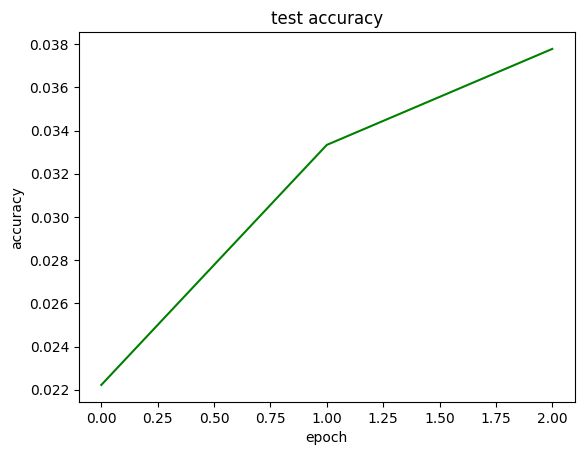

2023-04-19 19:13:05   epoch:    4 , batch:   50 , avg_batch_acc:0.0556 , avg_batch_loss:0.0418 , lr:0.001000 


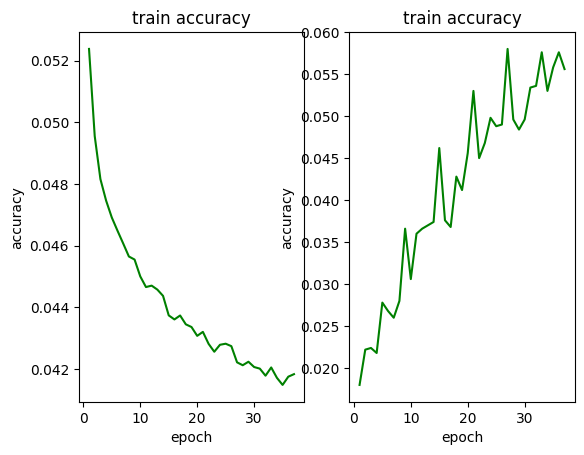

2023-04-19 19:13:08   epoch:    4 , batch:  100 , avg_batch_acc:0.0600 , avg_batch_loss:0.0418 , lr:0.001000 


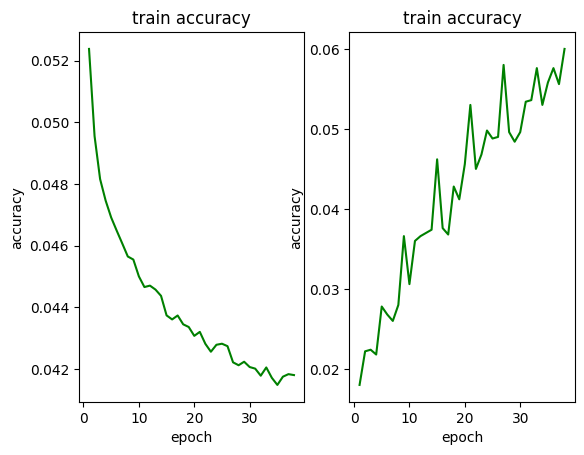

2023-04-19 19:13:11   epoch:    4 , batch:  150 , avg_batch_acc:0.0656 , avg_batch_loss:0.0413 , lr:0.001000 


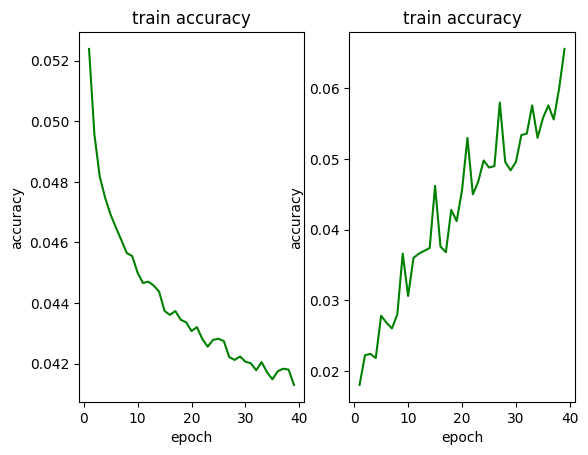

2023-04-19 19:13:14   epoch:    4 , batch:  200 , avg_batch_acc:0.0560 , avg_batch_loss:0.0413 , lr:0.001000 


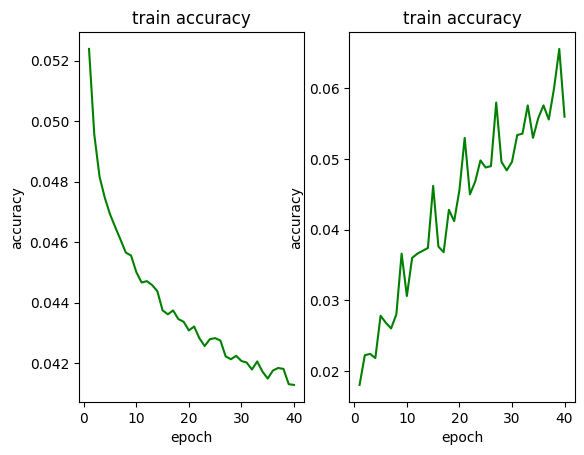

2023-04-19 19:13:17   epoch:    4 , batch:  250 , avg_batch_acc:0.0566 , avg_batch_loss:0.0414 , lr:0.001000 


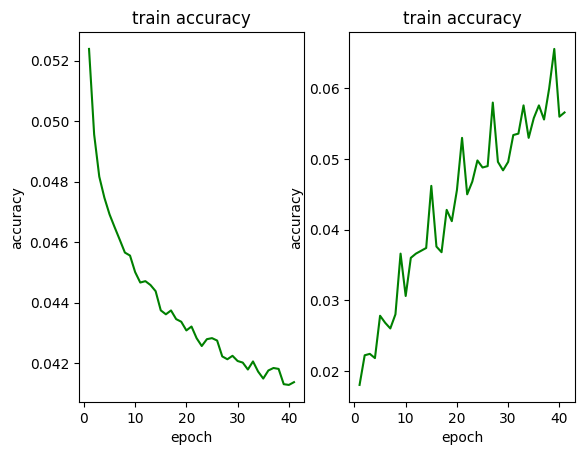

2023-04-19 19:13:21   epoch:    4 , batch:  300 , avg_batch_acc:0.0540 , avg_batch_loss:0.0412 , lr:0.001000 


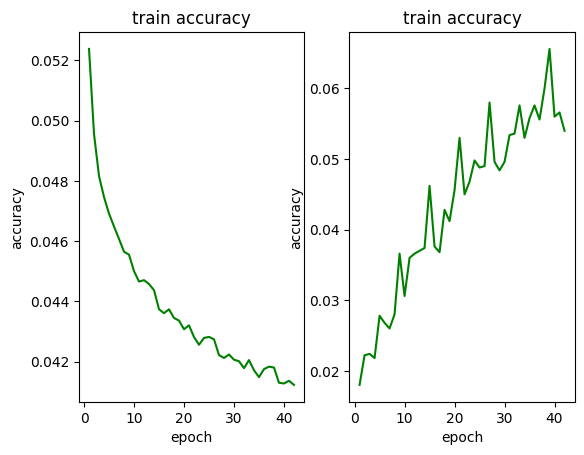

2023-04-19 19:13:24   epoch:    4 , batch:  350 , avg_batch_acc:0.0590 , avg_batch_loss:0.0412 , lr:0.001000 


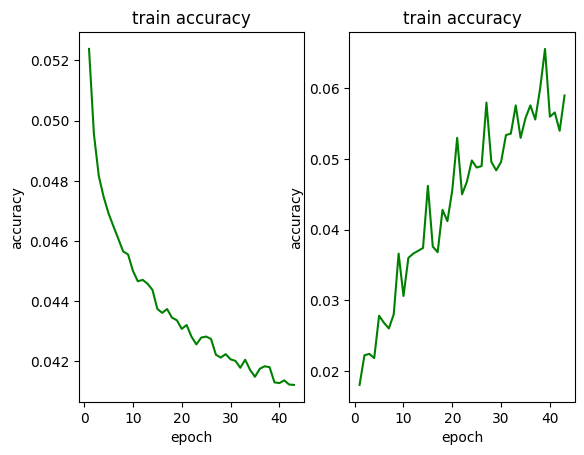

2023-04-19 19:13:27   epoch:    4 , batch:  400 , avg_batch_acc:0.0610 , avg_batch_loss:0.0410 , lr:0.001000 


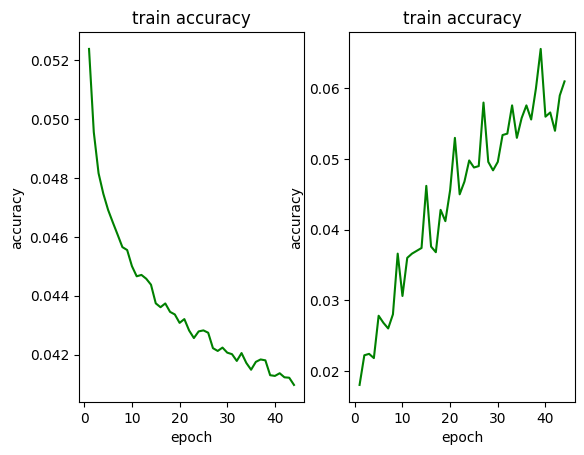

2023-04-19 19:13:30   epoch:    4 , batch:  450 , avg_batch_acc:0.0632 , avg_batch_loss:0.0413 , lr:0.001000 


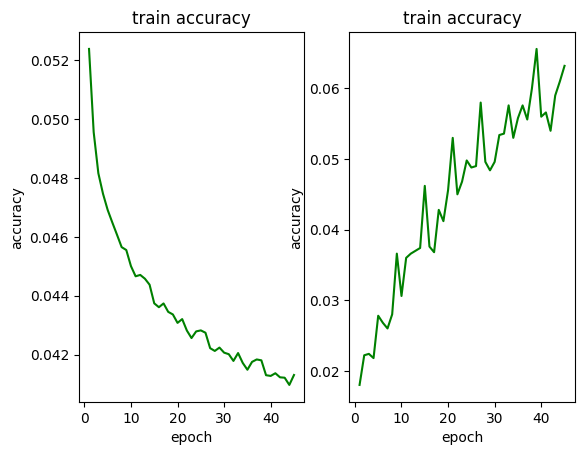

2023-04-19 19:13:33   epoch:    4 , batch:  500 , avg_batch_acc:0.0592 , avg_batch_loss:0.0410 , lr:0.001000 


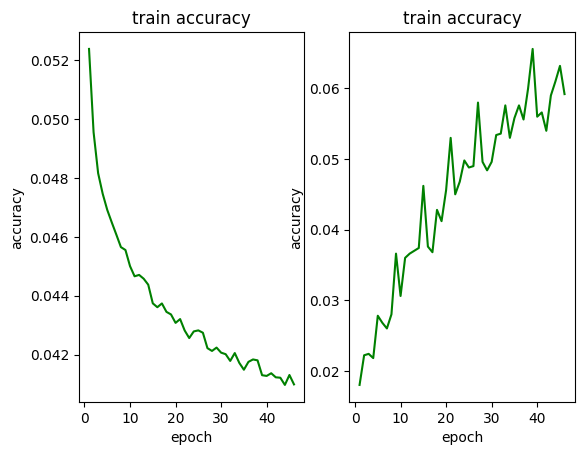

2023-04-19 19:13:37   epoch:    4 , batch:  550 , avg_batch_acc:0.0620 , avg_batch_loss:0.0408 , lr:0.001000 


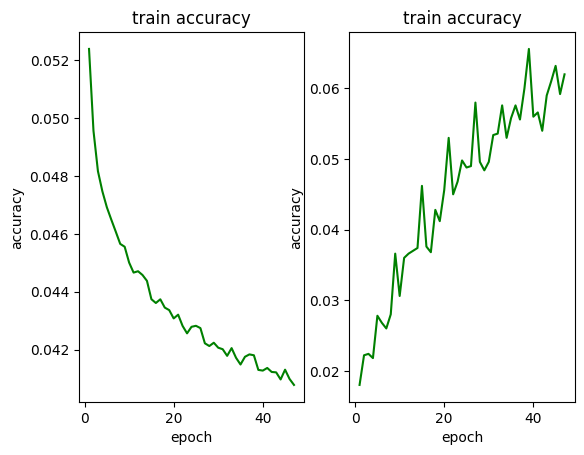

2023-04-19 19:13:40   epoch:    4 , batch:  600 , avg_batch_acc:0.0608 , avg_batch_loss:0.0411 , lr:0.001000 


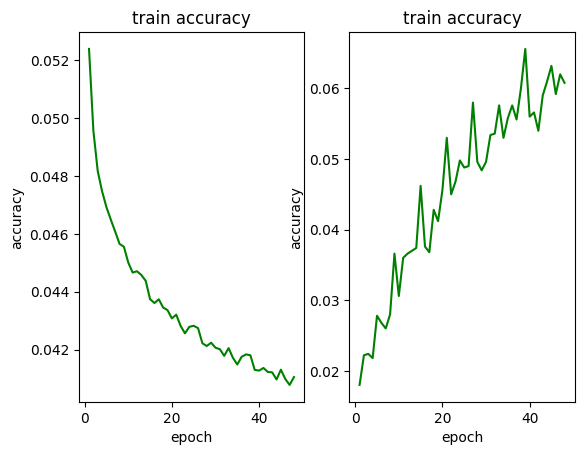

2023-04-19 19:13:42    **********epoch:    4 , avg_epoch_acc:0.0598 , avg_epoch_loss:0.0412 *************
------------test_set_acc:0.0356---------------


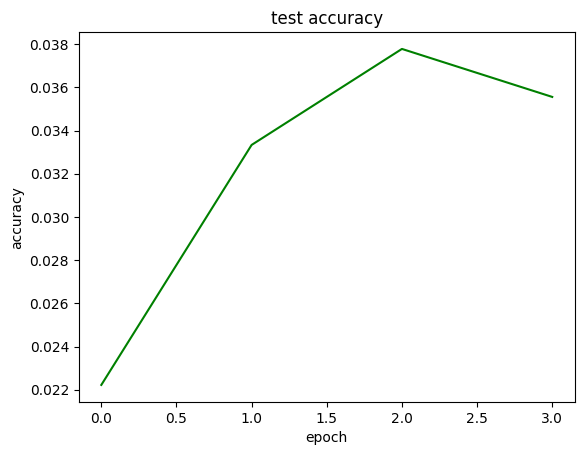

2023-04-19 19:13:45   epoch:    5 , batch:   50 , avg_batch_acc:0.0600 , avg_batch_loss:0.0411 , lr:0.001000 


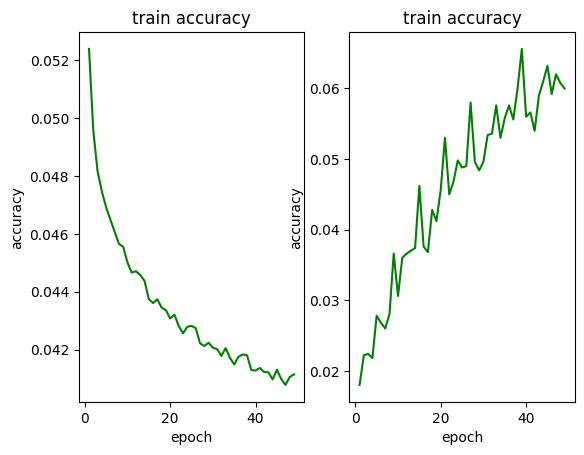

2023-04-19 19:13:48   epoch:    5 , batch:  100 , avg_batch_acc:0.0648 , avg_batch_loss:0.0412 , lr:0.001000 


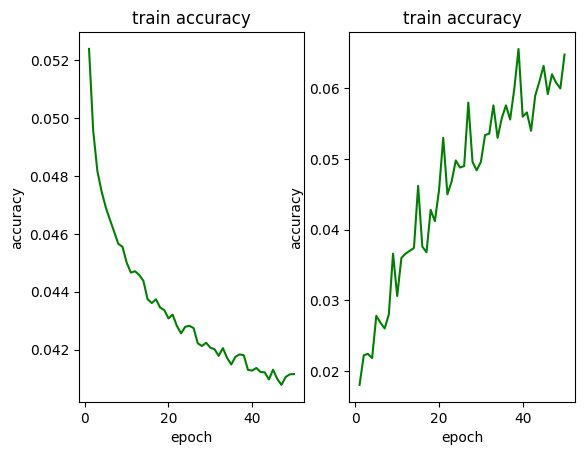

2023-04-19 19:13:52   epoch:    5 , batch:  150 , avg_batch_acc:0.0708 , avg_batch_loss:0.0406 , lr:0.001000 


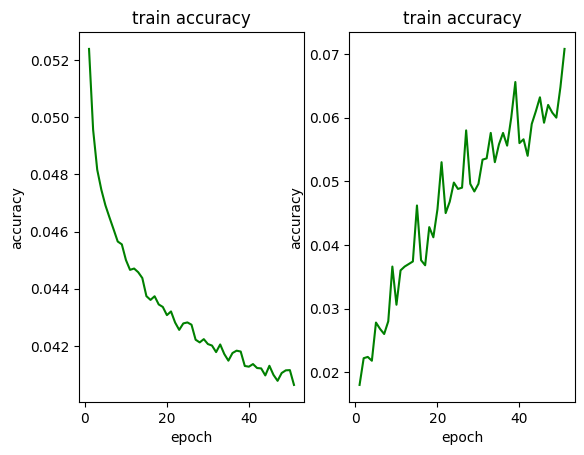

2023-04-19 19:13:55   epoch:    5 , batch:  200 , avg_batch_acc:0.0604 , avg_batch_loss:0.0407 , lr:0.001000 


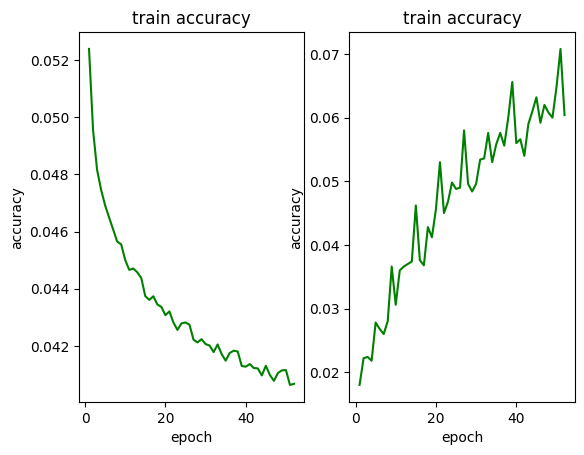

2023-04-19 19:13:58   epoch:    5 , batch:  250 , avg_batch_acc:0.0604 , avg_batch_loss:0.0407 , lr:0.001000 


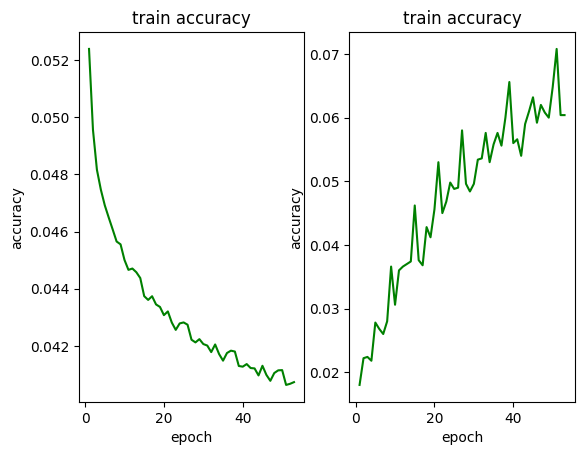

2023-04-19 19:14:01   epoch:    5 , batch:  300 , avg_batch_acc:0.0590 , avg_batch_loss:0.0406 , lr:0.001000 


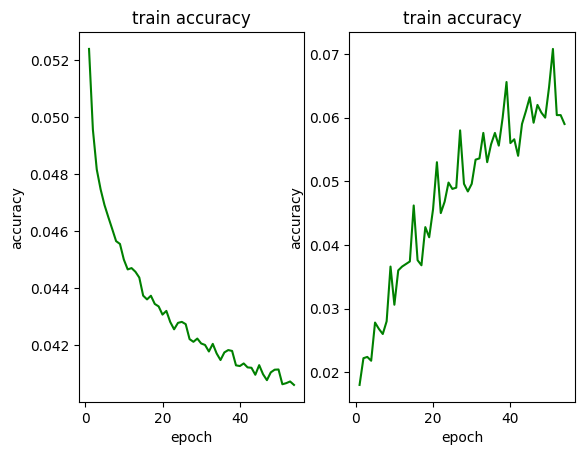

2023-04-19 19:14:04   epoch:    5 , batch:  350 , avg_batch_acc:0.0640 , avg_batch_loss:0.0406 , lr:0.001000 


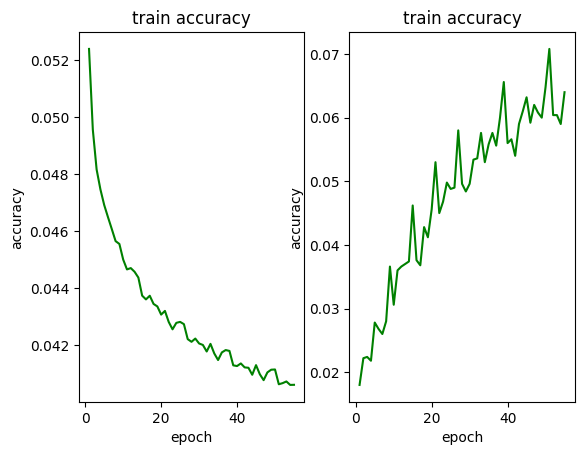

2023-04-19 19:14:07   epoch:    5 , batch:  400 , avg_batch_acc:0.0640 , avg_batch_loss:0.0404 , lr:0.001000 


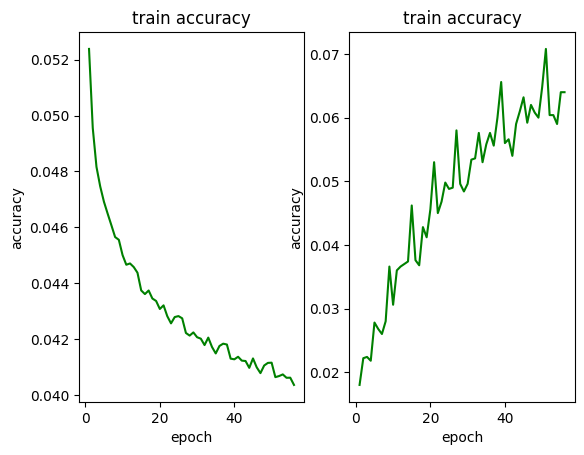

2023-04-19 19:14:11   epoch:    5 , batch:  450 , avg_batch_acc:0.0684 , avg_batch_loss:0.0407 , lr:0.001000 


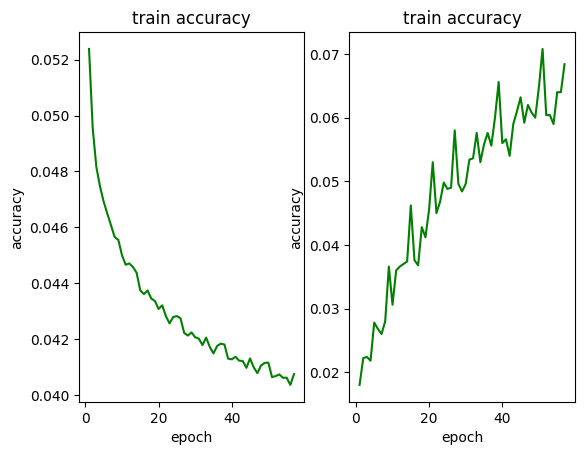

2023-04-19 19:14:14   epoch:    5 , batch:  500 , avg_batch_acc:0.0654 , avg_batch_loss:0.0404 , lr:0.001000 


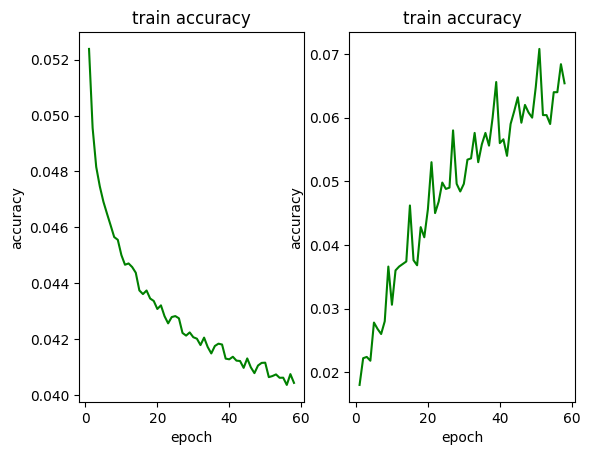

2023-04-19 19:14:17   epoch:    5 , batch:  550 , avg_batch_acc:0.0664 , avg_batch_loss:0.0402 , lr:0.001000 


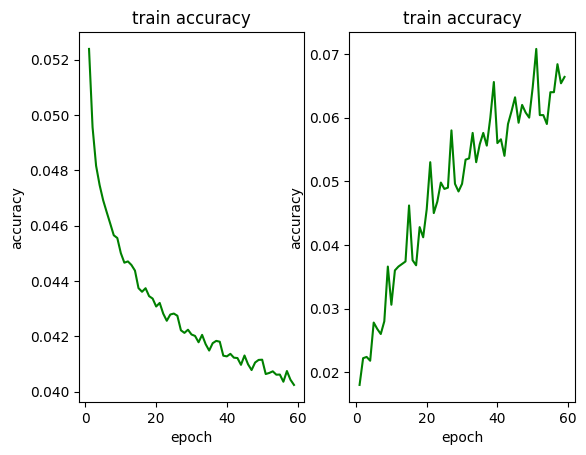

2023-04-19 19:14:20   epoch:    5 , batch:  600 , avg_batch_acc:0.0654 , avg_batch_loss:0.0405 , lr:0.001000 


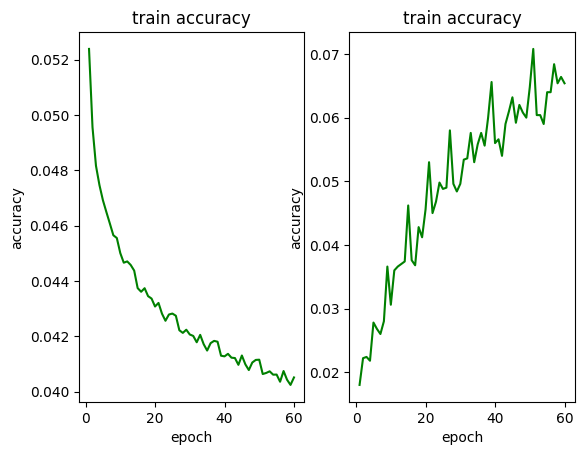

2023-04-19 19:14:22    **********epoch:    5 , avg_epoch_acc:0.0647 , avg_epoch_loss:0.0406 *************
------------test_set_acc:0.0467---------------


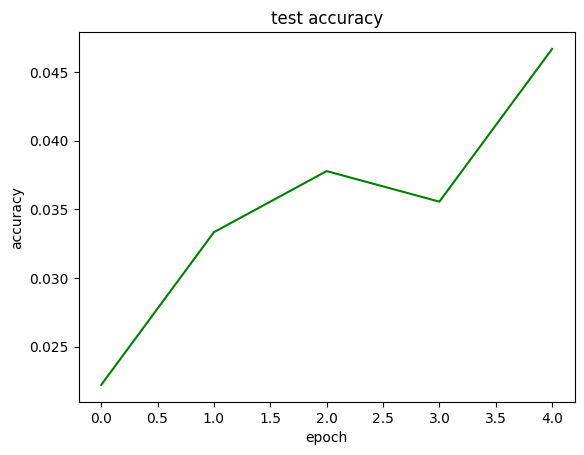

2023-04-19 19:14:26   epoch:    6 , batch:   50 , avg_batch_acc:0.0614 , avg_batch_loss:0.0406 , lr:0.001000 


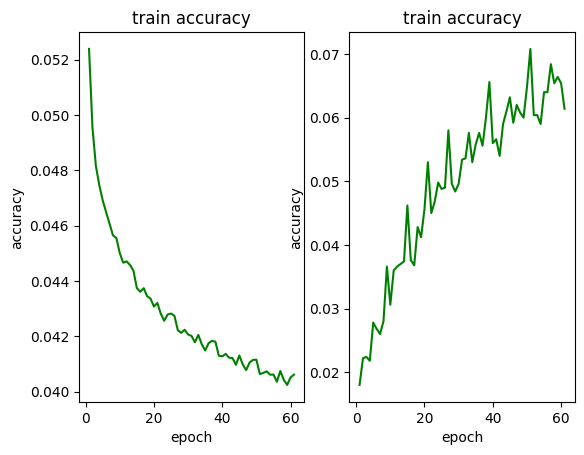

2023-04-19 19:14:29   epoch:    6 , batch:  100 , avg_batch_acc:0.0712 , avg_batch_loss:0.0406 , lr:0.001000 


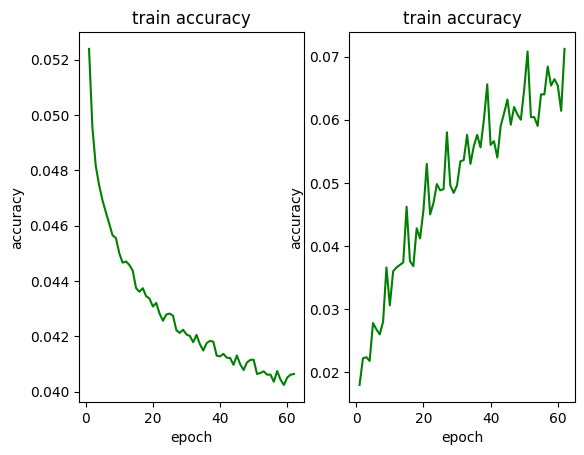

2023-04-19 19:14:32   epoch:    6 , batch:  150 , avg_batch_acc:0.0736 , avg_batch_loss:0.0401 , lr:0.001000 


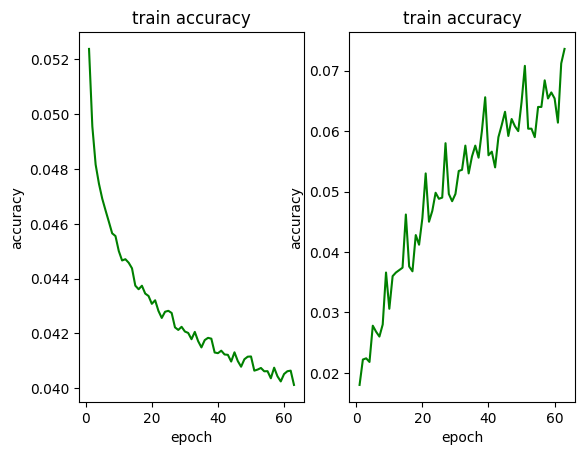

2023-04-19 19:14:35   epoch:    6 , batch:  200 , avg_batch_acc:0.0624 , avg_batch_loss:0.0402 , lr:0.001000 


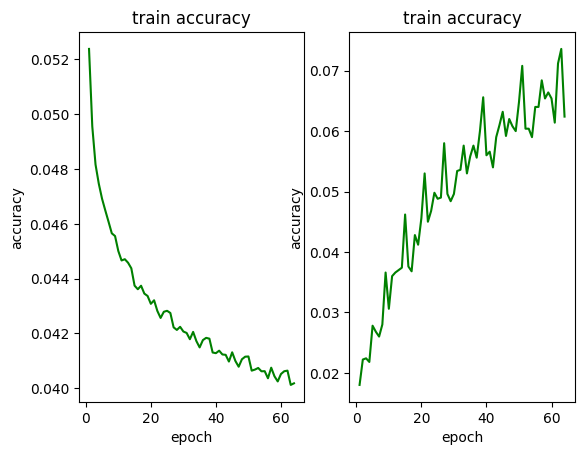

2023-04-19 19:14:38   epoch:    6 , batch:  250 , avg_batch_acc:0.0642 , avg_batch_loss:0.0402 , lr:0.001000 


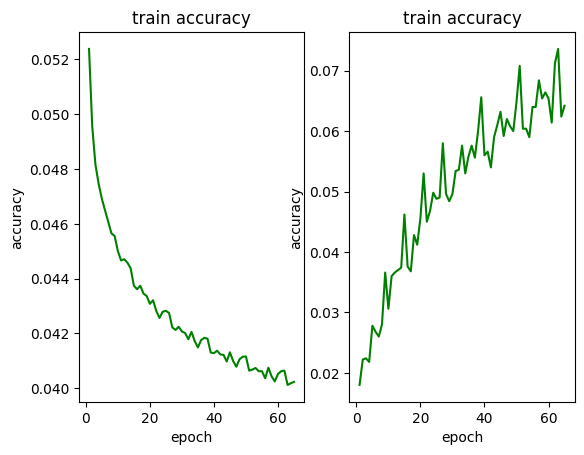

2023-04-19 19:14:41   epoch:    6 , batch:  300 , avg_batch_acc:0.0642 , avg_batch_loss:0.0401 , lr:0.001000 


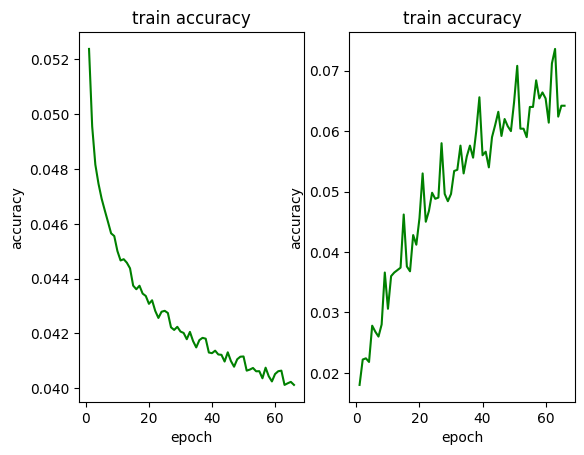

2023-04-19 19:14:45   epoch:    6 , batch:  350 , avg_batch_acc:0.0652 , avg_batch_loss:0.0401 , lr:0.001000 


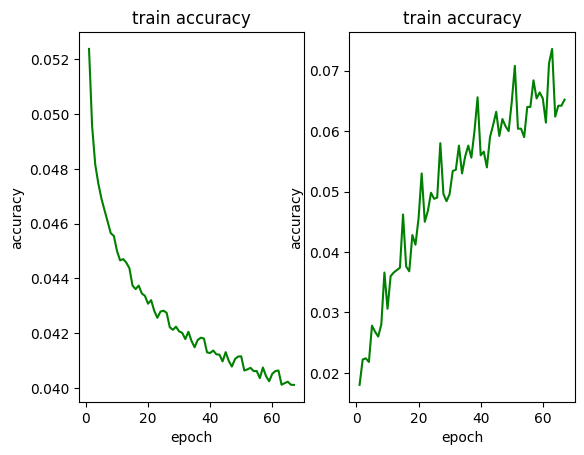

2023-04-19 19:14:48   epoch:    6 , batch:  400 , avg_batch_acc:0.0672 , avg_batch_loss:0.0399 , lr:0.001000 


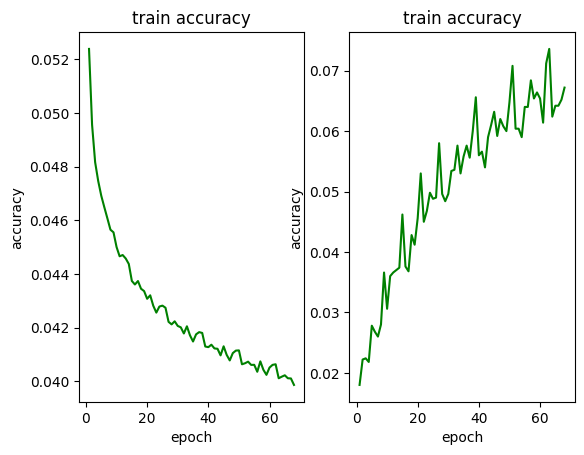

2023-04-19 19:14:51   epoch:    6 , batch:  450 , avg_batch_acc:0.0704 , avg_batch_loss:0.0403 , lr:0.001000 


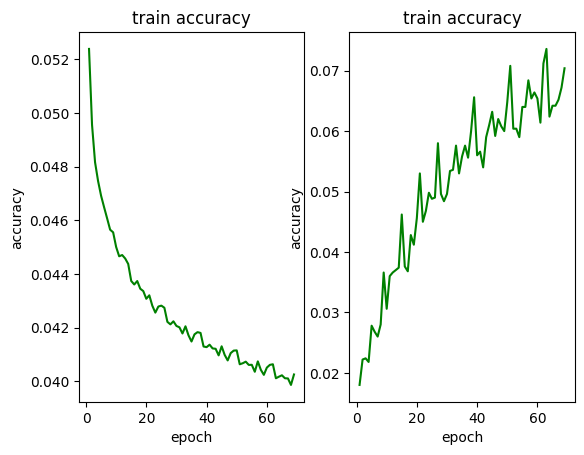

2023-04-19 19:14:54   epoch:    6 , batch:  500 , avg_batch_acc:0.0696 , avg_batch_loss:0.0400 , lr:0.001000 


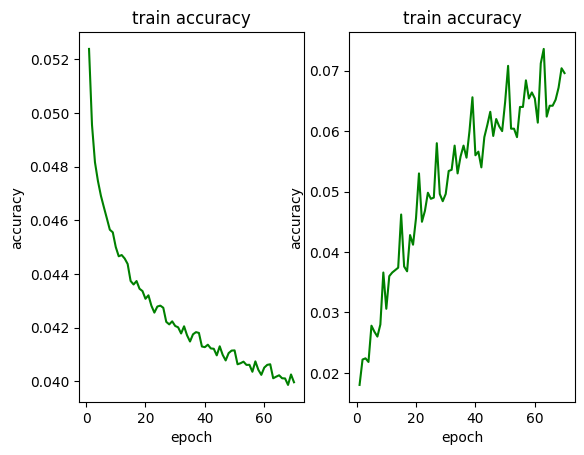

2023-04-19 19:14:57   epoch:    6 , batch:  550 , avg_batch_acc:0.0714 , avg_batch_loss:0.0398 , lr:0.001000 


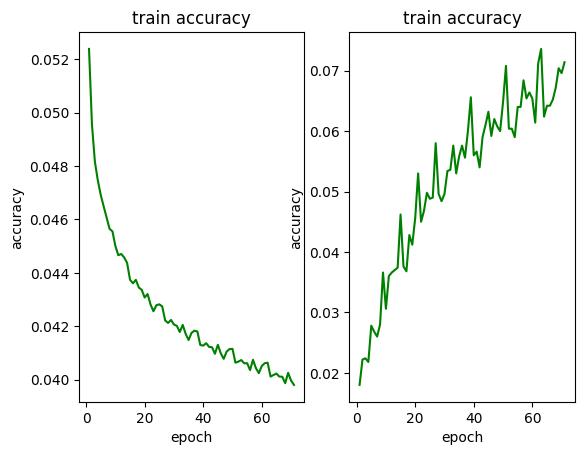

2023-04-19 19:15:01   epoch:    6 , batch:  600 , avg_batch_acc:0.0696 , avg_batch_loss:0.0401 , lr:0.001000 


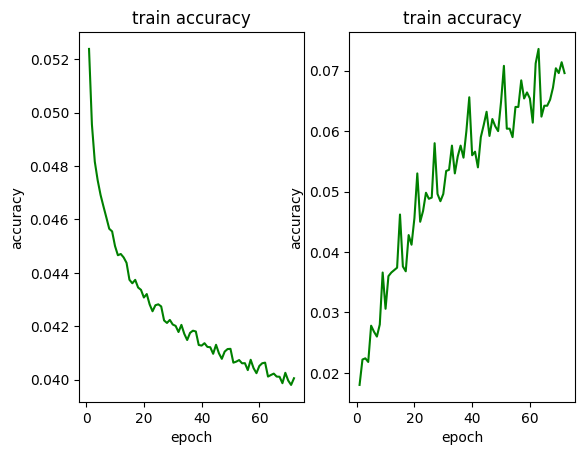

2023-04-19 19:15:03    **********epoch:    6 , avg_epoch_acc:0.0681 , avg_epoch_loss:0.0401 *************
------------test_set_acc:0.0467---------------


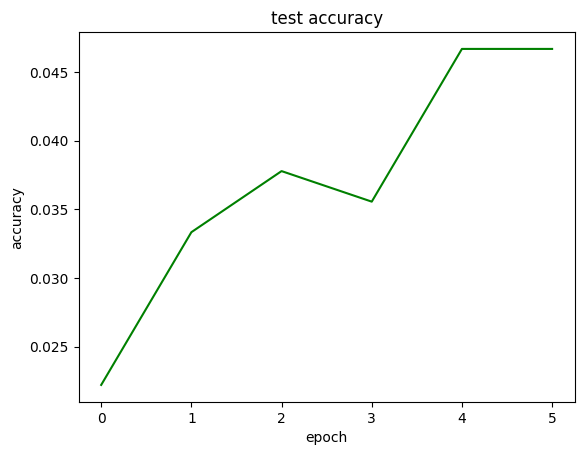

2023-04-19 19:15:06   epoch:    7 , batch:   50 , avg_batch_acc:0.0636 , avg_batch_loss:0.0402 , lr:0.001000 


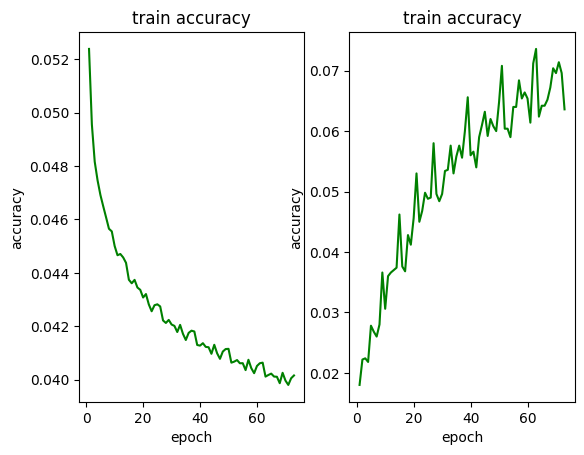

2023-04-19 19:15:09   epoch:    7 , batch:  100 , avg_batch_acc:0.0726 , avg_batch_loss:0.0402 , lr:0.001000 


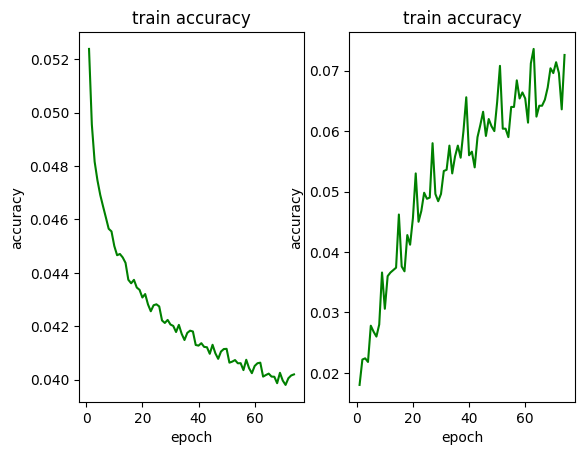

2023-04-19 19:15:13   epoch:    7 , batch:  150 , avg_batch_acc:0.0770 , avg_batch_loss:0.0397 , lr:0.001000 


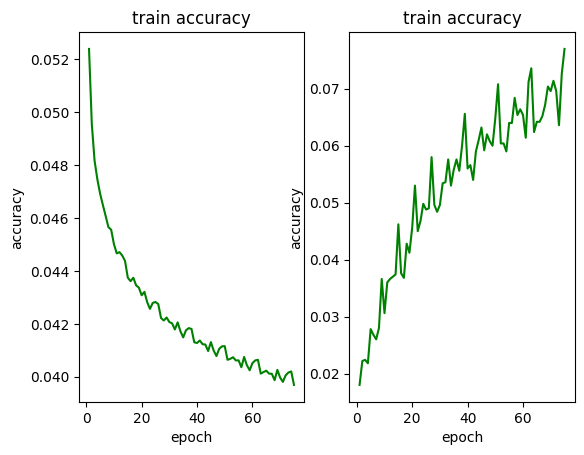

2023-04-19 19:15:16   epoch:    7 , batch:  200 , avg_batch_acc:0.0668 , avg_batch_loss:0.0398 , lr:0.001000 


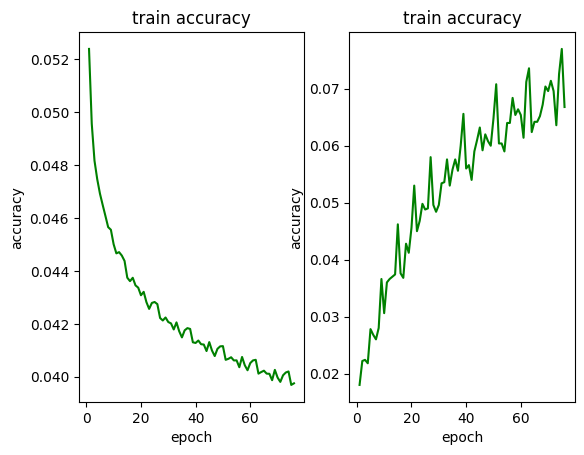

2023-04-19 19:15:19   epoch:    7 , batch:  250 , avg_batch_acc:0.0690 , avg_batch_loss:0.0398 , lr:0.001000 


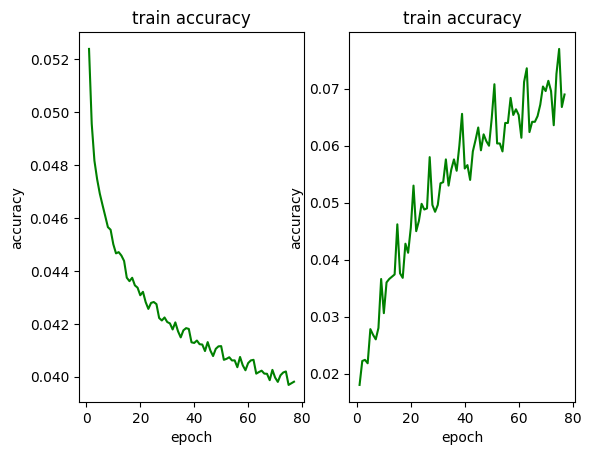

2023-04-19 19:15:22   epoch:    7 , batch:  300 , avg_batch_acc:0.0678 , avg_batch_loss:0.0397 , lr:0.001000 


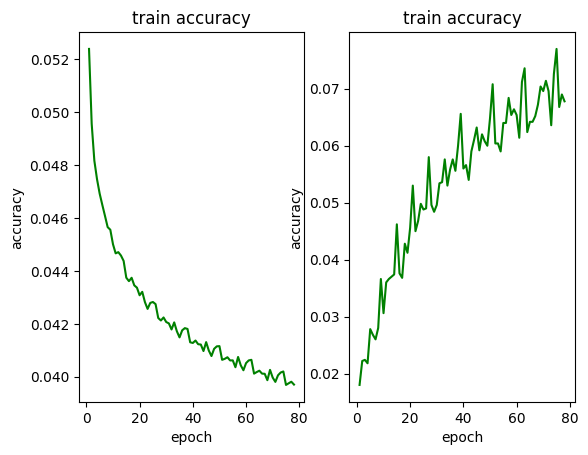

2023-04-19 19:15:26   epoch:    7 , batch:  350 , avg_batch_acc:0.0700 , avg_batch_loss:0.0397 , lr:0.001000 


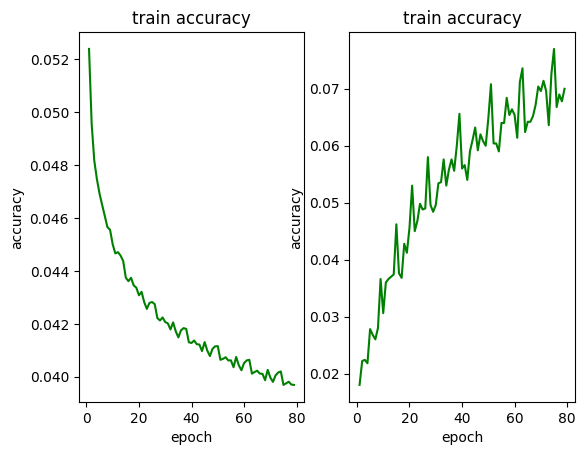

2023-04-19 19:15:29   epoch:    7 , batch:  400 , avg_batch_acc:0.0698 , avg_batch_loss:0.0395 , lr:0.001000 


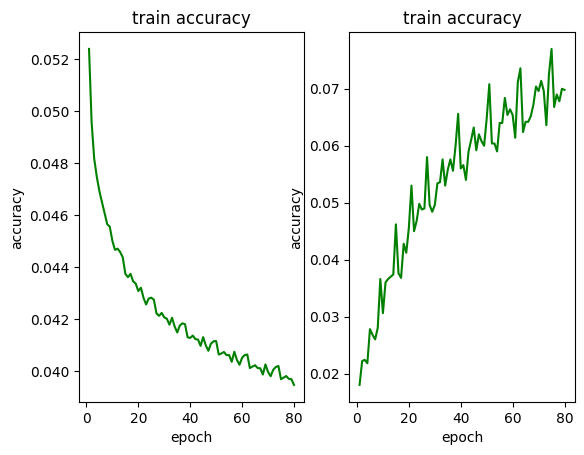

2023-04-19 19:15:32   epoch:    7 , batch:  450 , avg_batch_acc:0.0764 , avg_batch_loss:0.0399 , lr:0.001000 


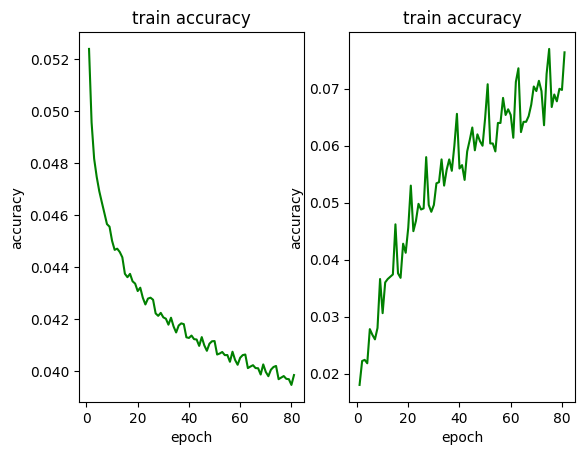

2023-04-19 19:15:35   epoch:    7 , batch:  500 , avg_batch_acc:0.0742 , avg_batch_loss:0.0396 , lr:0.001000 


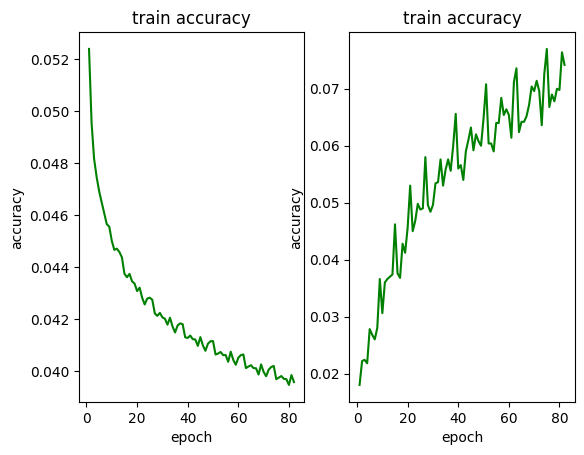

2023-04-19 19:15:38   epoch:    7 , batch:  550 , avg_batch_acc:0.0736 , avg_batch_loss:0.0394 , lr:0.001000 


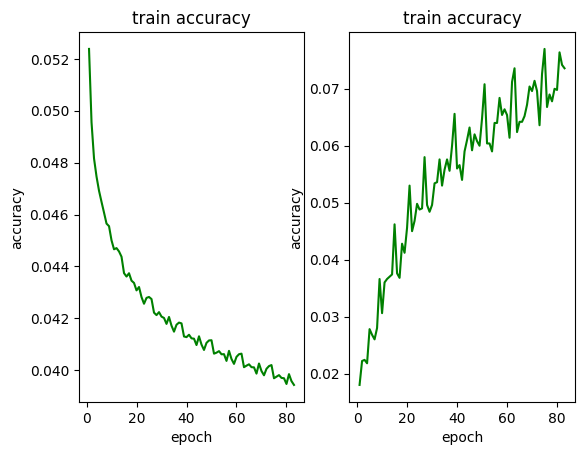

2023-04-19 19:15:41   epoch:    7 , batch:  600 , avg_batch_acc:0.0732 , avg_batch_loss:0.0397 , lr:0.001000 


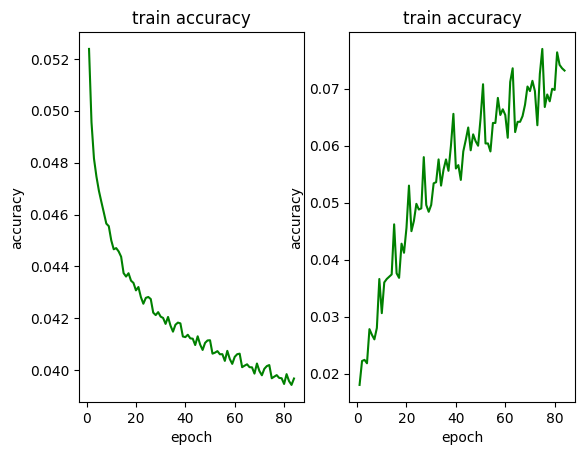

2023-04-19 19:15:44    **********epoch:    7 , avg_epoch_acc:0.0716 , avg_epoch_loss:0.0397 *************
------------test_set_acc:0.0511---------------


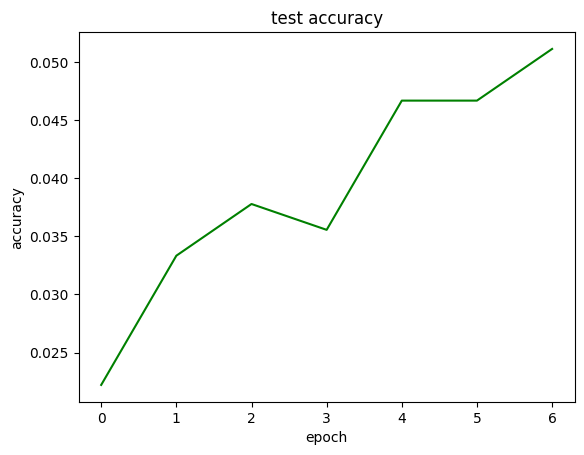

2023-04-19 19:15:47   epoch:    8 , batch:   50 , avg_batch_acc:0.0678 , avg_batch_loss:0.0398 , lr:0.001000 


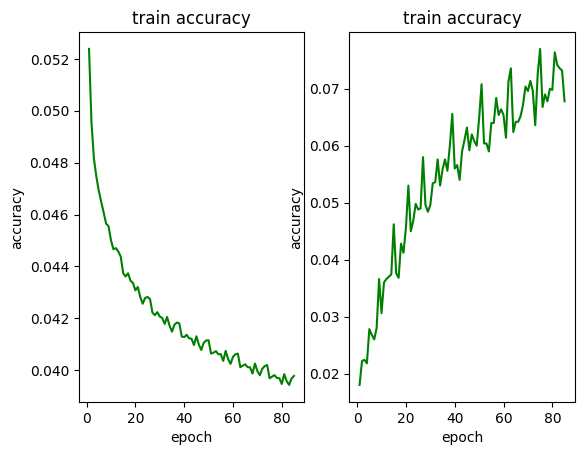

2023-04-19 19:15:50   epoch:    8 , batch:  100 , avg_batch_acc:0.0764 , avg_batch_loss:0.0399 , lr:0.001000 


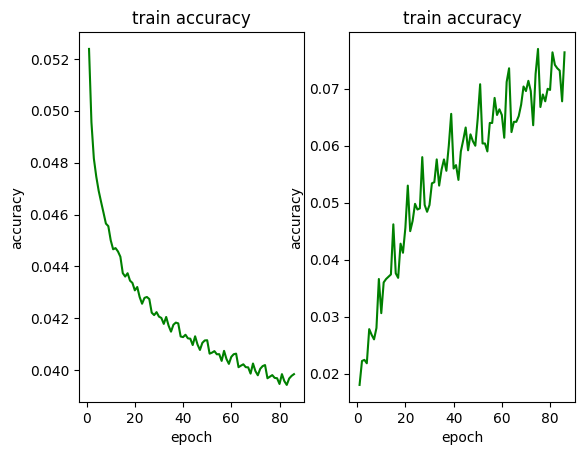

2023-04-19 19:15:53   epoch:    8 , batch:  150 , avg_batch_acc:0.0806 , avg_batch_loss:0.0393 , lr:0.001000 


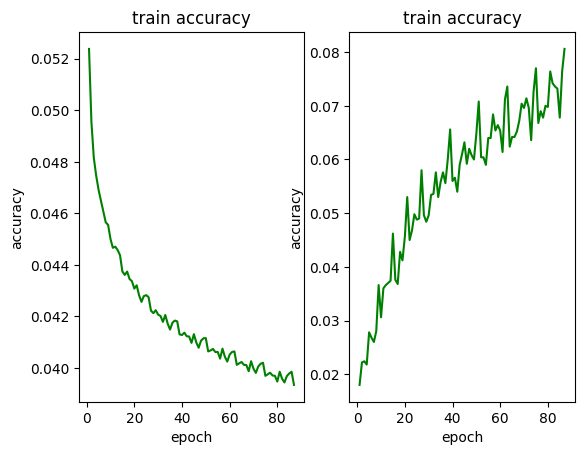

2023-04-19 19:15:56   epoch:    8 , batch:  200 , avg_batch_acc:0.0720 , avg_batch_loss:0.0394 , lr:0.001000 


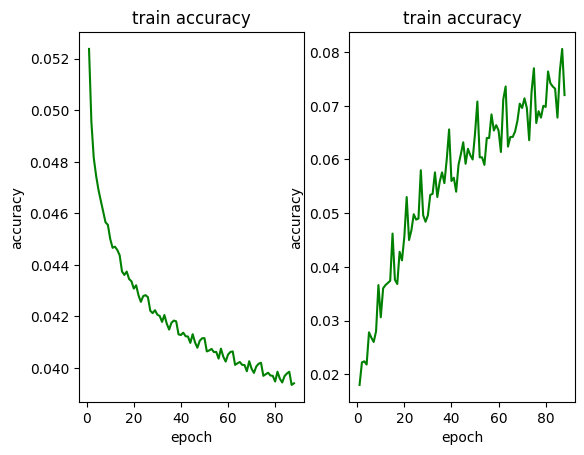

2023-04-19 19:16:00   epoch:    8 , batch:  250 , avg_batch_acc:0.0760 , avg_batch_loss:0.0395 , lr:0.001000 


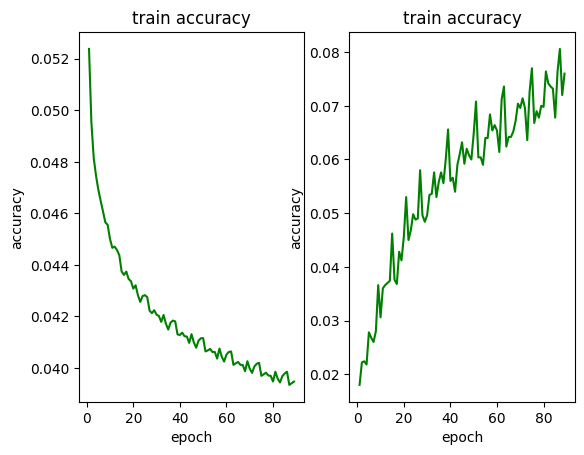

2023-04-19 19:16:03   epoch:    8 , batch:  300 , avg_batch_acc:0.0694 , avg_batch_loss:0.0394 , lr:0.001000 


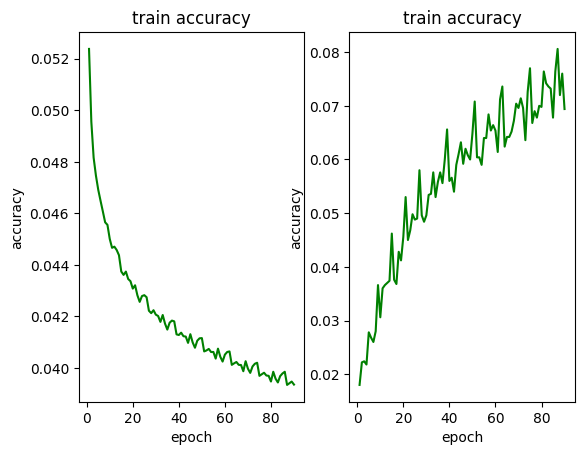

2023-04-19 19:16:06   epoch:    8 , batch:  350 , avg_batch_acc:0.0724 , avg_batch_loss:0.0393 , lr:0.001000 


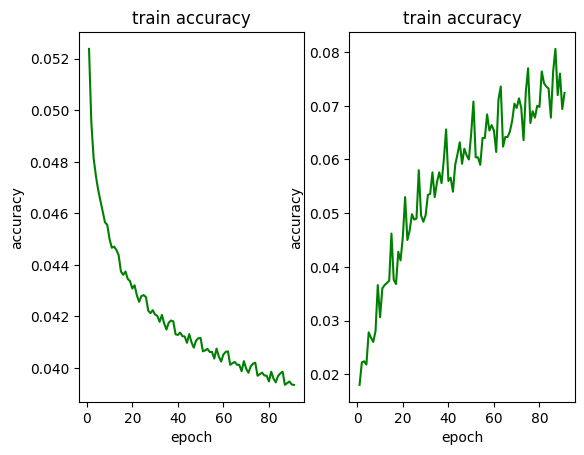

2023-04-19 19:16:09   epoch:    8 , batch:  400 , avg_batch_acc:0.0734 , avg_batch_loss:0.0391 , lr:0.001000 


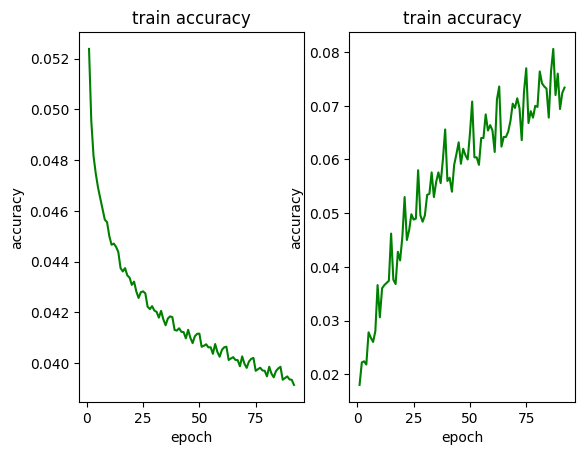

2023-04-19 19:16:12   epoch:    8 , batch:  450 , avg_batch_acc:0.0814 , avg_batch_loss:0.0395 , lr:0.001000 


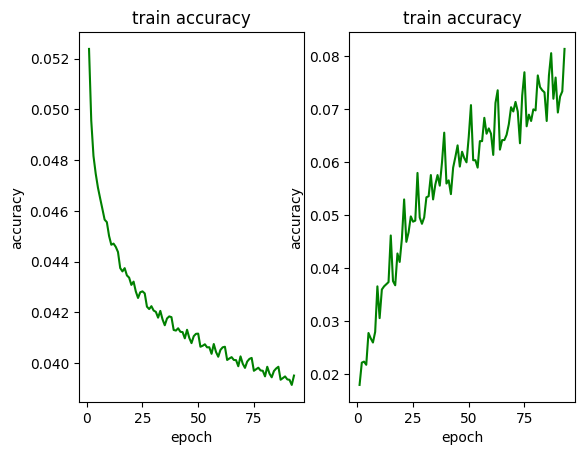

2023-04-19 19:16:16   epoch:    8 , batch:  500 , avg_batch_acc:0.0778 , avg_batch_loss:0.0393 , lr:0.001000 


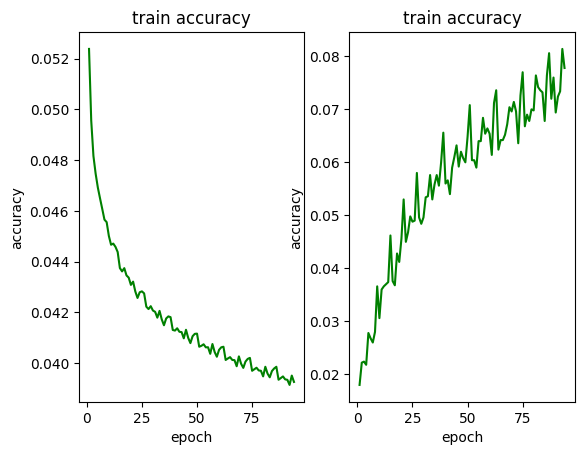

2023-04-19 19:16:19   epoch:    8 , batch:  550 , avg_batch_acc:0.0774 , avg_batch_loss:0.0391 , lr:0.001000 


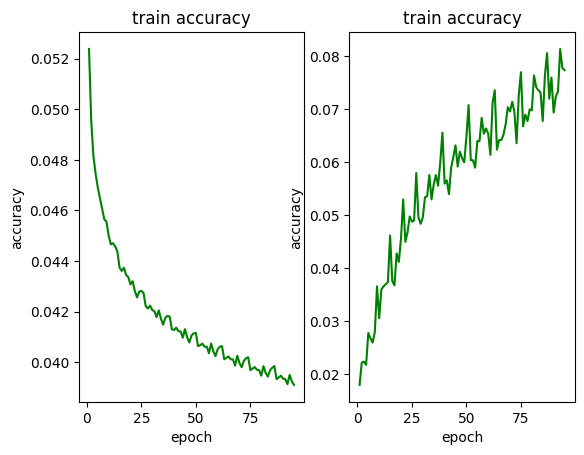

2023-04-19 19:16:22   epoch:    8 , batch:  600 , avg_batch_acc:0.0766 , avg_batch_loss:0.0394 , lr:0.001000 


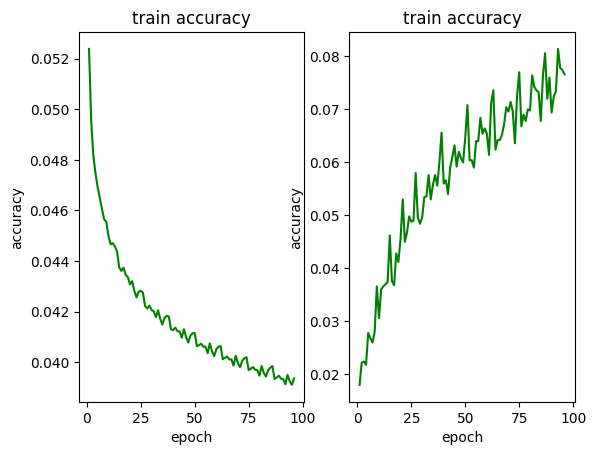

2023-04-19 19:16:24    **********epoch:    8 , avg_epoch_acc:0.0756 , avg_epoch_loss:0.0394 *************
------------test_set_acc:0.0533---------------


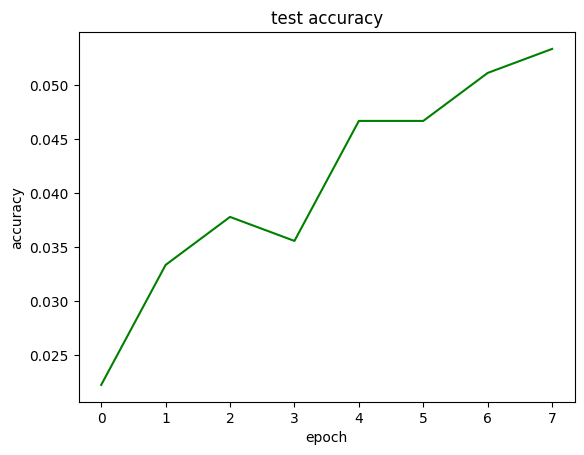

2023-04-19 19:16:27   epoch:    9 , batch:   50 , avg_batch_acc:0.0696 , avg_batch_loss:0.0395 , lr:0.001000 


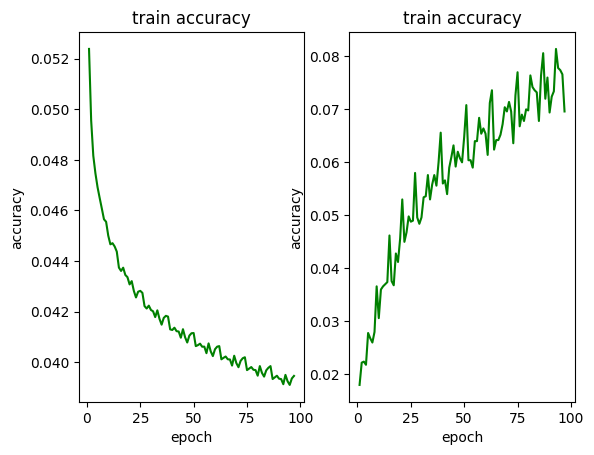

2023-04-19 19:16:31   epoch:    9 , batch:  100 , avg_batch_acc:0.0794 , avg_batch_loss:0.0395 , lr:0.001000 


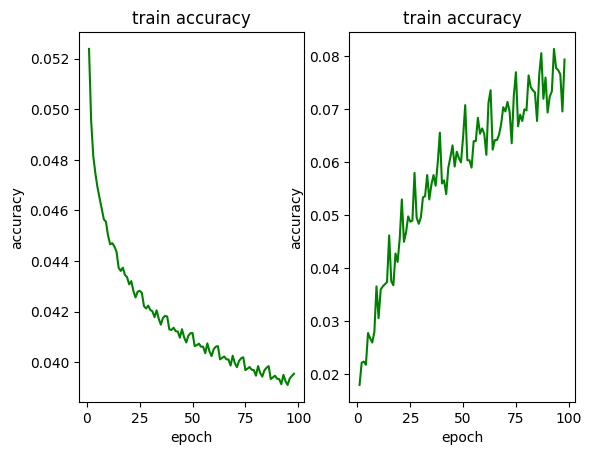

2023-04-19 19:16:34   epoch:    9 , batch:  150 , avg_batch_acc:0.0832 , avg_batch_loss:0.0390 , lr:0.001000 


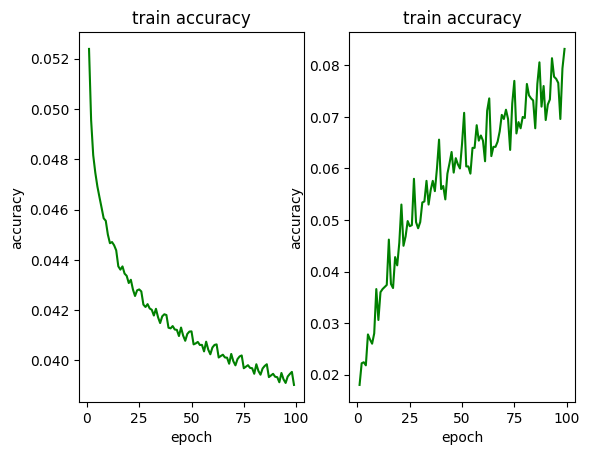

2023-04-19 19:16:37   epoch:    9 , batch:  200 , avg_batch_acc:0.0784 , avg_batch_loss:0.0391 , lr:0.001000 


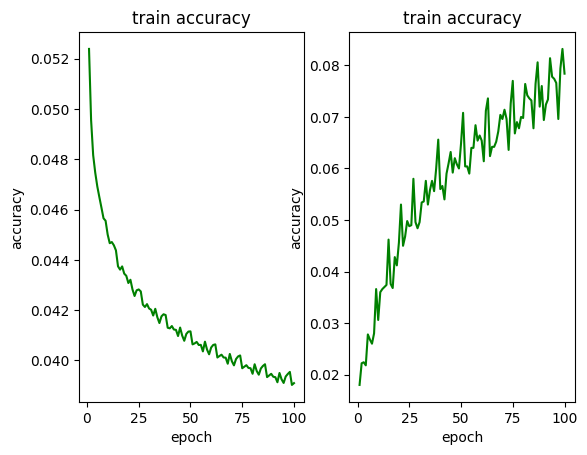

2023-04-19 19:16:40   epoch:    9 , batch:  250 , avg_batch_acc:0.0798 , avg_batch_loss:0.0392 , lr:0.001000 


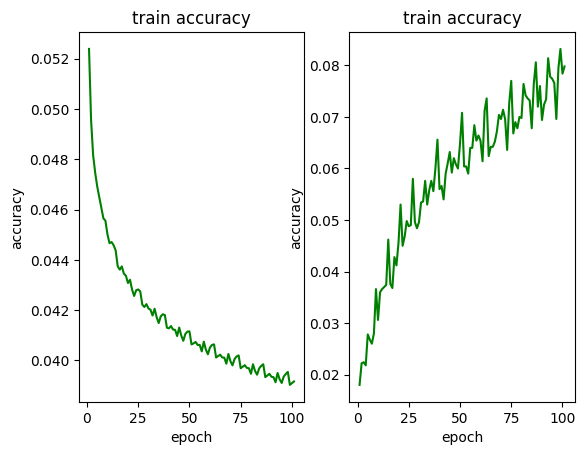

2023-04-19 19:16:43   epoch:    9 , batch:  300 , avg_batch_acc:0.0740 , avg_batch_loss:0.0390 , lr:0.001000 


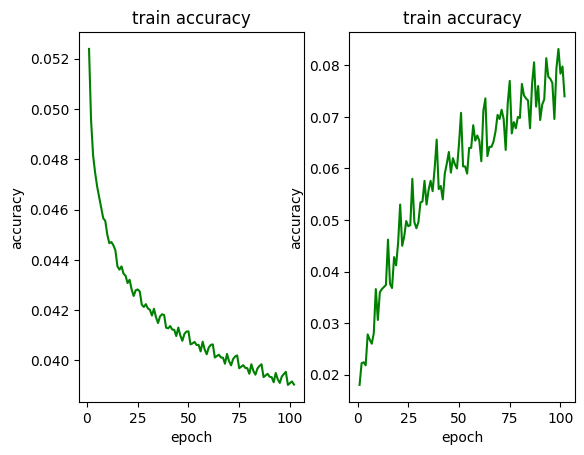

2023-04-19 19:16:46   epoch:    9 , batch:  350 , avg_batch_acc:0.0760 , avg_batch_loss:0.0390 , lr:0.001000 


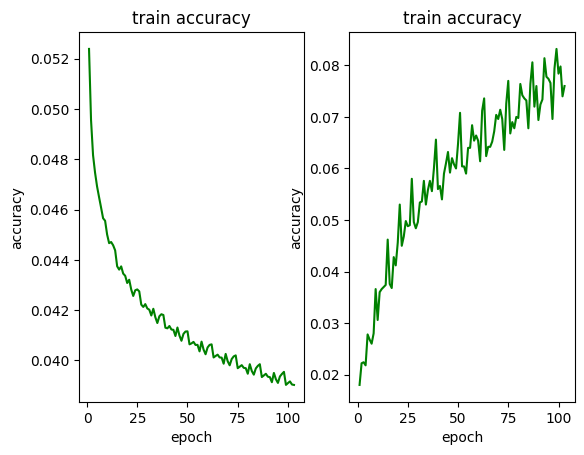

2023-04-19 19:16:50   epoch:    9 , batch:  400 , avg_batch_acc:0.0768 , avg_batch_loss:0.0388 , lr:0.001000 


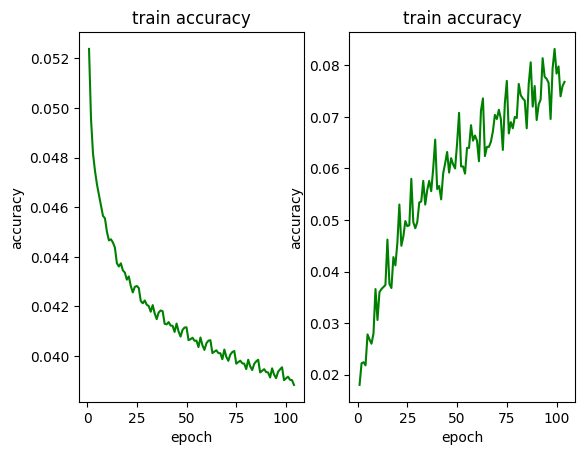

2023-04-19 19:16:53   epoch:    9 , batch:  450 , avg_batch_acc:0.0836 , avg_batch_loss:0.0392 , lr:0.001000 


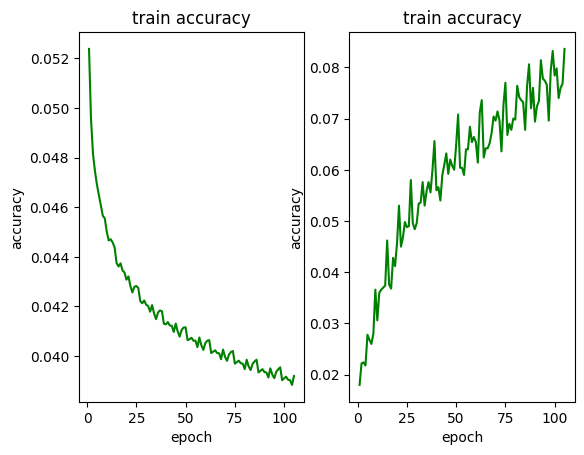

2023-04-19 19:16:56   epoch:    9 , batch:  500 , avg_batch_acc:0.0796 , avg_batch_loss:0.0390 , lr:0.001000 


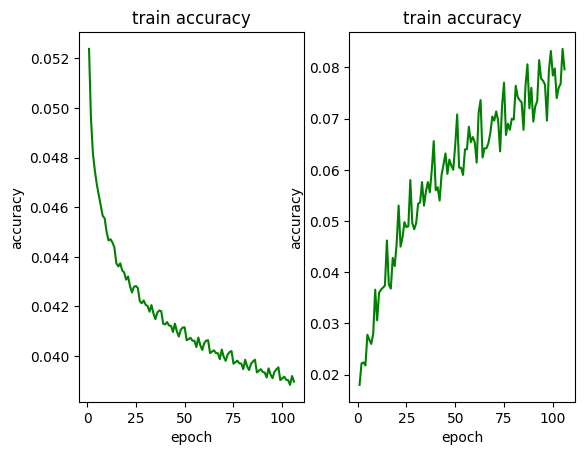

2023-04-19 19:16:59   epoch:    9 , batch:  550 , avg_batch_acc:0.0804 , avg_batch_loss:0.0388 , lr:0.001000 


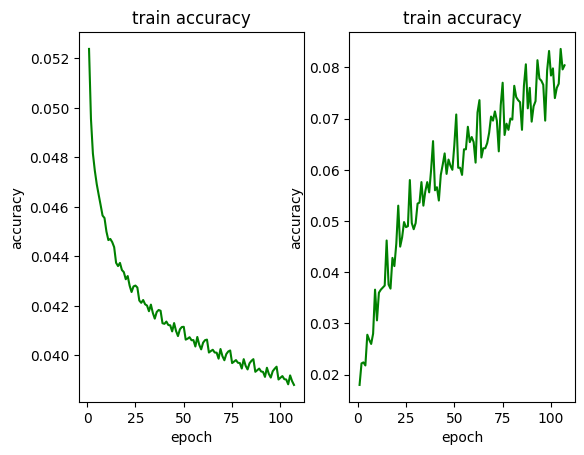

2023-04-19 19:17:03   epoch:    9 , batch:  600 , avg_batch_acc:0.0804 , avg_batch_loss:0.0391 , lr:0.001000 


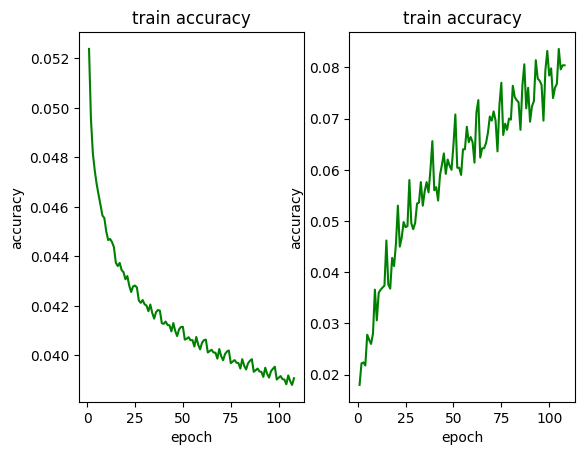

2023-04-19 19:17:05    **********epoch:    9 , avg_epoch_acc:0.0788 , avg_epoch_loss:0.0391 *************
------------test_set_acc:0.0533---------------


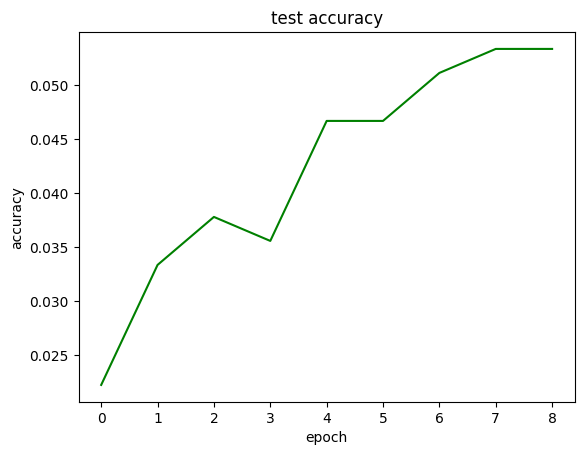

2023-04-19 19:17:08   epoch:   10 , batch:   50 , avg_batch_acc:0.0726 , avg_batch_loss:0.0392 , lr:0.001000 


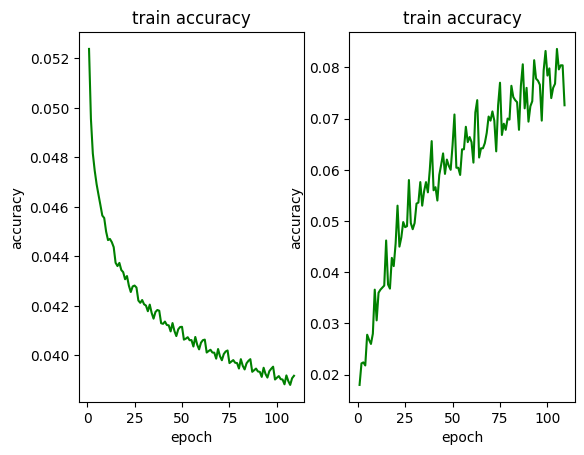

2023-04-19 19:17:11   epoch:   10 , batch:  100 , avg_batch_acc:0.0822 , avg_batch_loss:0.0393 , lr:0.001000 


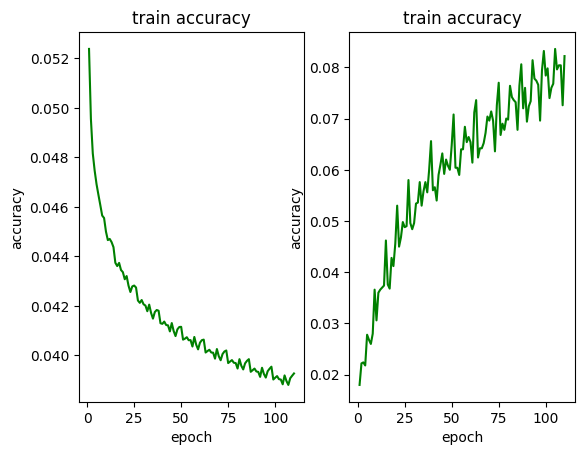

2023-04-19 19:17:15   epoch:   10 , batch:  150 , avg_batch_acc:0.0854 , avg_batch_loss:0.0388 , lr:0.001000 


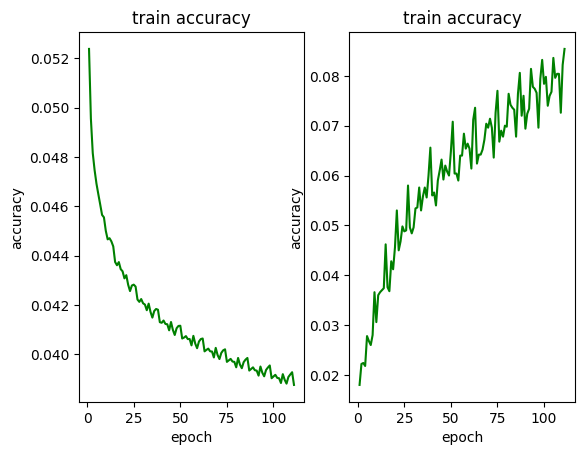

2023-04-19 19:17:18   epoch:   10 , batch:  200 , avg_batch_acc:0.0800 , avg_batch_loss:0.0388 , lr:0.001000 


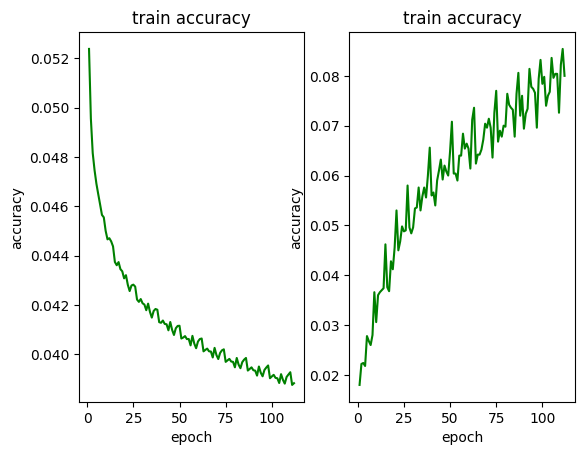

2023-04-19 19:17:21   epoch:   10 , batch:  250 , avg_batch_acc:0.0806 , avg_batch_loss:0.0389 , lr:0.001000 


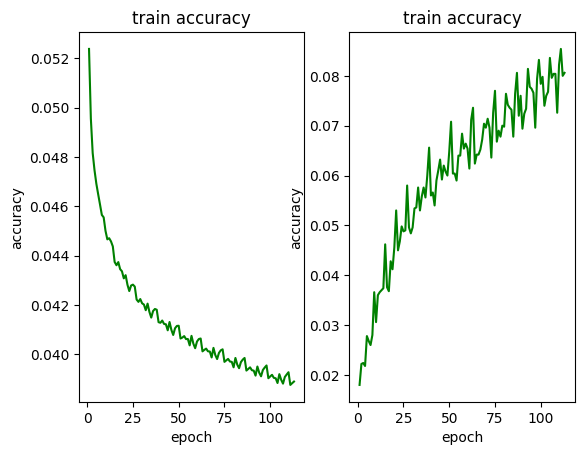

2023-04-19 19:17:24   epoch:   10 , batch:  300 , avg_batch_acc:0.0770 , avg_batch_loss:0.0388 , lr:0.001000 


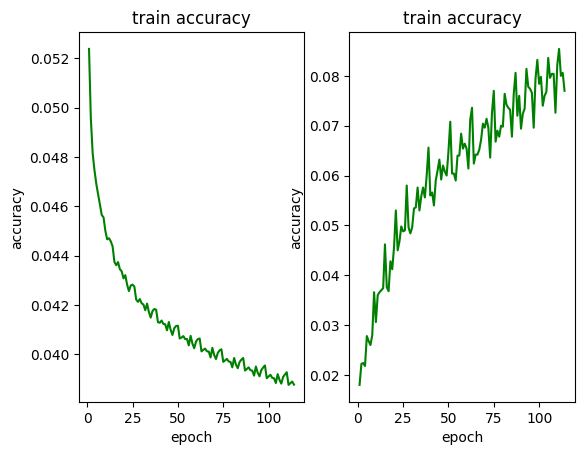

2023-04-19 19:17:27   epoch:   10 , batch:  350 , avg_batch_acc:0.0810 , avg_batch_loss:0.0388 , lr:0.001000 


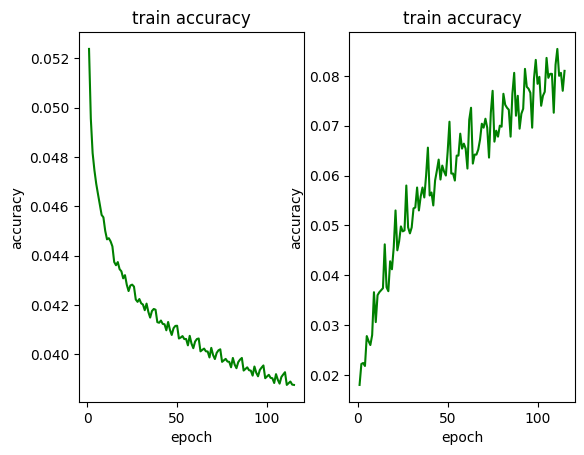

2023-04-19 19:17:31   epoch:   10 , batch:  400 , avg_batch_acc:0.0812 , avg_batch_loss:0.0386 , lr:0.001000 


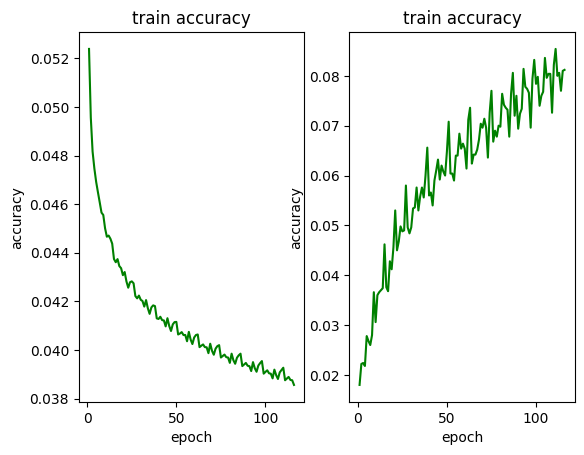

2023-04-19 19:17:34   epoch:   10 , batch:  450 , avg_batch_acc:0.0860 , avg_batch_loss:0.0389 , lr:0.001000 


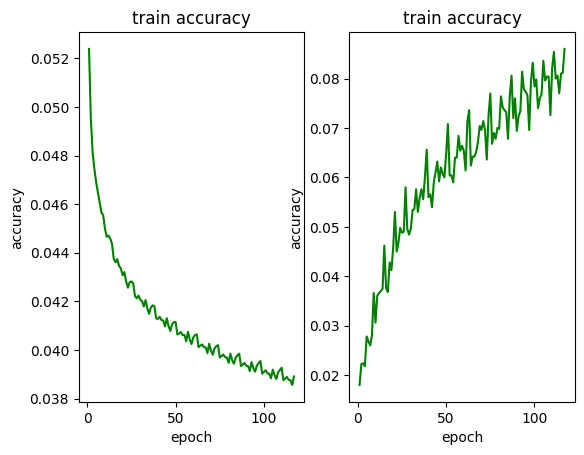

2023-04-19 19:17:37   epoch:   10 , batch:  500 , avg_batch_acc:0.0826 , avg_batch_loss:0.0387 , lr:0.001000 


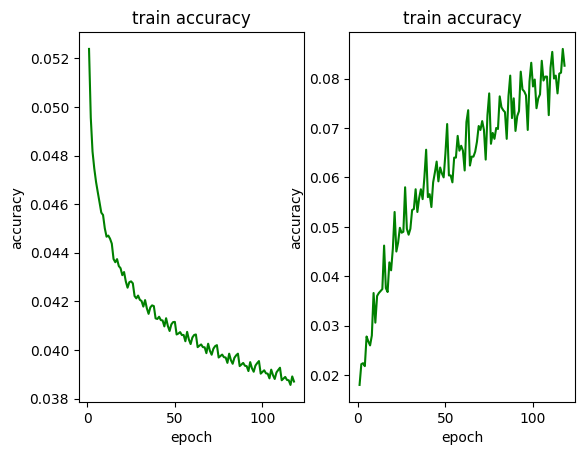

2023-04-19 19:17:40   epoch:   10 , batch:  550 , avg_batch_acc:0.0836 , avg_batch_loss:0.0385 , lr:0.001000 


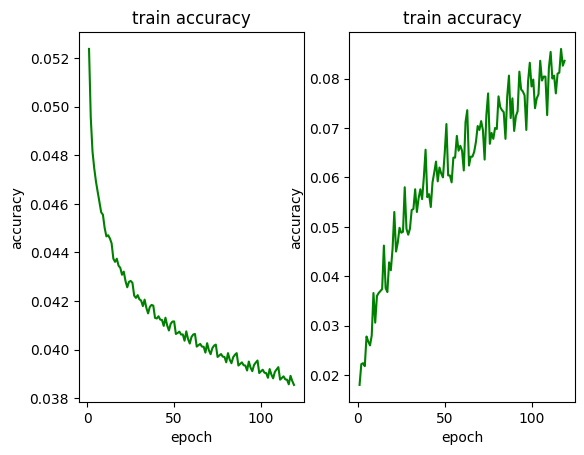

2023-04-19 19:17:44   epoch:   10 , batch:  600 , avg_batch_acc:0.0834 , avg_batch_loss:0.0388 , lr:0.001000 


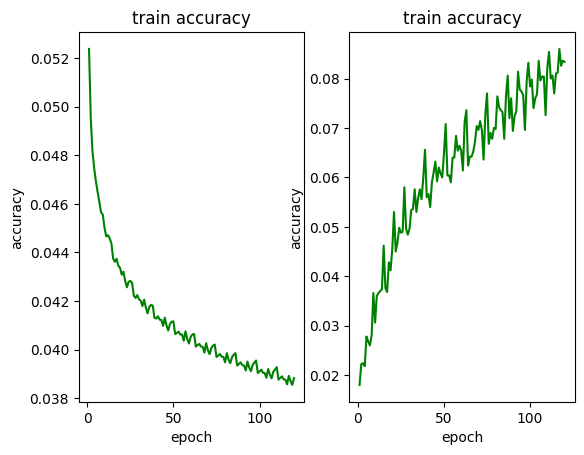

2023-04-19 19:17:46    **********epoch:   10 , avg_epoch_acc:0.0817 , avg_epoch_loss:0.0388 *************
------------test_set_acc:0.0511---------------


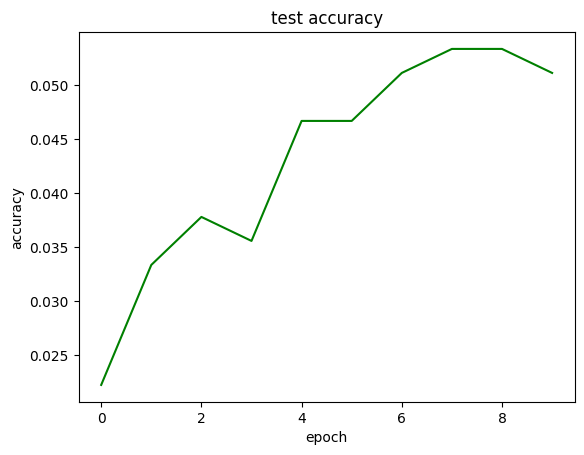

In [7]:
for E in range(epoch):
    batch_loss = 0
    batch_acc = 0

    epoch_loss = 0
    epoch_acc = 0
    #for i in range(10):
    for i in range(traindata.shape[0] // batch_size):
    
        #img = train_images[i*batch_size:(i+1)*batch_size].reshape(batch_size, 3, 28, 28)
        img = traindata[i*batch_size:(i+1)*batch_size]
        img = normalization.normalization(img)
        #label = train_labels[i*batch_size:(i+1)*batch_size]
        label = traindata_y[i*batch_size:(i+1)*batch_size]
        loss, prediction = net.forward(img, label, is_train=True)   # 训练阶段

        epoch_loss += loss
        batch_loss += loss
        for j in range(prediction.shape[0]):
            if np.argmax(prediction[j]) == label[j]:
                epoch_acc += 1
                batch_acc += 1

        net.backward(learning_rate)

        if (i+1)%50 == 0:
            print(time.strftime("%Y-%m-%d %H:%M:%S") +
                  "   epoch:%5d , batch:%5d , avg_batch_acc:%.4f , avg_batch_loss:%.4f , lr:%f "
                  % (E+1, i+1, batch_acc/(batch_size*50), batch_loss/(batch_size*50), learning_rate))
            # 绘制loss和acc变化曲线
            plt.figure(1)
            iterations_num += 1
            plt.clf()
            ax.append(iterations_num)
            ay_loss.append(batch_loss/(batch_size*50))
            ay_acc.append(batch_acc/(batch_size*50))
            plt.subplot(1, 2, 1)
            plt.title('train accuracy')  # 添加子标题
            plt.xlabel('epoch', fontsize=10)  # 添加轴标签
            plt.ylabel('accuracy', fontsize=10)
            plt.plot(ax, ay_loss, 'g-')

            plt.subplot(1, 2, 2)
            plt.title('train accuracy')  # 添加子标题
            plt.xlabel('epoch', fontsize=10)  # 添加轴标签
            plt.ylabel('accuracy', fontsize=10)
            plt.plot(ax, ay_acc, 'g-')
            plt.pause(0.4)  # 设置暂停时间，太快图表无法正常显示

            batch_loss = 0
            batch_acc = 0



    print(time.strftime("%Y-%m-%d %H:%M:%S") +
          "    **********epoch:%5d , avg_epoch_acc:%.4f , avg_epoch_loss:%.4f *************"
          % (E+1, epoch_acc/traindata.shape[0], epoch_loss/traindata.shape[0]))
    # 在test set上进行测试
    test_acc = 0
    for k in range(testdata.shape[0] // test_batch):
        img = testdata[k*test_batch:(k+1)*test_batch]
        img = normalization.normalization(img)
        label = testdata_y[k*test_batch:(k+1)*test_batch]
        _, prediction = net.forward(img, label, is_train=False)   # 测试阶段

        for j in range(prediction.shape[0]):
            if np.argmax(prediction[j]) == label[j]:
                test_acc += 1

    print("------------test_set_acc:%.4f---------------" % (test_acc / testdata.shape[0]))
    plt.figure(2)
    plt.clf()
    testx.append(E)
    testy_acc.append(test_acc / testdata.shape[0])
    plt.subplot()
    plt.title('test accuracy')  # 添加子标题
    plt.xlabel('epoch', fontsize=10)  # 添加轴标签
    plt.ylabel('accuracy', fontsize=10)
    plt.plot(testx, testy_acc, 'g-')
    plt.pause(0.4)  # 设置暂停时间，太快图表无法正常显示


plt.ioff()       # 关闭画图的窗口，即关闭交互模式
plt.show()       # 显示图片，防止闪退

In [8]:
img = testdata
img = normalization.normalization(img)
label = testdata_y
_, test_prediction = net.forward(img, label, is_train=False)   # 测试阶段


img = valdata
img = normalization.normalization(img)
label = valdata_y
_, val_prediction = net.forward(img, label, is_train=False)   # 测试阶段


np.save("model_1L_testout.npy",test_prediction)
np.save("model_1L_valout.npy",val_prediction)

In [9]:
test_acc = 0
for j in range(test_prediction.shape[0]):
    if np.argmax(test_prediction[j]) == testdata_y[j]:
        test_acc += 1
print("test_acc:",test_acc/450)

val_acc = 0
for j in range(val_prediction.shape[0]):
    if np.argmax(val_prediction[j]) == valdata_y[j]:
        val_acc += 1
print("val_acc",val_acc/450)

test_acc: 0.07333333333333333
val_acc 0.09333333333333334
